In [1]:
pip install imageio[ffmpeg]

Note: you may need to restart the kernel to use updated packages.


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import corner 
from tqdm import tqdm
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from adjustText import adjust_text
# plt.rcParams['text.usetex'] = False
# plt.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'


#Another option for plotting
# pip install scienceplots
import scienceplots 
plt.style.use('science')


# #Some colors that Pablo likes:
colors = [
    "#1f77b4", # Vivid blue
    "#ff7f0e", # Bright orange
    "#2ca02c", # Rich green
    "#d62728", # Strong red
    "#9467bd", # Deep purple
    # "#8c564b", # Brownish-pink
    "#e377c2", # Pink
    "#7f7f7f", # Medium gray
    "#bcbd22", # Lime green
    "#17becf", # Cyan
    "#393b79", # Dark blue
    "#637939", # Olive green
    "#8c6d31", # Bronze
    # "#843c39", # Dark red
    # "#ad494a", # Reddish brown
    "#d6616b", # Soft red
    "#e7ba52", # Golden yellow
    "#7b4173", # Dark purple
    "#a55194", # Mauve
    "#ce6dbd", # Light purple
]

colors_sets = [
    "#ff7f0e",

    "#1f77b4",

    "#2ca02c",
    "#d62728",
    
    "#9467bd",
    "#8c564b",
    "#e377c2",
    "#7f7f7f",
    "#bcbd22",
    "#17becf",
    '#1f77b4',  # muted blue
    'r',  
] 

markers = [
    "o",  # Circle
    "^",  # Triangle up
    "s",  # Square
    "P",  # Plus (filled)
    "*",  # Star
    "X",  # X (filled)
    "D",  # Diamond
    "H",  # Hexagon
]


colors_models = colors


Selected_element=50
Selected_element_name="Sn"

color_train=colors_sets[9]
color_validation='orange'
color_test=colors_sets[3]

marker_train='s'
marker_validation='*'
marker_test='o'



size_train=30
size_validation=80
size_test=35

alpha_train=0.8
alpha_validation=0.9
alpha_test=0.4

models = [ 'ME2', 'MEdelta', 'PC1', 'NL3S', 'SKMS', 'SKP', 'SLY4', 'SV', 'UNEDF0', \
        'UNEDF1']#Here I am copying all the models with Charge Raidus and Masses
models_selected = [ 'ME2', 'MEdelta', 'PC1', 'NL3S', 'SKMS', 'SKP', 'SLY4', 'SV', 'UNEDF0', \
        'UNEDF1']#Here I am copying all the models with Charge Raidus and Masses
key_list = models_selected

heterogeneous_data_type = ['BE', 'ChRad', 'CPn', 'CPp', 'PEn', 'PEp', 'QDB2n', 'QDB2p', 'QDB4n', 'QDB4p', 'MRadN', 'MRadP']
num_properties = 2

In [2]:
a = pd.read_csv('data/charge_radii.csv') # I download the radii data separately
a.rename(columns = {'z' : 'Z', 'n' : 'N'}, inplace = True) # Rename the column N, Z

In [3]:
# This cell helps you to extract a dictionary that contains all the nuclei with BE and radius predictions of all the models we have
models_data_sets = {}
for model in models:
    Data_Values = pd.read_hdf("./data./selected_data.h5", key = model)
    models_data_sets[model] = {"N" : Data_Values["N"], "Z" : Data_Values["Z"], "BE" : Data_Values["BE"], 'ChRad': Data_Values['ChRad']}


filtered_NZ = np.array([models_data_sets[models_selected[0]]['N'].tolist(), models_data_sets[models_selected[0]]['Z'].tolist() ]).T
filtered_NZ

array([[  2,   2],
       [  4,   2],
       [  6,   2],
       ...,
       [156, 108],
       [158, 108],
       [160, 110]])

## Necessary Functions

In [4]:
def separate_points_random(list1,random_chance):
    """
    Separates points in list1 into two groups randomly

    """
    train = []
    test = []

    train_list_coordinates=[]
    test_list_coordinates=[]


    for i in range(len(list1)):
        point1=list1[i]
        val=np.random.rand()
        if val<=random_chance:
            train.append(point1)
            train_list_coordinates.append(i)
        else:
            test.append(point1)
            test_list_coordinates.append(i)

    return np.array(train), np.array(test), np.array(train_list_coordinates), np.array(test_list_coordinates)

def separate_points_distance(list1, list2, distance):
    """
    Separates points in list1 into two groups based on their proximity to any point in list2.

    :param list1: List of (x, y) tuples.
    :param list2: List of (x, y) tuples.
    :param distance: The threshold distance to determine proximity.
    :return: Two lists - close_points and distant_points.
    """
    train = []
    test = []

    train_list_coordinates=[]
    test_list_coordinates=[]

    for i in range(len(list1)):
        point1=list1[i]
        close = False
        for point2 in list2:
            if np.linalg.norm(np.array(point1) - np.array(point2)) <= distance:
                close = True
                break
        if close:
            train.append(point1)
            train_list_coordinates.append(i)
        else:
            test.append(point1)
            test_list_coordinates.append(i)

    return np.array(train), np.array(test), np.array(train_list_coordinates), np.array(test_list_coordinates)

def separate_points_distance_allSets(list1, list2, distance1, distance2):
    """
    Separates points in list1 into three groups based on their proximity to any point in list2.

    :param list1: List of (x, y) tuples.
    :param list2: List of (x, y) tuples.
    :param distance: The threshold distance to determine proximity.
    :return: Two lists - close_points and distant_points.
    """
    train = []
    validation=[]
    test = []

    train_list_coordinates=[]
    validation_list_coordinates=[]
    test_list_coordinates=[]

    for i in range(len(list1)):
        point1=list1[i]
        close = False
        for point2 in list2:
            if np.linalg.norm(np.array(point1) - np.array(point2)) <= distance1:
                close = True
                break
        if close:
            train.append(point1)
            train_list_coordinates.append(i)
        else:
            close2=False
            for point2 in list2:
                if np.linalg.norm(np.array(point1) - np.array(point2)) <= distance2:
                    close2 = True
                    break
            if close2==True:
                validation.append(point1)
                validation_list_coordinates.append(i)
            else:
                test.append(point1)
                test_list_coordinates.append(i)                

    return np.array(train),np.array(validation), np.array(test), np.array(train_list_coordinates),  np.array(validation_list_coordinates),np.array(test_list_coordinates)

In [5]:
def filtered_NZ_extraction(filtered_NZ):
    #We want to create a function that takes only even-even nuclei with N,Z >= 8
    filtered_NZ_new = []
    for isotope in filtered_NZ:
        if ((isotope[0] >= 8) & (isotope[1] >=8)) & ((isotope[0]%2 == 0) & (isotope[1]%2 == 0)): # Sort the even-even isotope with proton and neutron number 8 or above
            filtered_NZ_new.append(isotope)
    filtered_NZ_new  = np.array(filtered_NZ_new)
    return filtered_NZ_new

def unified_NZ_extraction(models_data_sets, models_selected, filtered_NZ):
    #We want to create a function that extracts nuclei that exist in every models
    for model in models_selected:
        filtered_NZ_new = []
        for isotope in filtered_NZ:
            if ( (isotope[0] == models_data_sets[model]['N']) & (isotope[1] == models_data_sets[model]['Z']) ).any(): # Choose nuclei that are contained in each model
                filtered_NZ_new.append(isotope)
        filtered_NZ = np.array(filtered_NZ_new) #update our new list of isotope and repeat this for every model
    filtered_NZ_df = pd.DataFrame({'N' : filtered_NZ.T[0], 'Z' : filtered_NZ.T[1]})
    return filtered_NZ_new, filtered_NZ_df

def selected_models_data_sets_extraction(models_data_sets, models_selected, filtered_NZ_df, property):
    #We want to create dataframe that contains all the model predictions of a property of interest
    selected_models_data_sets = pd.DataFrame(filtered_NZ_df) #Initiate the dataframe by the proton and neutron number
    for model in models_selected:
        merged_df = pd.merge(filtered_NZ_df, pd.DataFrame(models_data_sets[model]), on = ['N', 'Z'], how  = 'inner') # Merge the isotope with their corresponding predictions
        selected_models_data_sets[model] = merged_df[property] # Choose the properties we want to perfrom BMM from
    return selected_models_data_sets

def models_output_extraction(selected_models_data_sets, train_coordinates, validation_coordinates, test_coordinates):
    #Technically rearrange the columns of the selected_models_data_sets and separate into intrapolation and extrapolation part
    models_output = selected_models_data_sets.copy()
    models_output['A'] = models_output['N'] + models_output['Z'] # Put the mass number in our dataframe
    cols = list(models_output.columns)
    cols[2], cols[-1] = cols[-1], cols[2] # Rearranging columns 
    models_output = models_output[cols]

    models_output_train = models_output.iloc[train_coordinates] # Training regions
    models_output_validation = models_output.iloc[validation_coordinates] # Validation regions
    models_output_test = models_output.iloc[test_coordinates] # Test regions
    return [models_output, models_output_train, models_output_validation, models_output_test]

def filtered_models_output_extraction(Selected_element, models_output, train_coordinates, validation_coordinates, test_coordinates):
    # Extract models output dataframe for a specific isotope and separate them into training, validation, and testing regions
    Z_range = (Selected_element, Selected_element) # Choose element we want to analyze
    N_range = (0,300)
    filtered_models_output = models_output[(models_output['Z'] >= Z_range[0]) & (models_output['Z'] <= Z_range[1]) & 
                         (models_output['N'] >= N_range[0]) & (models_output['N'] <= N_range[1])]  
    
    filtered_models_output_train = models_output.iloc[train_coordinates][(models_output.iloc[train_coordinates]['Z'] >= Z_range[0]) & (models_output.iloc[train_coordinates]['Z'] <= Z_range[1]) & 
                         (models_output.iloc[train_coordinates]['N'] >= N_range[0]) & (models_output.iloc[train_coordinates]['N'] <= N_range[1])]
    
    filtered_models_output_validation = models_output.iloc[validation_coordinates][(models_output.iloc[validation_coordinates]['Z'] >= Z_range[0]) & (models_output.iloc[validation_coordinates]['Z'] <= Z_range[1]) & 
                         (models_output.iloc[validation_coordinates]['N'] >= N_range[0]) & (models_output.iloc[validation_coordinates]['N'] <= N_range[1])]
    
    filtered_models_output_test = models_output.iloc[test_coordinates][(models_output.iloc[test_coordinates]['Z'] >= Z_range[0]) & (models_output.iloc[test_coordinates]['Z'] <= Z_range[1]) & 
                         (models_output.iloc[test_coordinates]['N'] >= N_range[0]) & (models_output.iloc[test_coordinates]['N'] <= N_range[1])]

    return [filtered_models_output, filtered_models_output_train, filtered_models_output_validation, filtered_models_output_test]

def filtered_models_output_stable_extraction(Selected_element, models_output, stable_coordinates):
    # Extract models output dataframe for stable isotope for a specific element
    Z_range = (Selected_element, Selected_element) # Choose element we want to analyze
    N_range = (0,300)
    stable_isotopes = []
    for isotope in stable_coordinates:
        if isotope[1] == Selected_element: #Choose isotope that has the same proton number
            stable_isotopes.append(isotope)
    stable_isotopes = np.array(stable_isotopes)
    
    filtered_models_output_stable = models_output[(models_output['Z'] >= Z_range[0]) & (models_output['Z'] <= Z_range[1])\
                                                 & (models_output['N'] >= N_range[0]) & (models_output['N'] <= N_range[1]) & models_output['N'].isin(stable_isotopes.T[0])]
    return filtered_models_output_stable

def filtered_models_output_dict_extraction(Selected_elements, key_name, models_output, train_coordinates, validation_coordinates, test_coordinates, stable_coordinates):
    # This functions helps me to create the filtered models output for different isotopes at the same time and store them in a dictionary
    filtered_models_output_dict = {} # Initiate dictionary
    for j in Selected_elements:
        key = f"{key_name}" + f"{int(j)}" # name is the key-value pair in the dictionary
        # The line below store the list of filtered models output for a specific element in the dictionary
        filtered_models_output_dict[key] = filtered_models_output_extraction(int(j), models_output, train_coordinates, validation_coordinates, test_coordinates)
        # The line below add to the list we have above the stable isotopes into our list
        filtered_models_output_dict[key].append(filtered_models_output_stable_extraction(int(j), models_output, stable_coordinates))
    filtered_models_output_dict.keys() # This is just to check if I had the right name for the list
    return filtered_models_output_dict

def models_PC_output(Vt_hat, model_predictions, predictions_mean, models_output):
    # This fucntions returns the dataframe of 
    models_PC = {}
    models_PC['N'] = models_output['N']
    models_PC['Z'] = models_output['Z']
    models_PC['A'] = models_output['N'] + models_output['Z']
    models_PC['PC_0'] = predictions_mean

    for i in range(len(Vt_hat)):
        models_PC['PC_' + str(i+1)] = Vt_hat[i].dot(model_predictions.T)
    model_PC = pd.DataFrame(models_PC)
    return model_PC

# Right now there are some more functions that we need for the statistical interference but we did not write it here yet
def USVt_hat_extraction(U,S,Vt, components_kept):
    U_hat = np.array([U.T[i] for i in range(components_kept)]).T
    S_hat = S[:components_kept]
    Vt_hat = np.array([Vt[i]/S[i] for i in range(components_kept)])
    Vt_hat_normalized = np.array([Vt[i] for i in range(components_kept)])
    return U_hat, S_hat, Vt_hat, Vt_hat_normalized

def super_params(X,y):
    X_T_X = X.T.dot(X)
    X_T_X_inv = np.linalg.inv(X_T_X)
    super_param = X_T_X_inv.dot(X.T).dot(y) 
    return super_param

def weights_params_translation(super_params, Vt_hat):
    model_weights = np.dot(super_params, Vt_hat) + np.full(len(Vt_hat[0]) , 1/len(Vt_hat[0]))
    model_weights = np.array(model_weights)
    return model_weights

def residuals_calculator(model_weights, model_predictions_list, models_output_list):
    #Note that we for every models output list we put all nuclei first, and then train, validation, test region
    supermodel_full = model_weights.dot(model_predictions_list[0].T)
    supermodel_train = model_weights.dot(model_predictions_list[1].T)
    supermodel_validation = model_weights.dot(model_predictions_list[2].T)
    supermodel_test = model_weights.dot(model_predictions_list[3].T)

    supermodel_residuals_full = supermodel_full-models_output_list[0]['truth'].tolist()
    supermodel_residuals_train=supermodel_train-models_output_list[1]['truth'].tolist()
    supermodel_residuals_validation= supermodel_validation-models_output_list[2]['truth'].tolist()
    supermodel_residuals_test = supermodel_test-models_output_list[3]['truth'].tolist()

    return supermodel_residuals_full, supermodel_residuals_train, supermodel_residuals_validation, supermodel_residuals_test

def supermodel_residuals_calculator(components_kept, model_predictions, predictions_mean, models_output, models_output_list, model_predictions_list):
    U_hat, S_hat, Vt_hat, Vt_hat_normalised = USVt_hat_extraction(U,S,Vt, components_kept) # This gives you the approximation matrix
    # Note that we for any list that we create, we will put full dataset first, and then train, validation, test respectively
    # models_PC_train = models_PC_output(Vt_hat, model_predictions_list[1], predictions_mean) # This gives you the matrix of the PCs
    
    # key_list_PCs=list(models_PC_train.keys()) # columns' names of the PCs matrix

    models_PC_train = models_PC_output(Vt_hat, model_predictions, predictions_mean, models_output)
    X = models_PC_train.values[:,4:]# This is the matrix of the PCs
    # print(X.shape)
    y = models_output['truth'] - predictions_mean
    beta = super_params(X,y) #Calculate the best OLS beta
    model_weights = weights_params_translation(beta, Vt_hat) #Translate from the PCs' params to models' weights
    print(model_weights)

    supermodel_residuals_full, supermodel_residuals_train, supermodel_residuals_validation, supermodel_residuals_test = residuals_calculator(model_weights,\
                                                                                                            model_predictions_list, models_output_list)

    return [supermodel_residuals_full, supermodel_residuals_train, supermodel_residuals_validation, supermodel_residuals_test]

def PC_RMSE_calculator(components_kept, model_predictions, predictions_mean, models_output, models_output_list, model_predictions_list):
    # model_predictions and predictions_mean are variables that related to PCA decomposition, and models_output part are related to
    # the part where we want to calculate RMSE
    supermodel_residuals_full, supermodel_residuals_train, supermodel_residuals_validation, supermodel_residuals_test = supermodel_residuals_calculator(\
                                                            components_kept, model_predictions, predictions_mean, models_output, models_output_list, model_predictions_list)
    sigma_train=np.sqrt(np.sum(supermodel_residuals_train**2) / len(supermodel_residuals_train) )
    sigma_validation=np.sqrt(np.sum(supermodel_residuals_validation**2) / len(supermodel_residuals_validation) )
    sigma_test=np.sqrt(np.sum(supermodel_residuals_test**2) / len(supermodel_residuals_test) )
    sigma_full=np.sqrt(np.sum(supermodel_residuals_full**2) / len(supermodel_residuals_full) )
    print(sigma_train)

    return [sigma_full,sigma_train,sigma_validation,sigma_test]

def rndm_m_radius_calculator(model_weights, filtered_model_predictions, samples):
    rndm_m_radius = []
    for i in range(len(model_weights)):
        if centering_data:
            yvals_rand_radius= filtered_model_predictions.dot(model_weights[i].T)
        # else:
        #     yvals_rand= X_full_filtered.T.dot(theta_rand[i][0:-1])
    
        rndm_m_radius.append(yvals_rand_radius +
                       np.random.multivariate_normal(np.full(
                           len(yvals_rand_radius)
                           ,0), np.diag(1.0 * np.full(len(yvals_rand_radius),1.0 * samples[i][-1]**2 ) )))  
        
    lower_radius = np.percentile(rndm_m_radius, 2.5, axis = 0)
    median_radius = np.percentile(rndm_m_radius, 50, axis = 0)
    upper_radius = np.percentile(rndm_m_radius, 97.5, axis = 0)

    return [lower_radius, median_radius, upper_radius]

def rndm_m_radius_samples(X, samples, total_samples):
    np.random.seed(142857)
    rng = np.random.default_rng()
    
    theta_rand_selected = rng.choice(samples, min((total_samples),len(samples)), replace=False)

    rndm_m_radius = []
    for i in range(len(theta_rand_selected)):
        if centering_data:
            yvals_rand_radius= X.dot(np.insert(theta_rand_selected[i][0:-1], 0, 1))
        # else:
        #     yvals_rand= X_full_filtered.T.dot(theta_rand[i][0:-1])
    
        rndm_m_radius.append(yvals_rand_radius +
                       np.random.multivariate_normal(np.full(
                           len(yvals_rand_radius)
                           ,0), np.diag(1.0 * np.full(len(yvals_rand_radius),1.0 * theta_rand_selected[i][-1]**2 ) )))  
    
    rndm_m_radius = np.array(rndm_m_radius)

    return rndm_m_radius

def coverage(percentiles, rndm_m, models_output):
    percentiles = np.arange(0, 101, 5)


    data_total=len(rndm_m.T)
    data_true=models_output["truth"].tolist()
    M_evals=len(rndm_m)


    coverage = []

    for p in percentiles:
        count_covered = 0
        for i in range(data_total):
            # Sort model evaluations for the i-th data point
            sorted_evals = np.sort(rndm_m.T[i])
            
            # Find indices for lower and upper bounds of the credible interval
            lower_idx = int((0.5 - p / 200) * M_evals)
            upper_idx = int((0.5 + p / 200) * M_evals) - 1  # Adjusted to avoid out-of-bounds
            
            # Check if the true value y[i] is within this interval
            if sorted_evals[lower_idx] <= data_true[i] <= sorted_evals[upper_idx]:
                count_covered += 1
                
        # Calculate and store the coverage percentage
        coverage.append(count_covered / data_total * 100)
    
    return coverage
    


In [6]:
def plot_filtered_supermodel(supermodel_predictions_range, filtered_models_output_list, filtered_models_output_stable, Z, unit, property, Constraint, title):
    plt.rc("xtick", labelsize=30)
    plt.rc("ytick", labelsize=30)

    plt.rcParams['text.usetex'] = False
    plt.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'
    
    lower, median, upper = supermodel_predictions_range

    filtered_models_output= filtered_models_output_list[0]
    filtered_models_output_train= filtered_models_output_list[1]
    filtered_models_output_validation= filtered_models_output_list[2]
    filtered_models_output_test = filtered_models_output_list[3]
    # filtered_models_output_stable = filtered_models_output_list[4]
    
    fig, ax = plt.subplots(figsize=(10,8), dpi=150)
    
    plt.plot(filtered_models_output["N"], median, color="darkkhaki", label=f'$f^\dagger$({Constraint})',linewidth=3)
    
    plt.plot(filtered_models_output["N"], lower, color="darkkhaki",linestyle="dashed",linewidth=2,alpha=0.5)
    plt.plot(filtered_models_output["N"], upper, color="darkkhaki",linestyle="dashed",linewidth=2,alpha=0.5)
    
    plt.fill_between(filtered_models_output["N"], lower, upper, color="darkkhaki",alpha=0.3)
    
    color_local= "khaki"
    
    
    # plt.plot(filtered_models_output["N"], -median_simplex_local/filtered_models_output['A'], color='purple', label='$f^\dagger$(Simplex Local)',linewidth=3)
    
    # # plt.plot(filtered_models_output["N"], lower, color=color_simplex,linestyle="dashed",linewidth=3,alpha=0.8)
    # # plt.plot(filtered_models_output["N"], upper, color=color_simplex,linestyle="dashed",linewidth=3,alpha=0.8)
    
    
    # plt.plot(filtered_models_output["N"], -lower_simplex_local/filtered_models_output['A'], color="purple",linestyle="dashed",linewidth=2,alpha=0.8)
    # plt.plot(filtered_models_output["N"], -upper_simplex_local/filtered_models_output['A'], color="purple",linestyle="dashed",linewidth=2,alpha=0.8)
    
    # plt.fill_between(filtered_models_output["N"], -lower_simplex_local/filtered_models_output['A'], -upper_simplex_local/filtered_models_output['A'], color='purple',alpha=0.3)
    
    ax.scatter(x = filtered_models_output_train["N"], y = filtered_models_output_train['truth'], label = "$\mathcal{X}_0^{tr}$",  alpha = alpha_train,color=color_train,s=100,marker=marker_train,zorder=2)
    
    ax.scatter(x = filtered_models_output_validation["N"], y = filtered_models_output_validation['truth'], label = "$\mathcal{X}_0^{va}$", alpha=alpha_validation ,color=color_validation,s=100,marker=marker_validation,zorder=2)

    ax.scatter(x = filtered_models_output_test["N"], y = filtered_models_output_test['truth'], label = "$\mathcal{X}_0^{te}$", alpha = alpha_test,color=color_test,s=100,marker=marker_test,zorder=2)
    
    ax.scatter(x = filtered_models_output_stable["N"], y = filtered_models_output_stable['truth'], label = "Stable", alpha = 0.9,color='k',s=80,marker="s",zorder=2)
    
    
    
    
    
    plt.xlabel("Neutrons",fontsize=35)
    plt.ylabel(f"(Z= {Z}) $ {{\\cal {property}}}$ [{unit}]", fontsize=33)
    # plt.ylabel(Selected_element_name+ " BE/A MeV",fontsize=25)
     
    plt.legend(fontsize=20,markerscale=1,ncol=2,columnspacing=0.5)

    plt.title(f'Radius Calibration with {title} component(s)', fontsize = 25)
    # plt.savefig(f'{save_fig}')
    # plt.show()

def plot_filtered_naive_supermodel(filtered_naive_supermodel_list, filtered_models_output_list, filtered_models_output_stable, Z, unit, property, Constraint, title):
    plt.rc("xtick", labelsize=30)
    plt.rc("ytick", labelsize=30)

    plt.rcParams['text.usetex'] = False
    plt.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'

    filtered_models_output= filtered_models_output_list[0]
    filtered_models_output_train= filtered_models_output_list[1]
    filtered_models_output_validation= filtered_models_output_list[2]
    filtered_models_output_test = filtered_models_output_list[3]
    # filtered_models_output_stable = filtered_models_output_list[4]
    
    fig, ax = plt.subplots(figsize=(10,8), dpi=150)
    
    plt.plot(filtered_naive_supermodel_list[0]["N"], filtered_naive_supermodel_list[0]['naive supermodel'], color="darkkhaki", label=f'$f^\dagger$({Constraint})',linewidth=3)
    
    color_local= "khaki"
    
    
    # plt.plot(filtered_models_output["N"], -median_simplex_local/filtered_models_output['A'], color='purple', label='$f^\dagger$(Simplex Local)',linewidth=3)
    
    # # plt.plot(filtered_models_output["N"], lower, color=color_simplex,linestyle="dashed",linewidth=3,alpha=0.8)
    # # plt.plot(filtered_models_output["N"], upper, color=color_simplex,linestyle="dashed",linewidth=3,alpha=0.8)
    
    
    # plt.plot(filtered_models_output["N"], -lower_simplex_local/filtered_models_output['A'], color="purple",linestyle="dashed",linewidth=2,alpha=0.8)
    # plt.plot(filtered_models_output["N"], -upper_simplex_local/filtered_models_output['A'], color="purple",linestyle="dashed",linewidth=2,alpha=0.8)
    
    # plt.fill_between(filtered_models_output["N"], -lower_simplex_local/filtered_models_output['A'], -upper_simplex_local/filtered_models_output['A'], color='purple',alpha=0.3)
    
    ax.scatter(x = filtered_models_output_train["N"], y = filtered_models_output_train['truth'], label = "$\mathcal{X}_0^{tr}$",  alpha = alpha_train,color=color_train,s=100,marker=marker_train,zorder=2)
    
    ax.scatter(x = filtered_models_output_validation["N"], y = filtered_models_output_validation['truth'], label = "$\mathcal{X}_0^{va}$", alpha=alpha_validation ,color=color_validation,s=100,marker=marker_validation,zorder=2)

    ax.scatter(x = filtered_models_output_test["N"], y = filtered_models_output_test['truth'], label = "$\mathcal{X}_0^{te}$", alpha = alpha_test,color=color_test,s=100,marker=marker_test,zorder=2)
    
    ax.scatter(x = filtered_models_output_stable["N"], y = filtered_models_output_stable['truth'], label = "Stable", alpha = 0.9,color='k',s=80,marker="s",zorder=2)
    
    
    
    
    
    plt.xlabel("Neutrons",fontsize=35)
    plt.ylabel(f"(Z= {Z}) $ {{\\cal {property}}}$ [{unit}]", fontsize=33)
    # plt.ylabel(Selected_element_name+ " BE/A MeV",fontsize=25)
     
    plt.legend(fontsize=20,markerscale=1,ncol=2,columnspacing=0.5)

    plt.title(f'Naive Radius Calibration with {title} component(s)', fontsize = 25)
    # plt.savefig(f'{save_fig}')
    # plt.show()

def plot_model_predictions(filtered_models_output_list, models_selected, Selected_element_name):
    plt.rc("xtick", labelsize=30)
    plt.rc("ytick", labelsize=30)

    plt.rcParams['text.usetex'] = False
    plt.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'

    filtered_models_output= filtered_models_output_list[0]
    filtered_models_output_train= filtered_models_output_list[1]
    filtered_models_output_validation= filtered_models_output_list[2]
    filtered_models_output_test = filtered_models_output_list[3]
    filtered_models_output_stable = filtered_models_output_list[4]
    
    fig, ax = plt.subplots(figsize=(10,8), dpi=150)
    i = 0
    for model in models_selected:
        plt.plot(filtered_models_output['N'], filtered_models_output[model],label = model, color=colors[i], alpha = 0.9,linewidth=5, zorder = 1)
        i+=1
    ax.scatter(x = filtered_models_output_train["N"], y = filtered_models_output_train['truth'], label = "Truth-Train",  alpha = 1,color=color_train,s=200,marker=marker_train,zorder=2)

    ax.scatter(x = filtered_models_output_validation["N"], y = filtered_models_output_validation['truth'], label = "Truth-Validation", alpha = 1,color=color_validation,s=350,marker=marker_validation,zorder=2)
    
    ax.scatter(x = filtered_models_output_test["N"], y = filtered_models_output_test['truth'], label = "Truth-Test", alpha = 1,color=color_test,s=350,marker=marker_test,zorder=2)
    
    ax.scatter(x = filtered_models_output_stable["N"], y = filtered_models_output_stable['truth'], label = "Truth-Stable", alpha = 1,color='k',s=80,marker="s",zorder=2)
    
    
    
    plt.xlabel("N",fontsize=35)
    plt.ylabel(Selected_element_name+" R(fm)",fontsize=35)
    # plt.legend(fontsize=18,markerscale=1 )
    plt.legend(fontsize=15,markerscale=1,ncol=2  )
    # plt.savefig(f'{savefig}')
    plt.show()

def plot_filtered_real_data_dict(Selected_elements_list, element_name, filtered_models_output_dict):
    # Selected_element_list are the name of the elements, Selected_element is the number of proton that element has.
    i = Selected_elements_list.index(element_name)# This gives you the index of the element you want to graph
    dict_keys = list(filtered_models_output_dict.keys()) # This gives you all the keys in the dictionary that we input

    plt.rc("xtick", labelsize=30)
    plt.rc("ytick", labelsize=30)
    
    plt.rcParams['text.usetex'] = False
    plt.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'
    
    fig, ax = plt.subplots(figsize=(10,8), dpi=150)
    # This gives you the mean predictions of the isotope that we choose

    # color_local= "khaki"

    # This gives you training experimental data for these isotope
    ax.scatter(x = filtered_models_output_dict[dict_keys[i]][1]["N"], y = filtered_models_output_dict[dict_keys[i]][1]['truth'], label = "$\mathcal{X}_0^{tr}$",  alpha = alpha_train,color=color_train,s=100,marker=marker_train,zorder=2)
    # This gives you validation experimental data for these isotope
    ax.scatter(x = filtered_models_output_dict[dict_keys[i]][2]["N"], y = filtered_models_output_dict[dict_keys[i]][2]['truth'], label = "$\mathcal{X}_0^{va}$", alpha=alpha_validation ,color=color_validation,s=100,marker=marker_validation,zorder=2)
    # This gives you testing experimental data for these isotope
    ax.scatter(x = filtered_models_output_dict[dict_keys[i]][3]["N"], y = filtered_models_output_dict[dict_keys[i]][3]['truth'], label = "$\mathcal{X}_0^{te}$", alpha = alpha_test,color=color_test,s=100,marker=marker_test,zorder=2)
    # This gives you stable experimental data for these isotope
    ax.scatter(x = filtered_models_output_dict[dict_keys[i]][4]["N"], y = filtered_models_output_dict[dict_keys[i]][4]['truth'], label = "Stable", alpha = 0.9,color='k',s=80,marker="s",zorder=2)

def plot_filtered_something_else_dict(Selected_elements_list, element_name, Selected_element, filtered_models_output_dict, filtered_models_something_else_dict, what_you_want_to_graph):
    plot_filtered_real_data_dict(Selected_elements_list, element_name, filtered_models_output_dict) # This plots all the experimental data
    index = Selected_elements_list.index(element_name) #Again, this gives you the index of the element you are trying to graph
    dict_keys = list(filtered_models_something_else_dict.keys()) # This gives you all the key of the dictionary that we want to create
    filtered_models_something_else = filtered_models_something_else_dict[dict_keys[index]][0][what_you_want_to_graph] #This is the dataframe that we want to graph from
    for i in range(len(filtered_models_something_else.columns)):
        column = list(filtered_models_something_else.columns)[i]
        plt.plot(filtered_models_something_else_dict[dict_keys[index]][0]['N'], filtered_models_something_else[column], color= colors[i], label= column,linewidth=5)

    plt.xlabel("Neutrons",fontsize=35)
    plt.ylabel(f"(Z= {Selected_element}) $ {{\\cal R}}$ [fm]", fontsize=33)
    # plt.ylabel(Selected_element_name+ " BE/A MeV",fontsize=25)
         
    plt.legend(fontsize=20,markerscale=1,ncol=2,columnspacing=0.5)
    
    # plt.title(f'{title}', fontsize = 25)
    # plt.savefig(f'{save_fig}')
    # plt.show()
# Let'steal this from Pablo like we always do
def plot_heatmap(xvals, yvals, zvals, quantity_of_interest, model):
    # Create scatter plot
    plt.rc("xtick", labelsize=10)
    plt.rc("ytick", labelsize=10)
    fig, ax = plt.subplots(figsize = (4,3), dpi = 200)
    
    sc = ax.scatter(xvals, yvals, c=zvals, s=0.5, cmap='plasma', marker = 's')
    # plt.colorbar(sc, label='Z-Value')
    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label(f'{quantity_of_interest}', fontsize=10) 
    cbar.ax.tick_params(labelsize=10) 
    
    plt.xlabel('Neutrons',fontsize=10)
    plt.ylabel('Protons',fontsize=10)

    ax.set_xlim(min(xvals) - 5, max(xvals) + 5)
    ax.set_ylim(min(yvals) - 5, max(yvals) + 5)
    
    ax.grid(True)
    ax.axis('equal')
    plt.title(f'{model}')
    plt.tight_layout()
    # plt.savefig(f'{savefig}')
    # plt.show()

def plot_heatmap_3D(xvals, yvals, zvals, title, elev=30, azim=-60):
    # Create figure and 3D axes
    fig, ax_3d = plt.subplots(figsize=(4, 3), dpi=200, subplot_kw={'projection': '3d'})
    
    # Normalize z values
    # z_normalized = (zvals - zvals.min()) / (zvals.max() - zvals.min())
    z_normalized = zvals # This is when we want to see the actual components of the PCs
    # Define the size of the bars
    dx = dy = 1.5  # Width of the bars in the x and y directions
    dz = z_normalized  # Height of the bars (z values)

    # Create 3D bar plot
    ax_3d.bar3d(xvals, yvals, np.zeros_like(z_normalized), dx, dy, dz, color=plt.cm.plasma((zvals - zvals.min()) / (zvals.max() - zvals.min())))
    ax_3d.set_zlim(np.minimum(0, zvals.min()), zvals.max())
    # Set view angle
    ax_3d.view_init(elev=elev, azim=azim) 
    
    ax_3d.tick_params(axis='both', labelsize=8)  # Smaller font size for major ticks
    ax_3d.tick_params(axis='z', labelsize=8)
    
    # Set labels and title
    ax_3d.set_xlabel('Neutrons', fontsize = 5)
    ax_3d.set_ylabel('Protons', fontsize = 5)
    ax_3d.set_zlabel('Scaled Z', fontsize = 5)
    ax_3d.set_title(title)

    # Create a colorbar based on the plasma colormap and the normalization
    mappable = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=zvals.min(), vmax=zvals.max()))
    mappable.set_array(zvals)
    
    # Add the colorbar to the plot
    cbar = plt.colorbar(mappable, ax=ax_3d, shrink=0.5, aspect=10, location='right', pad=0.2)
    cbar.set_label(title, fontsize=5)
    cbar.ax.tick_params(labelsize=5)

    # Show plot
    # plt.show()

<>:18: SyntaxWarning: invalid escape sequence '\d'
<>:39: SyntaxWarning: invalid escape sequence '\m'
<>:41: SyntaxWarning: invalid escape sequence '\m'
<>:43: SyntaxWarning: invalid escape sequence '\m'
<>:76: SyntaxWarning: invalid escape sequence '\d'
<>:92: SyntaxWarning: invalid escape sequence '\m'
<>:94: SyntaxWarning: invalid escape sequence '\m'
<>:96: SyntaxWarning: invalid escape sequence '\m'
<>:166: SyntaxWarning: invalid escape sequence '\m'
<>:168: SyntaxWarning: invalid escape sequence '\m'
<>:170: SyntaxWarning: invalid escape sequence '\m'
<>:18: SyntaxWarning: invalid escape sequence '\d'
<>:39: SyntaxWarning: invalid escape sequence '\m'
<>:41: SyntaxWarning: invalid escape sequence '\m'
<>:43: SyntaxWarning: invalid escape sequence '\m'
<>:76: SyntaxWarning: invalid escape sequence '\d'
<>:92: SyntaxWarning: invalid escape sequence '\m'
<>:94: SyntaxWarning: invalid escape sequence '\m'
<>:96: SyntaxWarning: invalid escape sequence '\m'
<>:166: SyntaxWarning: inval

In [7]:
def Plotter2D_single(xvals, yvals, zvals, validation_set,quantity_of_interest, model):
    # xvals,yvals,zvals = data
    #A plotter to see principal components in 2D
    plt.rc("xtick", labelsize=25)
    plt.rc("ytick", labelsize=25)
    
    fig, ax = plt.subplots(figsize=(12, 8), dpi=200)

    # Create scatter plot
    sc = ax.scatter(xvals, yvals, c=zvals, s=25, cmap='plasma',marker='s')
    # plt.colorbar(sc, label='Z-Value')
    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label(f'{quantity_of_interest}', fontsize=25)
    ax.scatter(validation_set.T[0], validation_set.T[1], color = 'black', alpha = 1, marker = 'o', s = 35)
    cbar.ax.tick_params(labelsize=20) 
    plt.xlabel('Neutrons',fontsize=25)
    plt.ylabel('Protons',fontsize=25)

    ax.grid(True)
    # ax.axis('equal')
    plt.title(f'{model}', fontsize = 25)
    # plt.show()

def Plotter3D_single(xvals, yvals, zvals, title, elev=30, azim=-60):
    # xvals,yvals,zvals = data
    #A plotter to see principal components in 3D
    plt.rc("xtick", labelsize=15)
    plt.rc("ytick", labelsize=15)

    z_min = zvals.min()
    z_max = zvals.max()
    z_normalized = zvals

    # Create figure for 3D plot
    fig = plt.figure(figsize=(8, 6), dpi=200)
    ax = fig.add_subplot(111, projection='3d')



    # Define the size of the bars
    dx = dy = 1.5  # Width of the bars in the x and y direction
    dz = z_normalized        # Height of the bars (z values)

    # Create 3D bar plot
    ax.bar3d(xvals, yvals, np.zeros_like(zvals), dx, dy, dz, color=plt.cm.plasma((zvals - zvals.min()) / (zvals.max() - zvals.min())))
    ax.set_zlim(np.minimum(0, zvals.min()), zvals.max())
    ax.view_init(elev=elev, azim=azim) 

    # Setting labels and title
    ax.set_xlabel('Neutrons')
    ax.set_ylabel('Protons')
    ax.set_zlabel('Z value')
    ax.set_title(title)

    mappable = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=zvals.min(), vmax=zvals.max()))
    mappable.set_array(zvals)

    # Add the colorbar to the plot
    cbar = plt.colorbar(mappable, ax=ax, shrink=0.5, aspect=10, location='right', pad=0.2)
    cbar.set_label(title, fontsize=20)
    cbar.ax.tick_params(labelsize=20)
    
    # plt.show()



def Plotter2D(ax, xvals, yvals, zvals, validation_set, quantity_of_interest, model):
    #A plotter to see principal components in 2D, part of the big plotter


    # Create scatter plot
    sc = ax.scatter(xvals, yvals, c=zvals, s=25, cmap='plasma',marker='s')
    # plt.colorbar(sc, label='Z-Value')
    cbar = plt.colorbar(sc, ax=ax)
    ax.scatter(validation_set.T[0], validation_set.T[1], color = 'white', alpha = 1, marker = 'o', s = 35)
    cbar.set_label(f'{quantity_of_interest}', fontsize=25) 
    cbar.ax.tick_params(labelsize=20) 




    plt.xlabel('Neutrons',fontsize=25)
    plt.ylabel('Protons',fontsize=25)

    plt.title(f'{model}', fontsize = 25)
    ax.grid(True)
    ax.axis('equal')

    # plt.show()

def Plotter3D(ax,xvals,yvals,zvals,elev=30,azim=-60):
    #A plotter to see principal components in 3D, part of the big plotter
    z_min = zvals.min()
    z_max = zvals.max()
    z_normalized = zvals

    # Create figure for 3D plot
    # fig = plt.figure(figsize=(8, 6), dpi=200)
    # ax = fig.add_subplot(111, projection='3d')



    # Define the size of the bars
    dx = dy = 1.5  # Width of the bars in the x and y direction
    dz = z_normalized        # Height of the bars (z values)

    # Create 3D bar plot
    ax.bar3d(xvals, yvals, np.zeros_like(zvals), dx, dy, dz, color=plt.cm.plasma((zvals - zvals.min()) / (zvals.max() - zvals.min())))
    ax.set_zlim(np.minimum(0, zvals.min()), zvals.max())
    ax.view_init(elev=elev, azim=azim) 

    # Setting labels and title
    ax.set_xlabel('Neutrons')
    ax.set_ylabel('Protons')
    ax.set_zlabel('Scaled Z')


    # plt.show()    



def PlotMultiple(xvals, yvals, zvals, validation_set, quantity_of_interest, model, angles_sheet=None):
    # Determine the number of rows needed for the plots
    # n_rows = len(data_sets)
    # Each data_sets element should look like [x,y,z]

    # Create a figure with subplots
    fig = plt.figure(figsize=(20, 8), dpi=200)


    # 2D plot
    ax_2d = fig.add_subplot(1, 2, 1)
    Plotter2D(ax_2d, xvals, yvals, zvals, validation_set, quantity_of_interest, model)

    # 3D plot
    ax_3d = fig.add_subplot(1, 2, 2, projection='3d')
    if angles_sheet == None:
        Plotter3D(ax_3d, xvals, yvals, zvals)
    else:
        Plotter3D(ax_3d, xvals, yvals, zvals,elev=angles_sheet[0],azim=angles_sheet[1])

    plt.tight_layout()
    # plt.show()

### From the new functions that we wrote above, we will need to create the models_output_list and model_predictions_list. 

In [8]:
stable_coordinates_full=np.loadtxt("Stable-Isotopes.txt")
stable_coordinates = filtered_NZ_extraction(stable_coordinates_full) # Make sure that nuclei we analyze have proton and neutron number of 8 or above

In [9]:
filtered_NZ = filtered_NZ_extraction(filtered_NZ) # This one will choose even-even isotope with N,Z >= 8
filtered_NZ, filtered_NZ_df = unified_NZ_extraction(models_data_sets, models_selected, filtered_NZ)

In [10]:
#Let's create a dataframe that contains all the model predictions
selected_models_data_sets_mass = selected_models_data_sets_extraction(models_data_sets, models_selected, filtered_NZ_df, 'BE')
selected_models_data_sets_radius = selected_models_data_sets_extraction(models_data_sets, models_selected, filtered_NZ_df, 'ChRad')

# This dataset does not yet contain the real data, let's now merge this dataset with the real data
truth_BE = pd.read_hdf("./data./selected_data.h5", key = 'AME2020')
truth_BE_df = pd.DataFrame(truth_BE)
selected_models_data_sets_mass = pd.merge(selected_models_data_sets_mass, truth_BE[['N', 'Z', 'BE']], on = ['N', 'Z'], how = 'inner') #Add real data to the dataframe
selected_models_data_sets_mass.rename(columns = {'BE' : 'truth'}, inplace = True) #Rename our truth column
cols_mass = list(selected_models_data_sets_mass.keys())
cols_mass.remove('truth')
cols_mass.insert(2, 'truth') # These 2 lines rearrange the order fo the column
selected_models_data_sets_mass = selected_models_data_sets_mass[cols_mass]

# This is for the radius data
truth_CR_df = a
selected_models_data_sets_radius = pd.merge(selected_models_data_sets_radius, truth_CR_df[['N', 'Z',  'radius_val']], how = 'inner', on = ['N', 'Z'])
selected_models_data_sets_radius.rename(columns = {'radius_val' : 'truth'}, inplace = True)
cols_radius = list(selected_models_data_sets_radius.keys())
# The next 2 lines help you to transition the truth column to the start of the dataframe
cols_radius.remove('truth')
cols_radius.insert(2, 'truth')
selected_models_data_sets_radius = selected_models_data_sets_radius[cols_radius]
selected_models_data_sets_radius = selected_models_data_sets_radius.copy().dropna().reset_index(drop = True)
selected_models_data_sets_radius

,N,Z,truth,ME2,MEdelta,PC1,NL3S,SKMS,SKP,SLY4,SV,UNEDF0,UNEDF1
0,8,8,2.6991,2.729,2.691,2.747,2.735,2.794203,2.824011,2.795792,2.817382,2.793546,2.790816
1,10,8,2.7726,2.733,2.704,2.749,2.728,2.793734,2.825080,2.799074,2.807857,2.785015,2.781329
2,8,10,2.9714,2.956,2.912,2.945,2.955,2.956188,2.987489,2.964309,2.991813,2.966094,2.973445
3,10,10,3.0055,2.986,2.942,2.975,2.973,2.942506,2.973045,2.951974,2.974810,2.935663,2.967315
4,12,10,2.9525,2.960,2.949,2.978,2.941,2.964141,2.972133,2.976913,2.981346,2.925008,2.968485
...,...,...,...,...,...,...,...,...,...,...,...,...,...
340,150,94,5.8948,5.933,5.920,5.930,5.942,5.910061,5.918577,5.915247,5.902641,5.908618,5.923415
341,146,96,5.8285,5.935,5.921,5.933,5.936,5.919476,5.928108,5.924384,5.908823,5.911968,5.928126
342,148,96,5.8429,5.948,5.938,5.947,5.951,5.929864,5.939063,5.934703,5.920200,5.923912,5.940104
343,150,96,5.8562,5.958,5.945,5.956,5.964,5.939141,5.949234,5.944656,5.930929,5.935161,5.951470


### We now have 2 separate nuclei set for mass and radii

In [11]:
filtered_NZ_df_radius = selected_models_data_sets_radius[['N', 'Z']]
filtered_NZ_radius = np.array(filtered_NZ_df_radius)
Full_set_radius = filtered_NZ_radius.copy()

filtered_NZ_df_mass = selected_models_data_sets_mass[['N', 'Z']]
filtered_NZ_mass = np.array(filtered_NZ_df_mass)
Full_set_mass = filtered_NZ_mass.copy()

### We now need to separate these nuclei to interpolation and extrapolation regions

In [12]:
stable_coordinates_df = pd.DataFrame({'N' : stable_coordinates.T[0], 'Z' : stable_coordinates.T[1]})
stable_coordinates_radius_df = pd.merge(filtered_NZ_df_radius, stable_coordinates_df, how = 'inner')
stable_coordinates_radius = stable_coordinates_radius_df.values

In [13]:
#Traditional way with stable coordinates to seperate our data points for nuclei - radius data sets

distance1=1.75
distance2=2.5

training_set_radius, validation_set_radius, test_set_radius, train_coordinates_radius, validation_coordinates_radius,test_coordinates_radius=separate_points_distance_allSets(filtered_NZ_radius, stable_coordinates, distance1,distance2)

In [14]:
#Traditional way with stable coordinates to seperate our data points for nuclei - mass data sets

distance1=2
distance2=3

training_set_mass, validation_set_mass, test_set_mass, train_coordinates_mass, validation_coordinates_mass,test_coordinates_mass=separate_points_distance_allSets(filtered_NZ_mass, stable_coordinates, distance1,distance2)

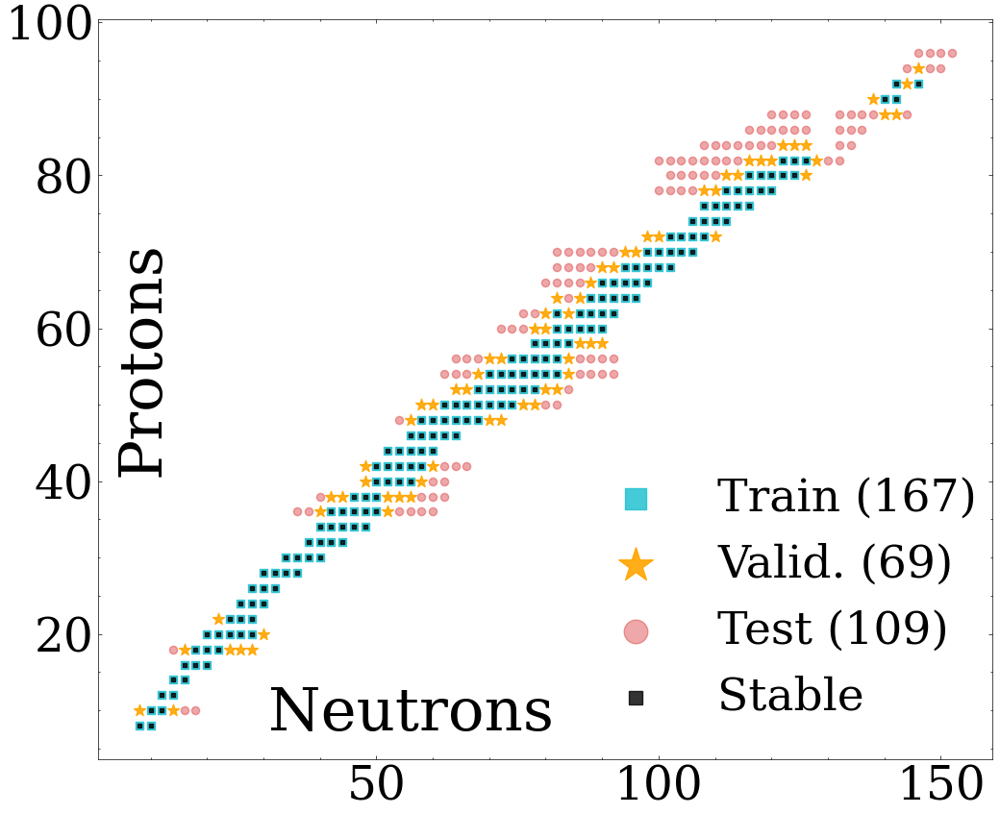

In [17]:
plt.rc("xtick", labelsize=35)
plt.rc("ytick", labelsize=35)

fig, ax = plt.subplots(figsize=(12,10), dpi=100)

plt.rcParams['text.usetex'] = False
# plt.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'

ax.scatter(x = training_set_radius.T[0], y = training_set_radius.T[1], label = "Train ("+ str(len(training_set_radius))+")", alpha = alpha_train,color=color_train,s=size_train,marker=marker_train)

ax.scatter(x = validation_set_radius.T[0], y = validation_set_radius.T[1], label = "Valid. (" + str(len(validation_set_radius))+")", alpha = alpha_validation,color=color_validation,s=size_validation,marker=marker_validation)

ax.scatter(x = test_set_radius.T[0], y = test_set_radius.T[1], label = "Test (" + str(len(test_set_radius))+")", alpha = alpha_test,color=color_test,s=size_test,marker=marker_test)

ax.scatter(x = stable_coordinates_radius.T[0], y = stable_coordinates_radius.T[1], label = "Stable", alpha = 0.8,color='black',s=11,marker="s")





# ax.scatter(x = np.array(AME2020New).T[0], y = np.array(AME2020New).T[1], label = "Valid. (" + str(len(validation_set))+")", alpha = alpha_validation,color=color_validation,s=size_validation,marker=marker_validation)


plt.xlabel('')

plt.annotate('Neutrons', xy=(0.35, 0.1), xycoords='axes fraction',
             ha='center', va='top', fontsize=45) 
plt.ylabel('')

plt.annotate('Protons', xy=(0.05,0.7), xycoords='axes fraction',
             ha='center', va='top', fontsize=45,rotation =90) 


# plt.ylabel("Protons",fontsize=45)
plt.legend(fontsize=34,markerscale=3 ,loc =(0.53,0.03))
plt.show()

In [17]:
# After having separated our data points into intrapolation and extrapolation part, first we have to extract all the model predictions and perform
# PCA on that data set

In [18]:
#Extract models output of different categories (mass and radius) and classify them into 4 regions: all,train, validation, test
models_output_mass_list = models_output_extraction(selected_models_data_sets_mass, train_coordinates_mass, validation_coordinates_mass, test_coordinates_mass)
models_output_radius_list = models_output_extraction(selected_models_data_sets_radius, train_coordinates_radius, validation_coordinates_radius, test_coordinates_radius)

In [19]:
#Separate them for further use
[models_output_mass, models_output_mass_train, models_output_mass_validation, models_output_mass_test] = models_output_mass_list
[models_output_radius, models_output_radius_train, models_output_radius_validation, models_output_radius_test] = models_output_radius_list

In [20]:
filtered_models_output_mass_list_50 = filtered_models_output_extraction(50, models_output_mass, train_coordinates_mass, validation_coordinates_mass, test_coordinates_mass)
filtered_models_output_radius_list_20 = filtered_models_output_extraction(20, models_output_radius, train_coordinates_radius, validation_coordinates_radius, test_coordinates_radius)

filtered_models_output_mass_stable_50 = filtered_models_output_stable_extraction(50, models_output_mass, stable_coordinates)
filtered_models_output_radius_stable_20 = filtered_models_output_stable_extraction(20, models_output_radius, stable_coordinates_radius)

[filtered_models_output_mass_50, filtered_models_output_mass_train_50, filtered_models_output_mass_validation_50, filtered_models_output_mass_test_50] = filtered_models_output_mass_list_50
[filtered_models_output_radius_50, filtered_models_output_radius_train_20, filtered_models_output_radius_validation_20, filtered_models_output_radius_test_20] = filtered_models_output_radius_list_20

model_predictions_mass=models_output_mass[key_list].values
model_predictions_mass_train=models_output_mass_train[key_list].values
model_predictions_mass_validation=models_output_mass_validation[key_list].values
model_predictions_mass_test=models_output_mass_test[key_list].values
model_predictions_mass_list = [model_predictions_mass, model_predictions_mass_train, model_predictions_mass_validation, model_predictions_mass_test]

model_predictions_radius=models_output_radius[key_list].values
model_predictions_radius_train=models_output_radius_train[key_list].values
model_predictions_radius_validation=models_output_radius_validation[key_list].values
model_predictions_radius_test=models_output_radius_test[key_list].values
model_predictions_radius_list = [model_predictions_radius, model_predictions_radius_train, model_predictions_radius_validation, model_predictions_radius_test]

model_predictions_combined = np.vstack((model_predictions_mass, model_predictions_radius))
model_predictions_combined_train = np.vstack((model_predictions_mass_train, model_predictions_radius_train))
model_predictions_combined_validation = np.vstack((model_predictions_mass_validation, model_predictions_radius_validation))
model_predictions_combined_test = np.vstack((model_predictions_mass_test, model_predictions_radius_test))
model_predictions_combined_list = [model_predictions_combined, model_predictions_combined_train, model_predictions_combined_validation, model_predictions_combined_test]

predictions_mean_mass= np.mean(model_predictions_mass, axis=1)
predictions_mean_mass_train= np.mean(model_predictions_mass_train, axis=1)
predictions_mean_mass_validation= np.mean(model_predictions_mass_validation, axis=1)
predictions_mean_mass_test= np.mean(model_predictions_mass_test, axis=1)

predictions_mean_radius= np.mean(model_predictions_radius, axis=1)
predictions_mean_radius_train= np.mean(model_predictions_radius_train, axis=1)
predictions_mean_radius_validation= np.mean(model_predictions_radius_validation, axis=1)
predictions_mean_radius_test= np.mean(model_predictions_radius_test, axis=1)

predictions_mean_combined= np.mean(model_predictions_combined, axis=1)
predictions_mean_combined_train= np.mean(model_predictions_combined_train, axis=1)
predictions_mean_combined_validation= np.mean(model_predictions_combined_validation, axis=1)
predictions_mean_combined_test= np.mean(model_predictions_combined_test, axis=1)

predictions_mean_radius_df = pd.DataFrame({'N' : filtered_NZ_radius.T[0], 'Z' : filtered_NZ_radius.T[1], 'PC_0' : predictions_mean_radius})

In [21]:
centering_data = True

if centering_data:
    model_predictions_mass_train_processed = model_predictions_mass_train - predictions_mean_mass_train[:,None]
    # model_predictions_mass_train_processed = model_predictions_mass_train - predictions_mean_mass_train.reshape(167,1)
    # model_predictions_mass_train_processed = model_predictions_mass_train - predictions_mean_mass_train[:,np.newaxis]

if centering_data:
    model_predictions_radius_train_processed = model_predictions_radius_train - predictions_mean_radius_train[:,None]
    # model_predictions_radius_train_processed = model_predictions_radius_train - predictions_mean_radius_train.reshape(167,1)
    # model_predictions_radius_train_processed = model_predictions_radius_train - predictions_mean_radius_train[:,np.newaxis]

if centering_data:
    model_predictions_combined_train_processed = model_predictions_combined_train - predictions_mean_combined_train[:, None]
    # model_predictions_combined_train_processed = model_predictions_combined_train - predictions_mean_combined_train.reshape(334,1)
    # model_predictions_combined_train_processed = model_predictions_combined_train - predictions_mean_combined_train[:, np.newaxis]

if centering_data:
    model_predictions_radius_validation_processed = model_predictions_radius_validation - predictions_mean_radius_validation[:,None]
    model_predictions_radius_test_processed = model_predictions_radius_test - predictions_mean_radius_test[:,None]
    model_predictions_radius_processed = model_predictions_radius - predictions_mean_radius[:,None]

[5.21253916e-01 2.69387165e-01 2.04832936e-01 1.39361808e-01
 1.10437197e-01 9.05100255e-02 7.20137408e-02 6.28564278e-02
 4.85942669e-02 2.09027186e-14]


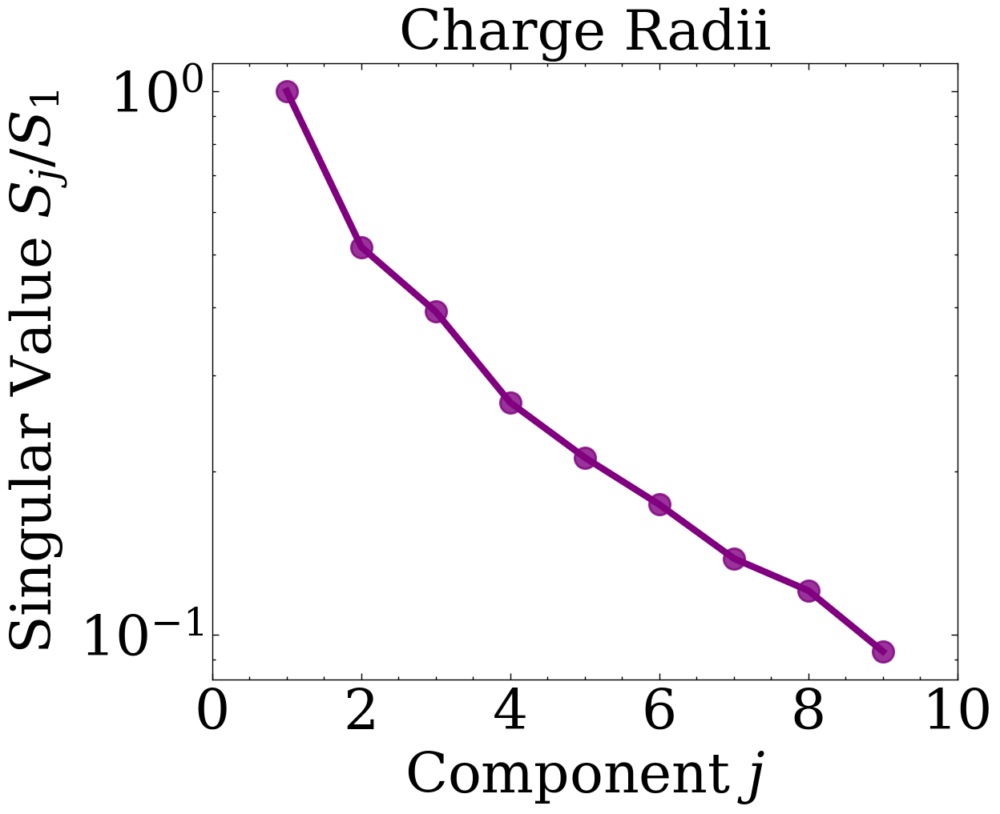

In [22]:
U, S, Vt = np.linalg.svd(model_predictions_radius_train_processed)

print(S)

plt.rc("xtick", labelsize = 25)
plt.rc("ytick", labelsize = 25)
plt.rcParams['text.usetex'] = False
fig, ax = plt.subplots(figsize = (6,5), dpi = 200)

ax.scatter(np.arange(1, S.size ), S[:-1]/S[0], color = "purple", alpha = 0.8, s = 90, marker = 'o')
ax.plot(np.arange(1, S.size ), S[:-1]/S[0], color = "purple", linewidth = 3)

ax.set_xticks([0,2,4,6,8,10])
plt.xlabel("Component $j$", fontsize = 25)
plt.ylabel("Singular Value $S_j/S_1$", fontsize = 25)
plt.yscale("log")
plt.title('Charge Radii', fontsize = 25)
# plt.savefig('Plots/Radii Data/Singular Values decays/Singular Values - Radius Calibration.png')
plt.show()

In [23]:
models_PC_radius_dict = {}
models_PC_radius_dict_train = {}
models_PC_radius_dict_validation = {}
models_PC_radius_dict_test = {}

for components_kept in range(1,len(S)):
    U_hat = np.array([U.T[i] for i in range(components_kept)]).T
    S_hat = S[:components_kept]
    Vt_hat = np.array([Vt[i]/S[i] for i in range(components_kept)])
    models_PC_radius_dict_train[f'models_PC_radius_train_{components_kept}_components_kept'] = models_PC_output(Vt_hat, model_predictions_radius_train, predictions_mean_radius_train, models_output_radius_train)

In [24]:
models_PC_radius_dict_train['models_PC_radius_train_3_components_kept']

,N,Z,A,PC_0,PC_1,PC_2,PC_3
0,8,8,16,2.771775,-0.215520,-0.210552,-0.035961
1,10,8,18,2.770609,-0.209919,-0.153716,0.005112
3,10,10,20,2.962131,0.004150,0.079762,-0.037991
4,12,10,22,2.961603,-0.052131,0.071417,0.043241
8,12,12,24,3.088527,-0.133057,0.048328,0.000416
...,...,...,...,...,...,...,...
295,126,82,208,5.513833,-0.021803,0.039150,0.011292
332,140,90,230,5.783878,-0.003696,0.084733,-0.129305
333,142,90,232,5.800701,0.003943,0.095899,-0.153589
334,142,92,234,5.835275,-0.027200,0.077282,-0.161745


In [25]:
PCs_weights = []
for key in list(models_PC_radius_dict_train.keys()):
    X_matrix = models_PC_radius_dict_train[key].iloc[:,4:]
    PCs_weights.append(super_params(X_matrix, models_output_radius_train['truth']- predictions_mean_radius_train))

In [26]:
PCs_weights

[array([-0.00077008]),
 array([-0.00077008, -0.00036927]),
 array([-0.00077008, -0.00036927, -0.08032675]),
 array([-0.00077008, -0.00036927, -0.08032675, -0.06457111]),
 array([-0.00077008, -0.00036927, -0.08032675, -0.06457111, -0.07205314]),
 array([-0.00077008, -0.00036927, -0.08032675, -0.06457111, -0.07205314,
         0.06629431]),
 array([-0.00077008, -0.00036927, -0.08032675, -0.06457111, -0.07205314,
         0.06629431,  0.01145959]),
 array([-0.00077008, -0.00036927, -0.08032675, -0.06457111, -0.07205314,
         0.06629431,  0.01145959, -0.01626552]),
 array([-0.00077008, -0.00036927, -0.08032675, -0.06457111, -0.07205314,
         0.06629431,  0.01145959, -0.01626552, -0.04169843])]

In [27]:
components_kept = 9
U_hat, S_hat, Vt_hat, Vt_hat_normalized = USVt_hat_extraction(U,S,Vt, 9)

In [28]:
models_PC_radius = models_PC_output(Vt_hat, model_predictions_radius, predictions_mean_radius, models_output_radius)
models_PC_radius_train = models_PC_output(Vt_hat, model_predictions_radius_train, predictions_mean_radius_train, models_output_radius_train)
models_PC_radius_validation = models_PC_output(Vt_hat, model_predictions_radius_validation, predictions_mean_radius_validation, models_output_radius_validation)
models_PC_radius_test = models_PC_output(Vt_hat, model_predictions_radius_test, predictions_mean_radius_test, models_output_radius_test)

In [29]:
X_validation = models_PC_radius_validation.copy().values[:,4:]
X_test = models_PC_radius_test.copy().values[:,4:]
X_full = models_PC_radius.copy().values[:,4:]

In [30]:
y = models_output_radius_train['truth'] - predictions_mean_radius_train
X_train = U_hat.copy()

X_T_X_train = X_train.T.dot(X_train)
X_T_X_train_inv = np.linalg.inv(X_T_X_train)
super_beta = X_T_X_train_inv.dot(X_train.T).dot(y)

# super_beta_full = np.insert(super_beta,0,1)
# naive_supermodel_train = models_PC_radius_train.values.dot(super_beta_full)

model_weights = np.dot(super_beta, Vt_hat) + np.full(len(Vt_hat[0]) , 1/len(Vt_hat[0]))
model_weights = np.array(model_weights)
naive_supermodel_train = model_predictions_radius_train.dot(model_weights)

residuals_train_2PCs = naive_supermodel_train - models_output_radius_train['truth']
sigma_train_2PCs = np.sqrt(np.sum(residuals_train_2PCs **2)/ len(residuals_train_2PCs))
sigma_train_2PCs

0.013252214670148052

<>:28: SyntaxWarning: invalid escape sequence '\p'
<>:29: SyntaxWarning: invalid escape sequence '\p'
<>:28: SyntaxWarning: invalid escape sequence '\p'
<>:29: SyntaxWarning: invalid escape sequence '\p'
C:\Users\congn\AppData\Local\Temp\ipykernel_9288\946088837.py:28: SyntaxWarning: invalid escape sequence '\p'
  plt.xlabel('Projection on $\phi_1$', fontsize=35)
C:\Users\congn\AppData\Local\Temp\ipykernel_9288\946088837.py:29: SyntaxWarning: invalid escape sequence '\p'
  plt.ylabel('Projection on $\phi_2$', fontsize=35)


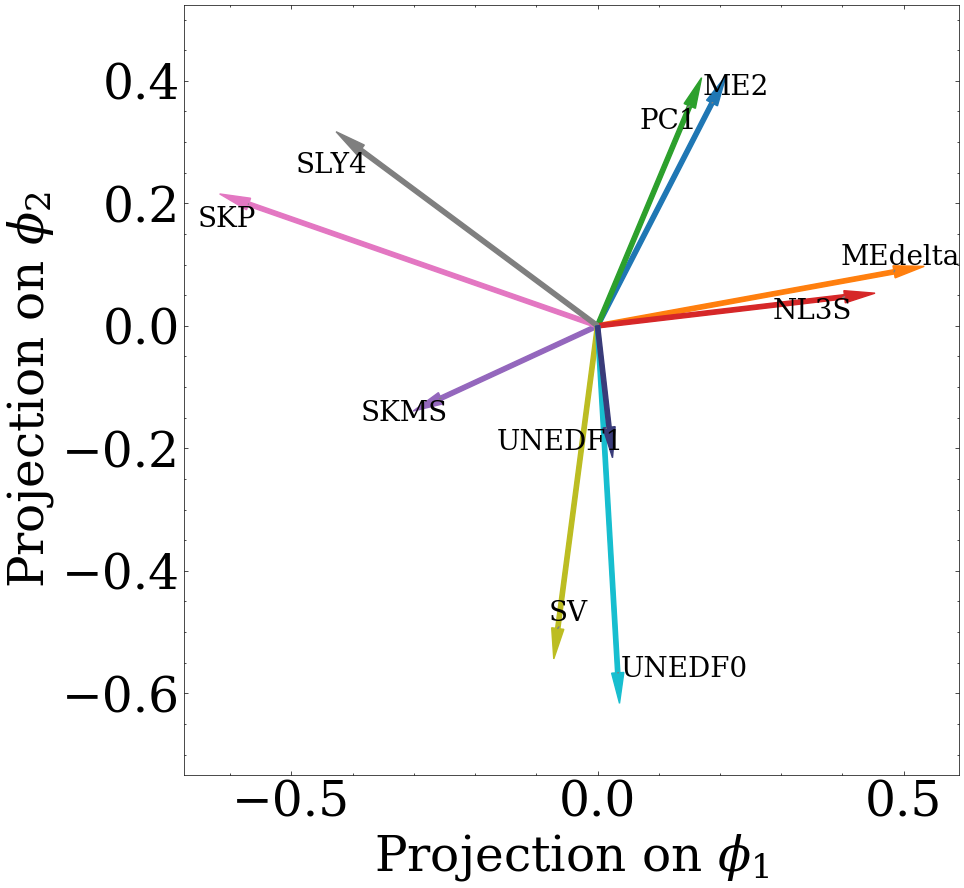

In [31]:
plt.rc("xtick", labelsize=35)
plt.rc("ytick", labelsize=35)

plt.rcParams['text.usetex'] = False
plt.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'

fig, ax = plt.subplots(figsize=(10,10), dpi=100)
texts = []

visited_model = 0
for model in key_list:
    x_end = Vt_hat_normalized.T[visited_model][0]
    y_end = Vt_hat_normalized.T[visited_model][1]

    ax.arrow(0, 0, x_end, y_end, 
             head_width=0.02, head_length=0.05, 
             fc=colors[visited_model], ec=colors[visited_model], width=0.007)

    # Add text and store it in a list
    text = ax.text(x_end, y_end, model, fontsize=20, ha='center', va='center', color= 'black')
    texts.append(text)

    visited_model += 1

# Adjust text positions to prevent overlap
adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray'))

plt.xlabel('Projection on $\phi_1$', fontsize=35)
plt.ylabel('Projection on $\phi_2$', fontsize=35)

plt.xticks(fontsize=35)
plt.yticks(fontsize=35)

plt.axis('equal')
# plt.savefig('Plots/Radii Data/Projections on PCs/Projections on 1st and 2nd PCs')
plt.show()

<>:28: SyntaxWarning: invalid escape sequence '\p'
<>:29: SyntaxWarning: invalid escape sequence '\p'
<>:28: SyntaxWarning: invalid escape sequence '\p'
<>:29: SyntaxWarning: invalid escape sequence '\p'
C:\Users\congn\AppData\Local\Temp\ipykernel_9288\1552357178.py:28: SyntaxWarning: invalid escape sequence '\p'
  plt.xlabel('Projection on $\phi_2$', fontsize=35)
C:\Users\congn\AppData\Local\Temp\ipykernel_9288\1552357178.py:29: SyntaxWarning: invalid escape sequence '\p'
  plt.ylabel('Projection on $\phi_3$', fontsize=35)


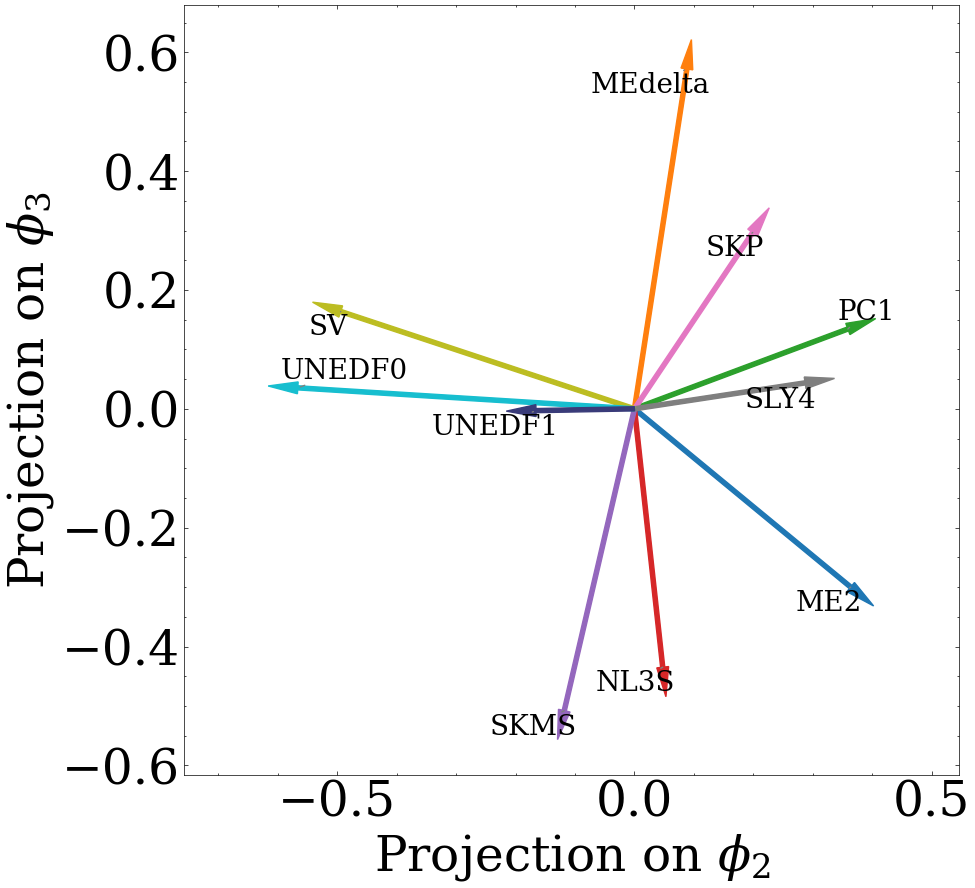

In [32]:
plt.rc("xtick", labelsize=35)
plt.rc("ytick", labelsize=35)

plt.rcParams['text.usetex'] = False
plt.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'

fig, ax = plt.subplots(figsize=(10,10), dpi=100)
texts = []

visited_model = 0
for model in key_list:
    x_end = Vt_hat_normalized.T[visited_model][1]
    y_end = Vt_hat_normalized.T[visited_model][2]

    ax.arrow(0, 0, x_end, y_end, 
             head_width=0.02, head_length=0.05, 
             fc=colors[visited_model], ec=colors[visited_model], width=0.007)

    # Add text and store it in a list
    text = ax.text(x_end, y_end, model, fontsize=20, ha='center', va='center', color= 'black')
    texts.append(text)

    visited_model += 1

# Adjust text positions to prevent overlap
adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray'))

plt.xlabel('Projection on $\phi_2$', fontsize=35)
plt.ylabel('Projection on $\phi_3$', fontsize=35)

plt.xticks(fontsize=35)
plt.yticks(fontsize=35)

plt.axis('equal')
plt.savefig('Plots/Radii Data/Projections on PCs/Projections on 2nd and 3rd PCs')
plt.show()

+ We want to calculate the RMSE of these models combinations when using super parameters (acquired from the OLS solution when use all models space)

In [33]:
super_params_train = super_params(model_predictions_radius_train, models_output_radius_train['truth'])
supermodel_radius_train = super_params_train.dot(model_predictions_radius_train.T)
supermodel_radius_validation = super_params_train.dot(model_predictions_radius_validation.T)
supermodel_radius_test = super_params_train.dot(model_predictions_radius_test.T)
supermodel_radius_full = super_params_train.dot(model_predictions_radius.T)

supermodel_residuals_radius_train=supermodel_radius_train-models_output_radius_train['truth'].tolist()
supermodel_residuals_radius_validation= supermodel_radius_validation-models_output_radius_validation['truth'].tolist()
supermodel_residuals_radius_test = supermodel_radius_test-models_output_radius_test['truth'].tolist()
supermodel_residuals_radius_full = supermodel_radius_full-models_output_radius['truth'].tolist()

supermodel_sigma_radius_train=np.sqrt(np.sum(supermodel_residuals_radius_train**2) / len(supermodel_residuals_radius_train) )
supermodel_sigma_radius_validation=np.sqrt(np.sum(supermodel_residuals_radius_validation**2) / len(supermodel_residuals_radius_validation) )
supermodel_sigma_radius_test=np.sqrt(np.sum(supermodel_residuals_radius_test**2) / len(supermodel_residuals_radius_test) )
supermodel_sigma_radius_full=np.sqrt(np.sum(supermodel_residuals_radius_full**2) / len(supermodel_residuals_radius_full) )

## Let's  now make the graph of the RMSE as the number of PCs increase

In [34]:
if centering_data:
    s_radius_validation=[np.linalg.norm(np.array(models_output_radius_validation["truth"].tolist())-predictions_mean_radius_validation)/np.sqrt(len(predictions_mean_radius_validation))]
    s_radius_test=[np.linalg.norm(np.array(models_output_radius_test["truth"].tolist())-predictions_mean_radius_test)/np.sqrt(len(predictions_mean_radius_test))]
    s_radius_train=[np.linalg.norm(np.array(models_output_radius_train["truth"].tolist())-predictions_mean_radius_train)/np.sqrt(len(predictions_mean_radius_train))]
    s_radius_all=[np.linalg.norm(np.array(models_output_radius["truth"].tolist())-predictions_mean_radius)/np.sqrt(len(predictions_mean_radius))]

if centering_data:
    for i in range(1,len(S)):
        res=PC_RMSE_calculator(i, model_predictions_radius_train, predictions_mean_radius_train, models_output_radius_train, models_output_radius_list, model_predictions_radius_list)
        s_radius_all.append(res[0])
        s_radius_train.append(res[1])
        s_radius_validation.append(res[2])
        
        s_radius_test.append(res[3])

[0.09972383 0.09928466 0.09977751 0.09940401 0.10037757 0.10084178
 0.10057134 0.10009592 0.09995123 0.09997216]
0.01759013241764552
[0.09922513 0.09916378 0.09928532 0.0993389  0.10053951 0.10056909
 0.1001777  0.10077343 0.1007278  0.10019933]
0.01759010920802033
[ 0.21684977 -0.12510071  0.04661433  0.2698414   0.29970075 -0.0157777
  0.08305238  0.03655685  0.0868801   0.10138282]
0.016455239069642646
[ 0.16670444  0.11628023 -0.05303643  0.17832507  0.59783333 -0.05632227
  0.10026527 -0.07257553  0.10180322 -0.07927732]
0.015678273504519894
[ 0.40057192  0.09700712 -0.24414538  0.31817222  0.4195124   0.20055079
  0.00923564 -0.10546951  0.35938136 -0.45481654]
0.014653344407716753
[ 0.60652589 -0.00434052  0.0161904   0.08105176  0.45066402 -0.04263367
  0.08390777  0.30320189  0.31383967 -0.80840722]
0.013726016170457763
[ 5.34102913e-01  2.87619574e-04  3.06545873e-02  1.63205472e-01
  4.67979794e-01 -6.19867126e-04  5.49682900e-02  3.59976316e-01
  2.44773021e-01 -8.55328145e

In [35]:
s_radius_train

[0.017590233356911393,
 0.01759013241764552,
 0.01759010920802033,
 0.016455239069642646,
 0.015678273504519894,
 0.014653344407716753,
 0.013726016170457763,
 0.013697341321685453,
 0.013639388706975826,
 0.013252214670148059]

<>:14: SyntaxWarning: invalid escape sequence '\d'
<>:17: SyntaxWarning: invalid escape sequence '\d'
<>:21: SyntaxWarning: invalid escape sequence '\d'
<>:23: SyntaxWarning: invalid escape sequence '\m'
<>:24: SyntaxWarning: invalid escape sequence '\m'
<>:25: SyntaxWarning: invalid escape sequence '\m'
<>:14: SyntaxWarning: invalid escape sequence '\d'
<>:17: SyntaxWarning: invalid escape sequence '\d'
<>:21: SyntaxWarning: invalid escape sequence '\d'
<>:23: SyntaxWarning: invalid escape sequence '\m'
<>:24: SyntaxWarning: invalid escape sequence '\m'
<>:25: SyntaxWarning: invalid escape sequence '\m'
C:\Users\congn\AppData\Local\Temp\ipykernel_9288\3162020370.py:14: SyntaxWarning: invalid escape sequence '\d'
  ax.plot(np.arange(0,len(s_radius_train)), s_radius_train,color=color_train,linewidth=3,label='$f^\dagger(\mathcal{X}_0^{tr})$')
C:\Users\congn\AppData\Local\Temp\ipykernel_9288\3162020370.py:17: SyntaxWarning: invalid escape sequence '\d'
  ax.plot(np.arange(0,len(s_radius_v

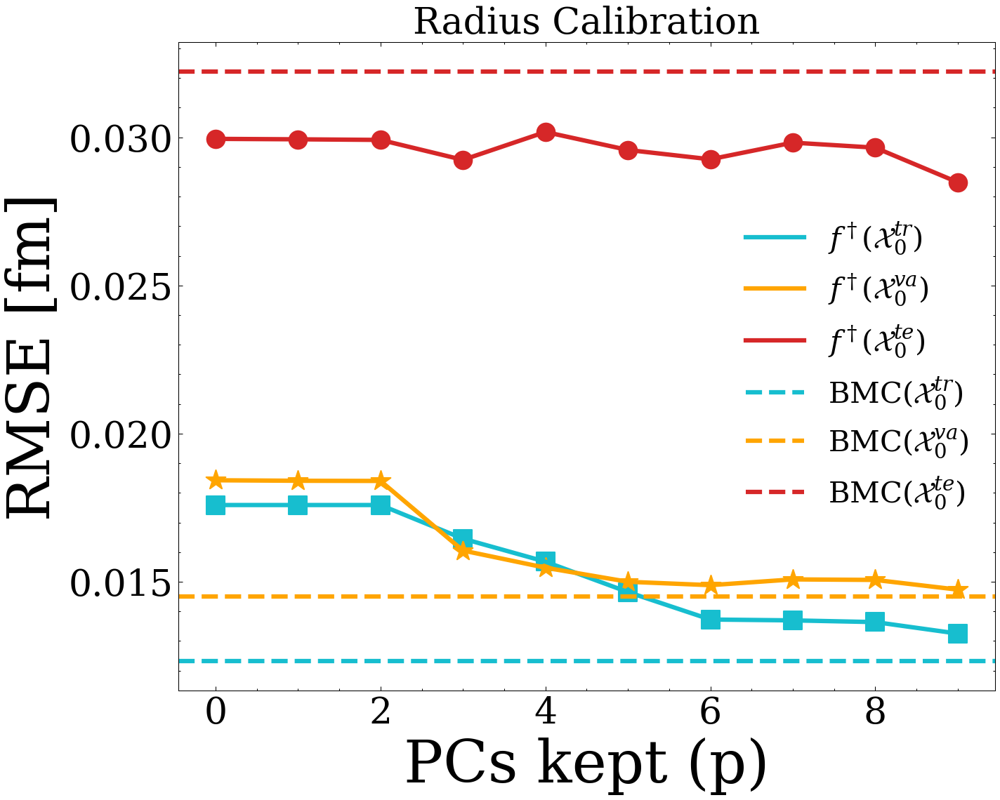

In [36]:
plt.rc("xtick", labelsize=25)
plt.rc("ytick", labelsize=25)

fig, ax = plt.subplots(figsize=(10,8),dpi=150)
fig.patch.set_facecolor('white')




size_points=150


ax.scatter(np.arange(0,len(s_radius_train)), s_radius_train,color=color_train,s=size_points,marker=marker_train)
ax.plot(np.arange(0,len(s_radius_train)), s_radius_train,color=color_train,linewidth=3,label='$f^\dagger(\mathcal{X}_0^{tr})$')

ax.scatter(np.arange(0,len(s_radius_validation)), s_radius_validation,color=color_validation,s=size_points*1.3,marker=marker_validation)
ax.plot(np.arange(0,len(s_radius_validation)), s_radius_validation,color=color_validation,linewidth=3,label="$f^\dagger(\mathcal{X}_0^{va})$")


ax.scatter(np.arange(0,len(s_radius_test)), s_radius_test,color=color_test,s=size_points,marker=marker_test)
ax.plot(np.arange(0,len(s_radius_test)), s_radius_test,color=color_test,linewidth=3,label="$f^\dagger(\mathcal{X}_0^{te})$")

ax.axhline(y=supermodel_sigma_radius_train,color=color_train,label="BMC$(\mathcal{X}_0^{tr})$",linestyle='dashed',linewidth=3)
ax.axhline(y=supermodel_sigma_radius_validation,color=color_validation,label="BMC$(\mathcal{X}_0^{va})$",linestyle='dashed',linewidth=3)
ax.axhline(y=supermodel_sigma_radius_test,color=color_test,label="BMC$(\mathcal{X}_0^{te})$",linestyle='dashed',linewidth=3)








# ax.set_yticks([0.2,0.5,1,2])


# ax.set_yscale('log')
ax.set_xlabel(r'PCs kept (p)',fontsize=40)
ax.set_ylabel(r' RMSE [fm]',fontsize=40);
# ax.set_xticks([0,5,10,15])

# plt.ylim(2.5*10**(-1),2.3)

plt.legend(fontsize=20)
# plt.savefig('Plots/Heterogenous RMSE change as number of PCs')
plt.title('Radius Calibration', fontsize = 25)
# plt.savefig('Plots/Radii data/RMSE decays/Radius RMSE decays.png')
# plt.legend(fontsize=30)
plt.show()

In [37]:
if centering_data:
    s_mass_validation=[np.linalg.norm(np.array(models_output_mass_validation["truth"].tolist())-predictions_mean_mass_validation)/np.sqrt(len(predictions_mean_mass_validation))]
    s_mass_test=[np.linalg.norm(np.array(models_output_mass_test["truth"].tolist())-predictions_mean_mass_test)/np.sqrt(len(predictions_mean_mass_test))]
    s_mass_train=[np.linalg.norm(np.array(models_output_mass_train["truth"].tolist())-predictions_mean_mass_train)/np.sqrt(len(predictions_mean_mass_train))]
    s_mass_all=[np.linalg.norm(np.array(models_output_mass["truth"].tolist())-predictions_mean_mass)/np.sqrt(len(predictions_mean_mass))]

if centering_data:
    for i in range(1,len(S)):
        res=PC_RMSE_calculator(i, model_predictions_radius_train, predictions_mean_radius_train, models_output_radius_train, models_output_mass_list, model_predictions_mass_list)
        s_mass_all.append(res[0])
        s_mass_train.append(res[1])
        s_mass_validation.append(res[2])
        s_mass_test.append(res[3])

[0.09972383 0.09928466 0.09977751 0.09940401 0.10037757 0.10084178
 0.10057134 0.10009592 0.09995123 0.09997216]
2.0046213412797123
[0.09922513 0.09916378 0.09928532 0.0993389  0.10053951 0.10056909
 0.1001777  0.10077343 0.1007278  0.10019933]
2.004443488079073
[ 0.21684977 -0.12510071  0.04661433  0.2698414   0.29970075 -0.0157777
  0.08305238  0.03655685  0.0868801   0.10138282]
2.2302648229109328
[ 0.16670444  0.11628023 -0.05303643  0.17832507  0.59783333 -0.05632227
  0.10026527 -0.07257553  0.10180322 -0.07927732]
3.4305079693956144
[ 0.40057192  0.09700712 -0.24414538  0.31817222  0.4195124   0.20055079
  0.00923564 -0.10546951  0.35938136 -0.45481654]
3.402566223242293
[ 0.60652589 -0.00434052  0.0161904   0.08105176  0.45066402 -0.04263367
  0.08390777  0.30320189  0.31383967 -0.80840722]
4.292044070106112
[ 5.34102913e-01  2.87619574e-04  3.06545873e-02  1.63205472e-01
  4.67979794e-01 -6.19867126e-04  5.49682900e-02  3.59976316e-01
  2.44773021e-01 -8.55328145e-01]
4.391539

<>:14: SyntaxWarning: invalid escape sequence '\d'
<>:17: SyntaxWarning: invalid escape sequence '\d'
<>:21: SyntaxWarning: invalid escape sequence '\d'
<>:14: SyntaxWarning: invalid escape sequence '\d'
<>:17: SyntaxWarning: invalid escape sequence '\d'
<>:21: SyntaxWarning: invalid escape sequence '\d'
C:\Users\congn\AppData\Local\Temp\ipykernel_16800\1693548229.py:14: SyntaxWarning: invalid escape sequence '\d'
  ax.plot(np.arange(0,len(s_mass_train)), s_mass_train,color=color_train,linewidth=3,label='$f^\dagger(\mathcal{X}_0^{tr})$')
C:\Users\congn\AppData\Local\Temp\ipykernel_16800\1693548229.py:17: SyntaxWarning: invalid escape sequence '\d'
  ax.plot(np.arange(0,len(s_mass_validation)), s_mass_validation,color=color_validation,linewidth=3,label="$f^\dagger(\mathcal{X}_0^{va})$")
C:\Users\congn\AppData\Local\Temp\ipykernel_16800\1693548229.py:21: SyntaxWarning: invalid escape sequence '\d'
  ax.plot(np.arange(0,len(s_mass_test)), s_mass_test,color=color_test,linewidth=3,label="$f

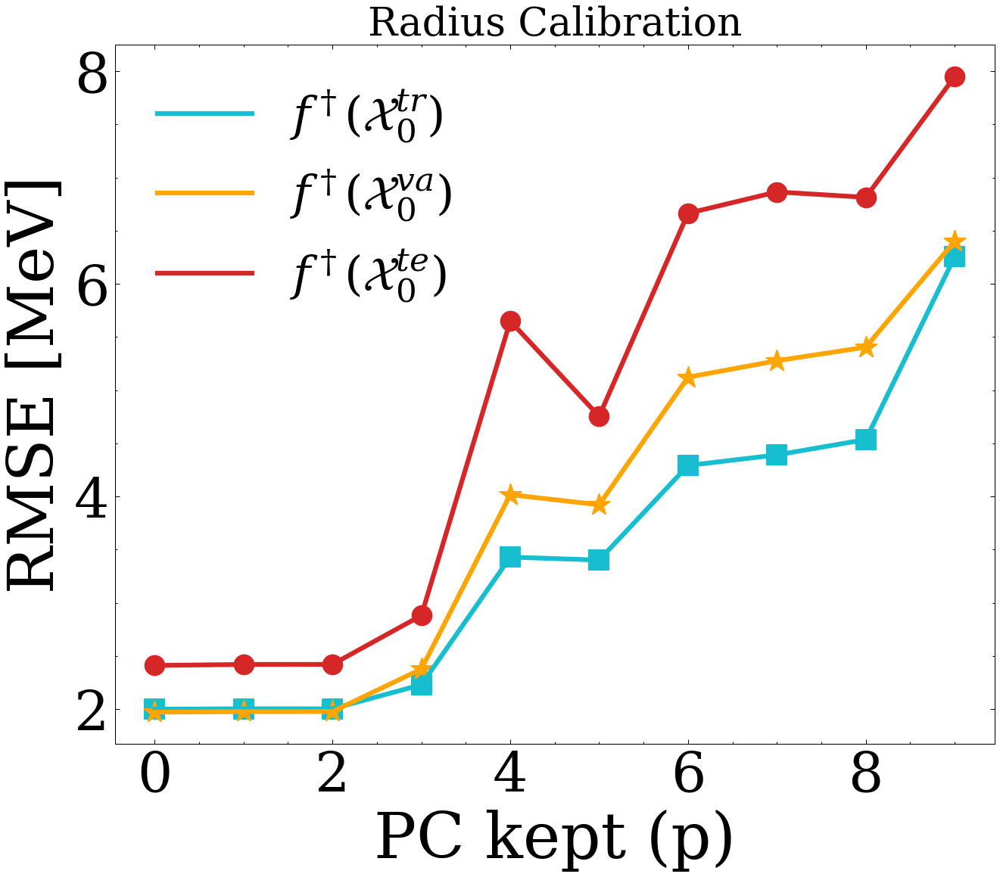

In [39]:
plt.rc("xtick", labelsize=35)
plt.rc("ytick", labelsize=35)

fig, ax = plt.subplots(figsize=(10,8),dpi=150)
fig.patch.set_facecolor('white')




size_points=150


ax.scatter(np.arange(0,len(s_mass_train)), s_mass_train,color=color_train,s=size_points,marker=marker_train)
ax.plot(np.arange(0,len(s_mass_train)), s_mass_train,color=color_train,linewidth=3,label='$f^\dagger(\mathcal{X}_0^{tr})$')

ax.scatter(np.arange(0,len(s_mass_validation)), s_mass_validation,color=color_validation,s=size_points*1.3,marker=marker_validation)
ax.plot(np.arange(0,len(s_mass_validation)), s_mass_validation,color=color_validation,linewidth=3,label="$f^\dagger(\mathcal{X}_0^{va})$")


ax.scatter(np.arange(0,len(s_mass_test)), s_mass_test,color=color_test,s=size_points,marker=marker_test)
ax.plot(np.arange(0,len(s_mass_test)), s_mass_test,color=color_test,linewidth=3,label="$f^\dagger(\mathcal{X}_0^{te})$")

# ax.axhline(y=sigma_naive_train,color=color_trainig,label="BMC$(\mathcal{X}_0^{tr})$",linestyle='dashed',linewidth=3)

# ax.axhline(y=sigma_naive_test,color=color_testing,label="BMC$(\mathcal{X}_0^{te})$",linestyle='dashed',linewidth=3)








# ax.set_yticks([0.2,0.5,1,2])


# ax.set_yscale('log')
ax.set_xlabel(r'PC kept (p)',fontsize=40)
ax.set_ylabel(r' RMSE [MeV]',fontsize=40);
# ax.set_xticks([0,5,10,15])

# plt.ylim(2.5*10**(-1),2.3)

plt.legend(fontsize=20,loc=(0.1,0.6))
# plt.savefig('Plots/Heterogenous RMSE change as number of PCs')
plt.title('Radius Calibration', fontsize = 25)
# plt.savefig('Plots/Heterogeneous Real Scaled Analysis/RMSE decays/Mass RMSE decay - Radius Analysis.png')
plt.legend(fontsize=30)
plt.show()

+ The objective now is to find out why the first 2 principal components do not give any new information to our analysis (strangly, even when we calculate the RMSE for the mass in radii calibration, our parameters does not change for the mass).
+ What is also interesting is that the model's weights is almost 0.1 when we first use the 2 PCs, which technically means it is the average of the models' space. Let's see if the OLS solution when we use the original models' data.

In [38]:
X_T_X_original = model_predictions_radius_train.T.dot(model_predictions_radius_train)
X_T_X_original_inv = np.linalg.inv(X_T_X_original)

beta = X_T_X_original_inv.dot(model_predictions_radius_train.T).dot(models_output_radius_train['truth'])
beta

array([ 0.74827514, -0.04276431, -0.26375382,  0.16111838,  0.29330774,
        0.36070192,  0.57535307, -0.3573957 , -0.14307782, -0.33643828])

+ The next step is, still, to find out why the we have mean performance when we use the first 2 PCs

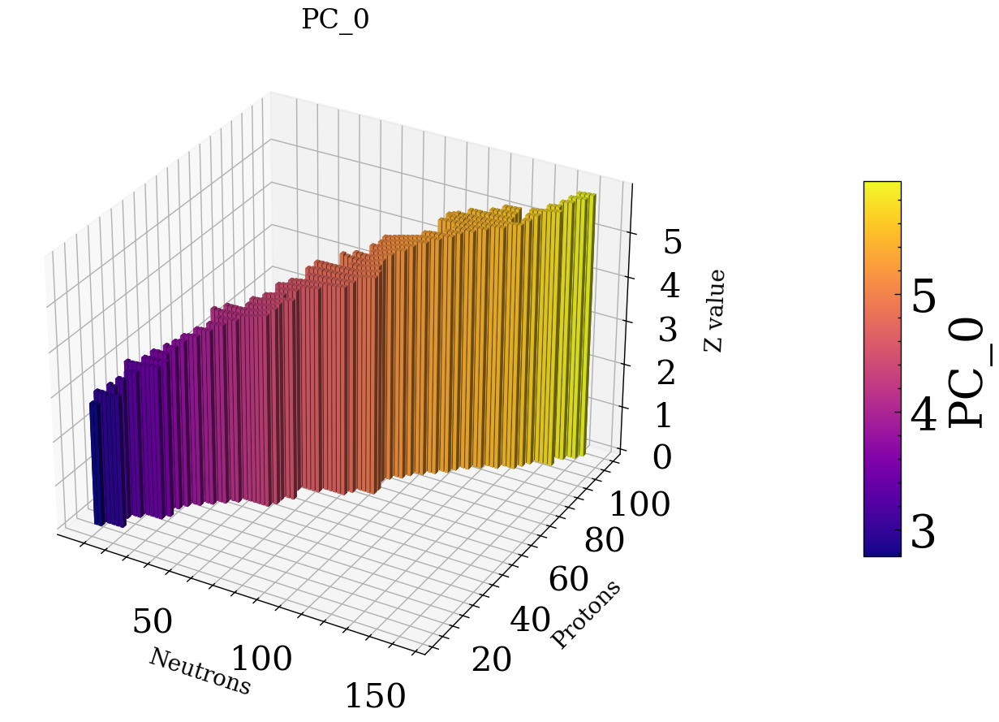

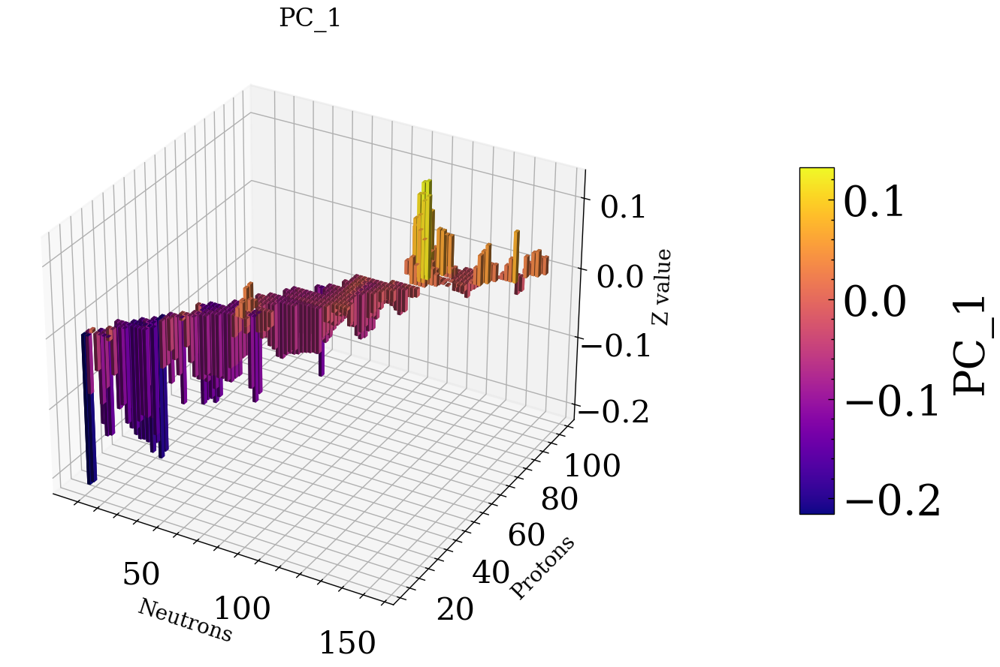

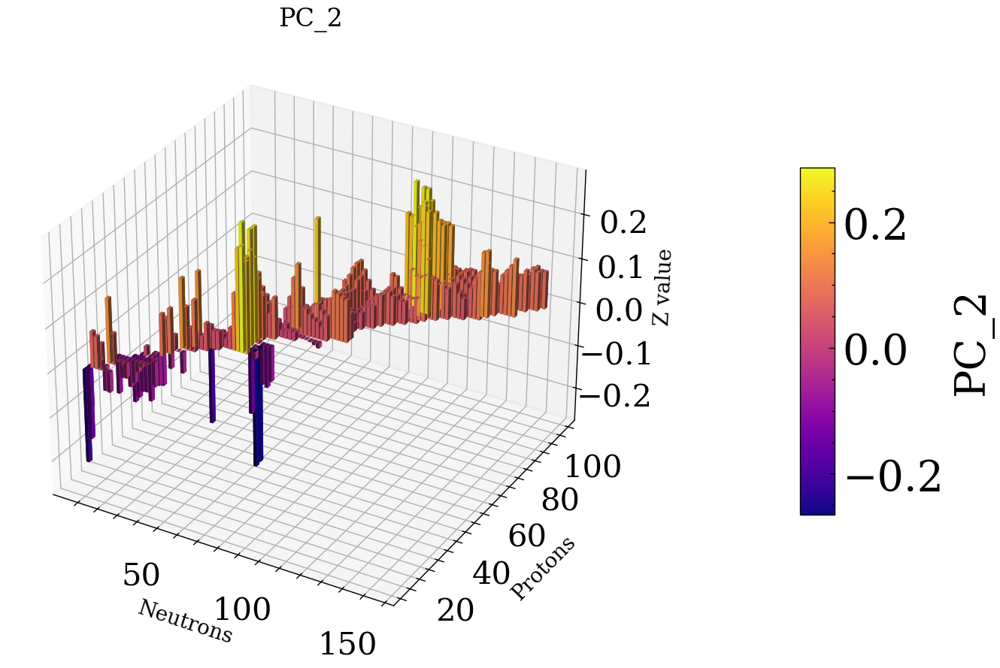

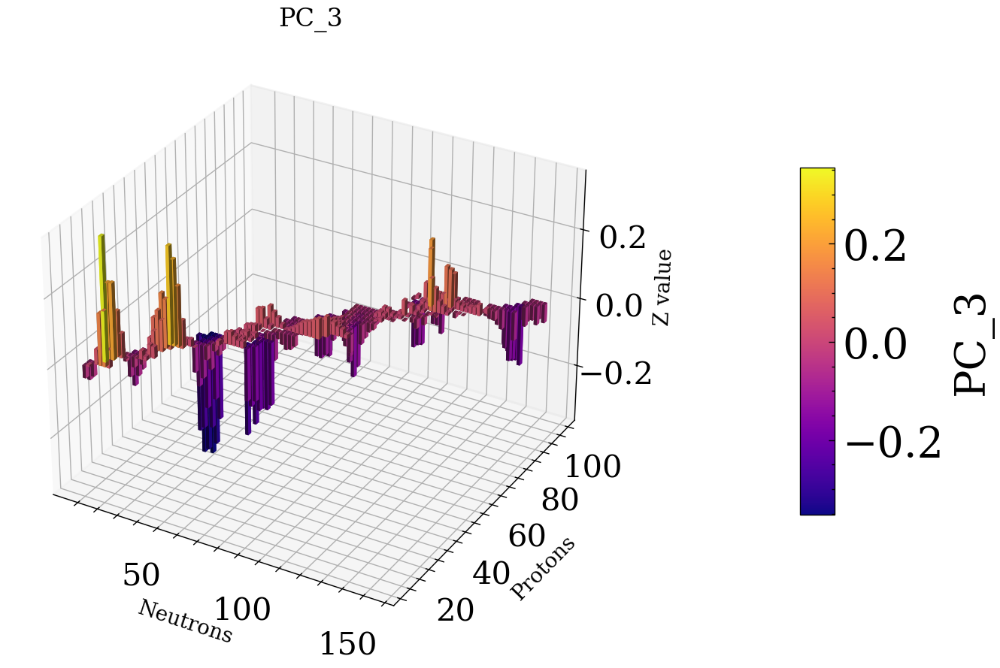

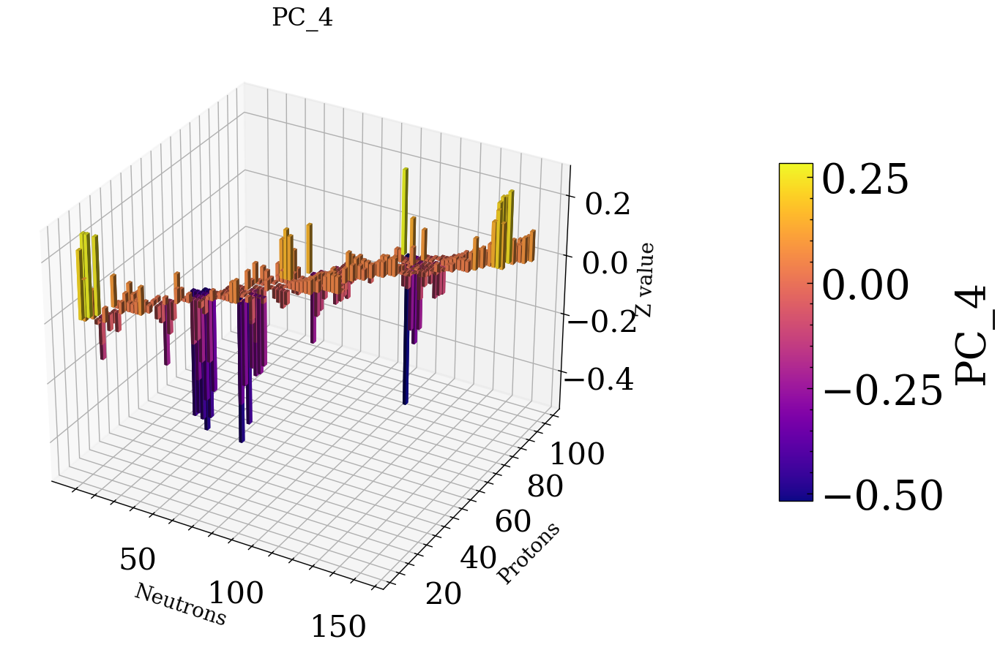

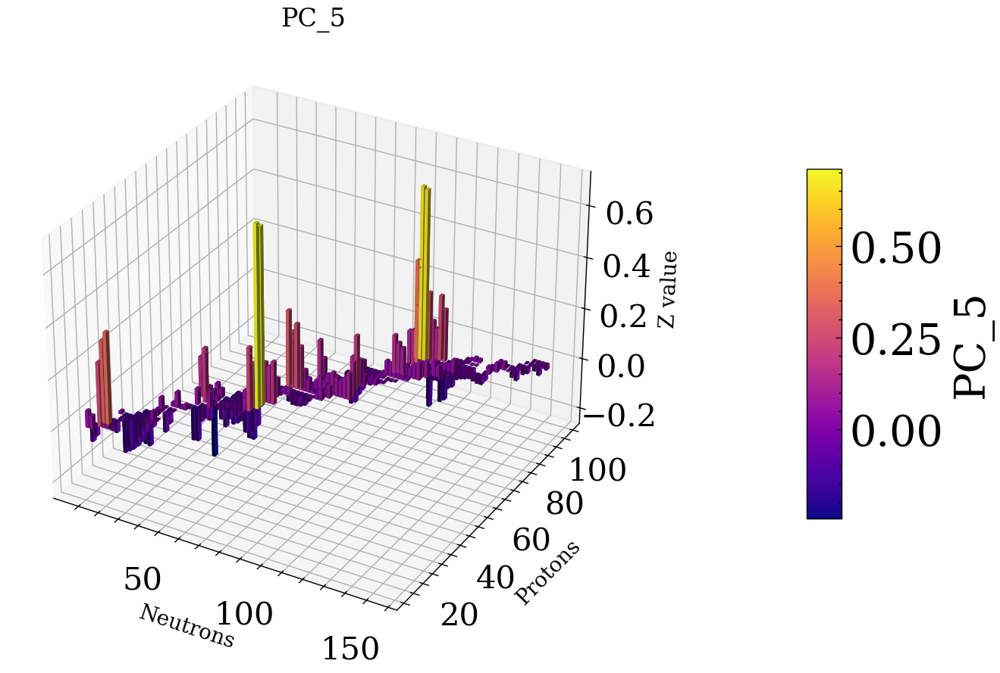

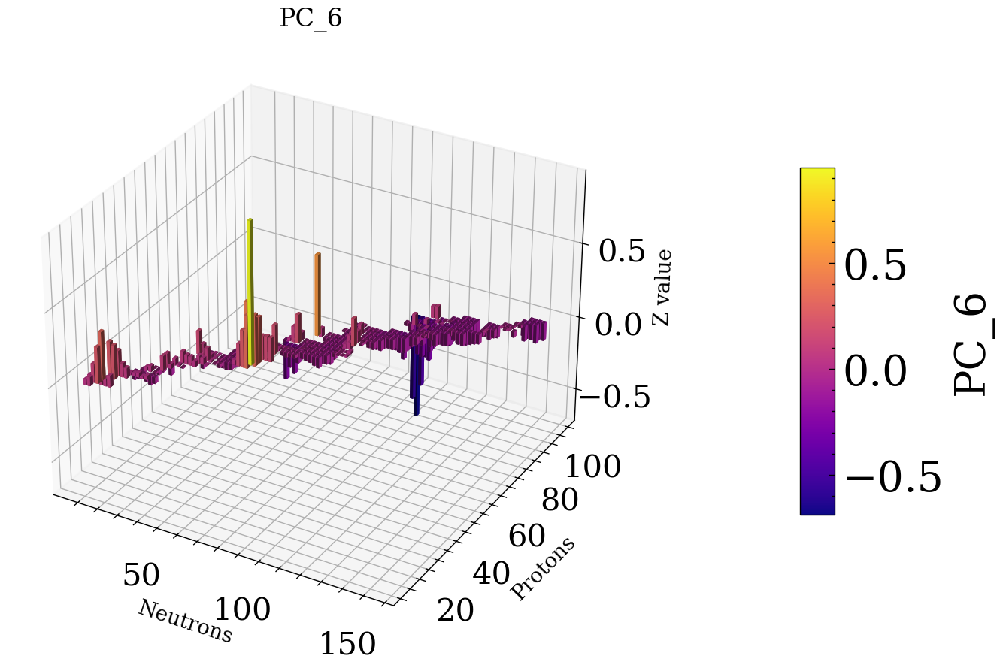

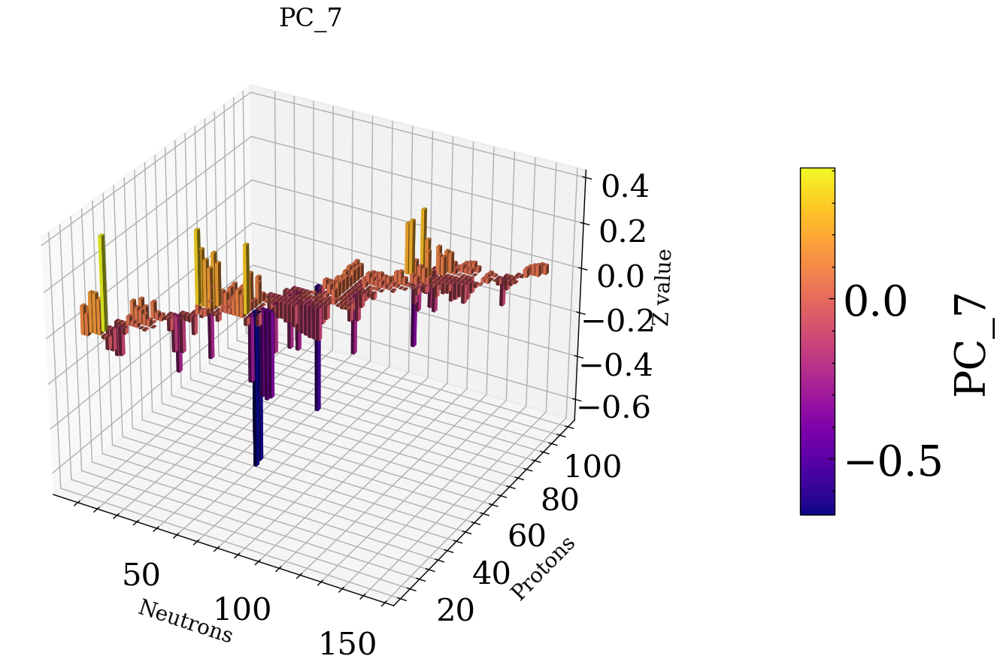

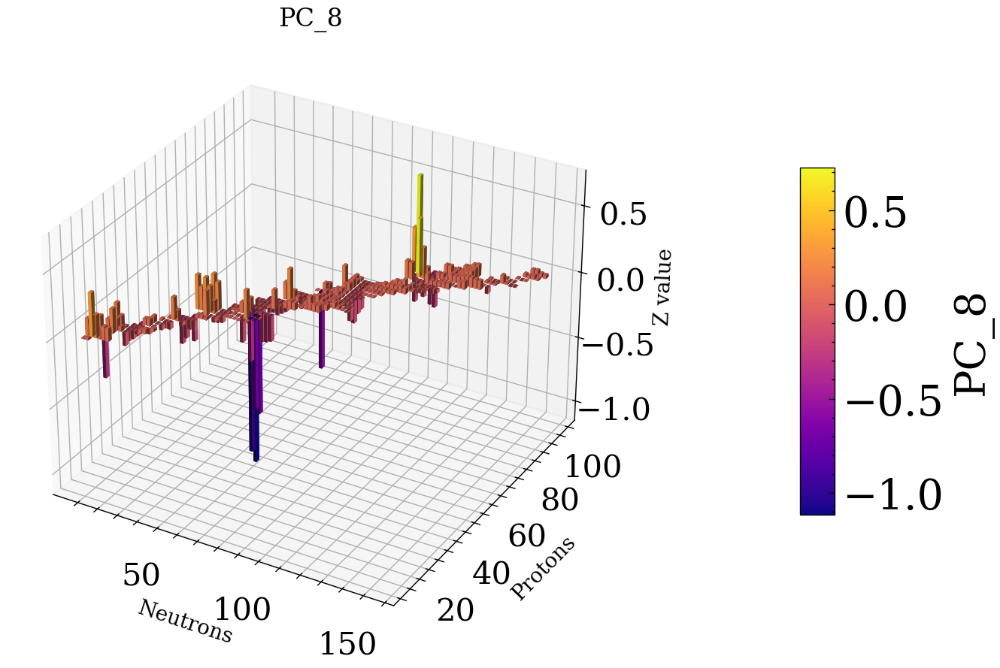

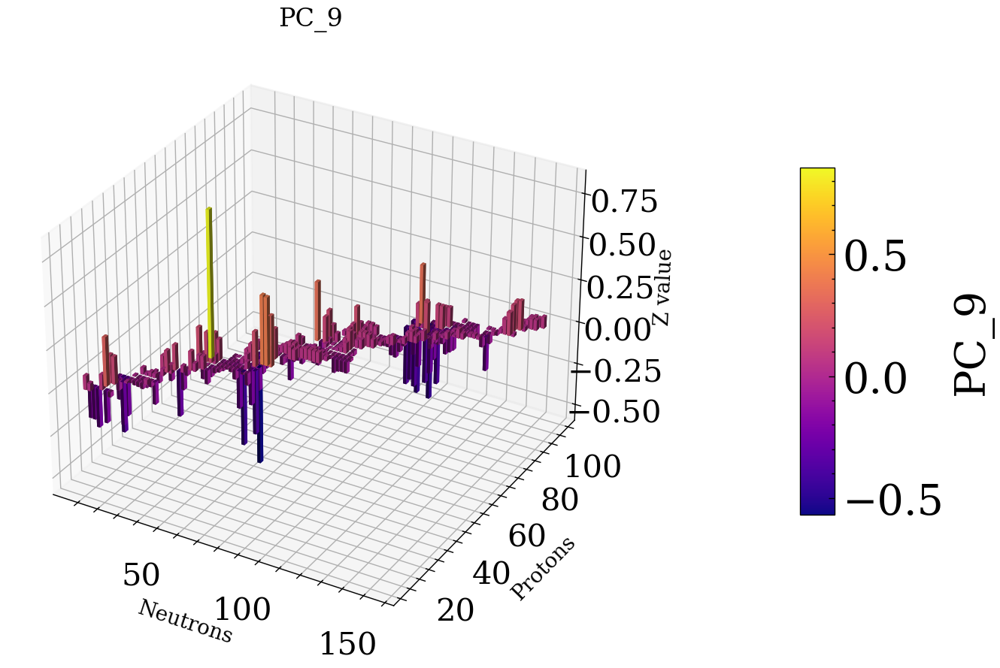

In [44]:
# This is the 3D visualization of the principal components
for PC in list(models_PC_radius.keys())[3:]:
    Plotter3D_single(filtered_NZ_df_radius['N'], filtered_NZ_df_radius['Z'], models_PC_radius[PC], PC, elev=30,azim=-60)
    # plt.savefig(f'Plots/Radii Data/PCs 3D heat map - Radii/{PC}')

### We want to write 2 functions that loops through all of our nuclei and do these things:
+ Neutralize the predictions of each model 

+ We would want to also create a 2D heat map that demonstrates the RMSE of the BMC when we include more and more number of PCs. 

In [79]:
if centering_data:
    naive_supermodel_residuals = [predictions_mean_radius - models_output_radius['truth']]
    
if centering_data:
    for i in range(1, len(S)):
        super_residuals = supermodel_residuals_calculator(i, model_predictions_radius_train, predictions_mean_radius_train, models_output_radius_train, models_output_radius_list, model_predictions_radius_list)
        naive_supermodel_residuals.append(super_residuals[0])

[0.09972383 0.09928466 0.09977751 0.09940401 0.10037757 0.10084178
 0.10057134 0.10009592 0.09995123 0.09997216]
[0.09922513 0.09916378 0.09928532 0.0993389  0.10053951 0.10056909
 0.1001777  0.10077343 0.1007278  0.10019933]
[ 0.21684977 -0.12510071  0.04661433  0.2698414   0.29970075 -0.0157777
  0.08305238  0.03655685  0.0868801   0.10138282]
[ 0.16670444  0.11628023 -0.05303643  0.17832507  0.59783333 -0.05632227
  0.10026527 -0.07257553  0.10180322 -0.07927732]
[ 0.40057192  0.09700712 -0.24414538  0.31817222  0.4195124   0.20055079
  0.00923564 -0.10546951  0.35938136 -0.45481654]
[ 0.60652589 -0.00434052  0.0161904   0.08105176  0.45066402 -0.04263367
  0.08390777  0.30320189  0.31383967 -0.80840722]
[ 5.34102913e-01  2.87619574e-04  3.06545873e-02  1.63205472e-01
  4.67979794e-01 -6.19867126e-04  5.49682900e-02  3.59976316e-01
  2.44773021e-01 -8.55328145e-01]
[ 0.44027508 -0.00805278  0.02850154  0.23993626  0.41223968 -0.08110325
  0.24117237  0.33146562  0.30745595 -0.911890

In [80]:
naive_supermodel_residuals[0]

0      0.072675
1     -0.001991
2     -0.010666
3     -0.043369
4      0.009103
         ...   
340    0.025556
341    0.096088
342    0.094285
343    0.091159
344    0.088839
Name: truth, Length: 345, dtype: float64

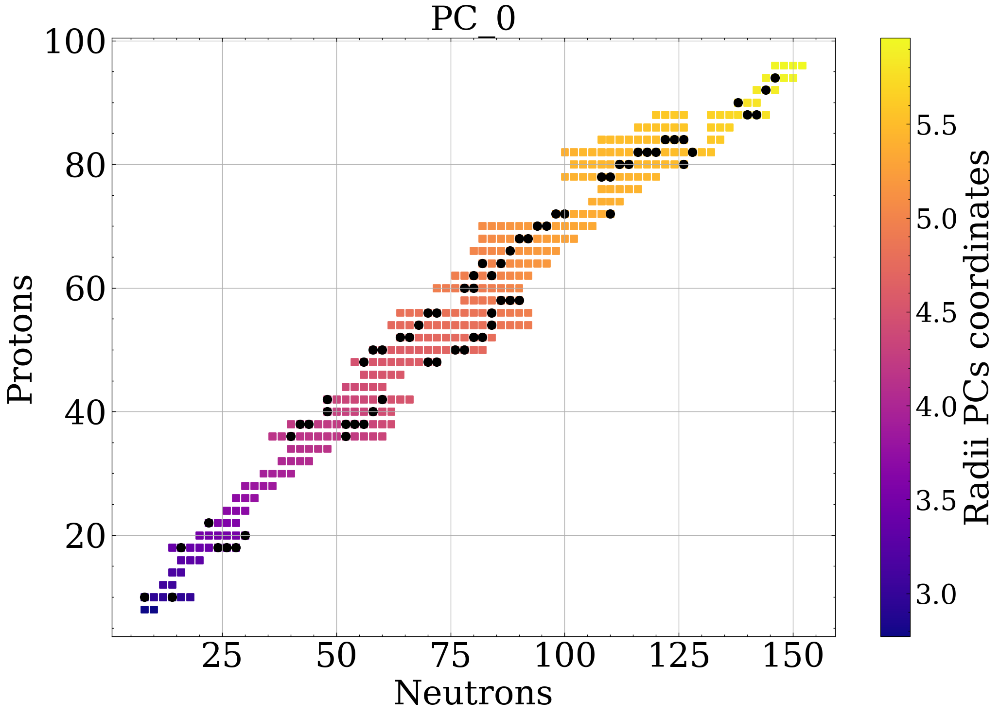

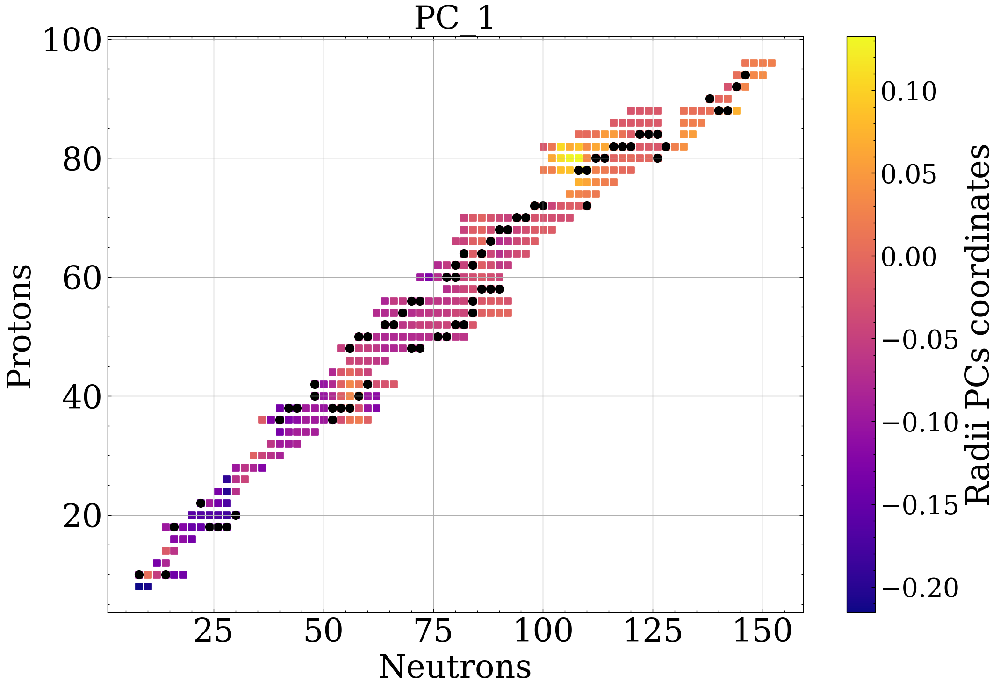

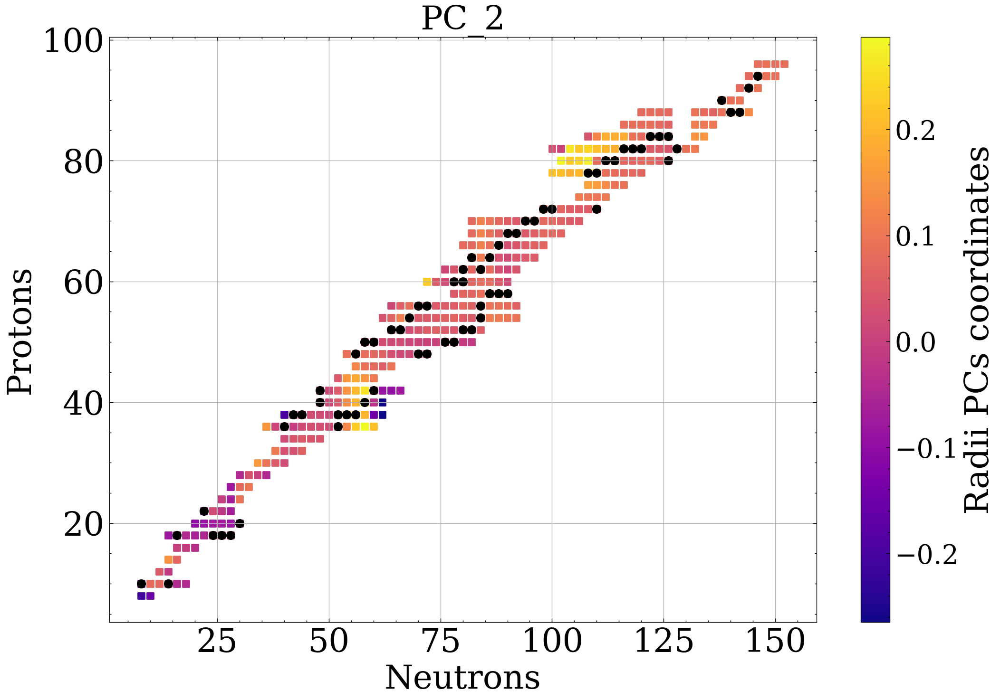

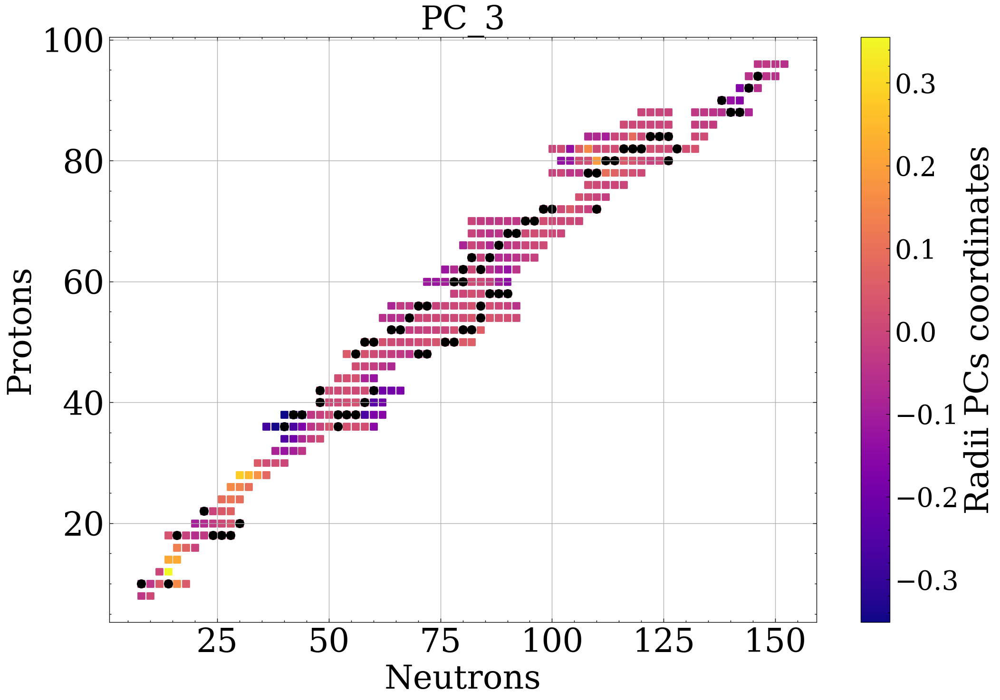

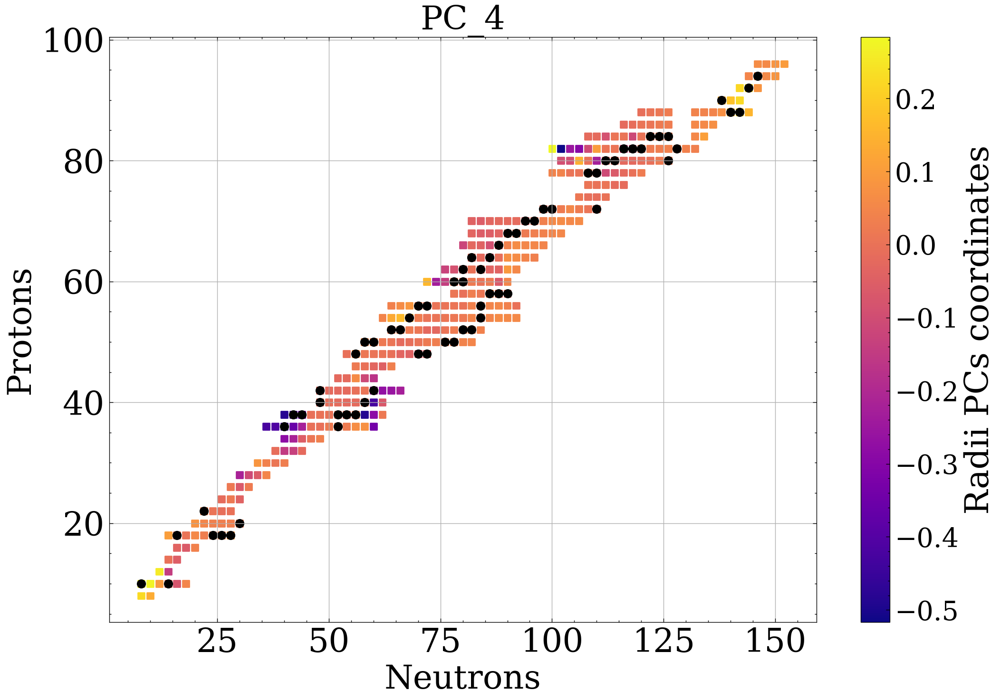

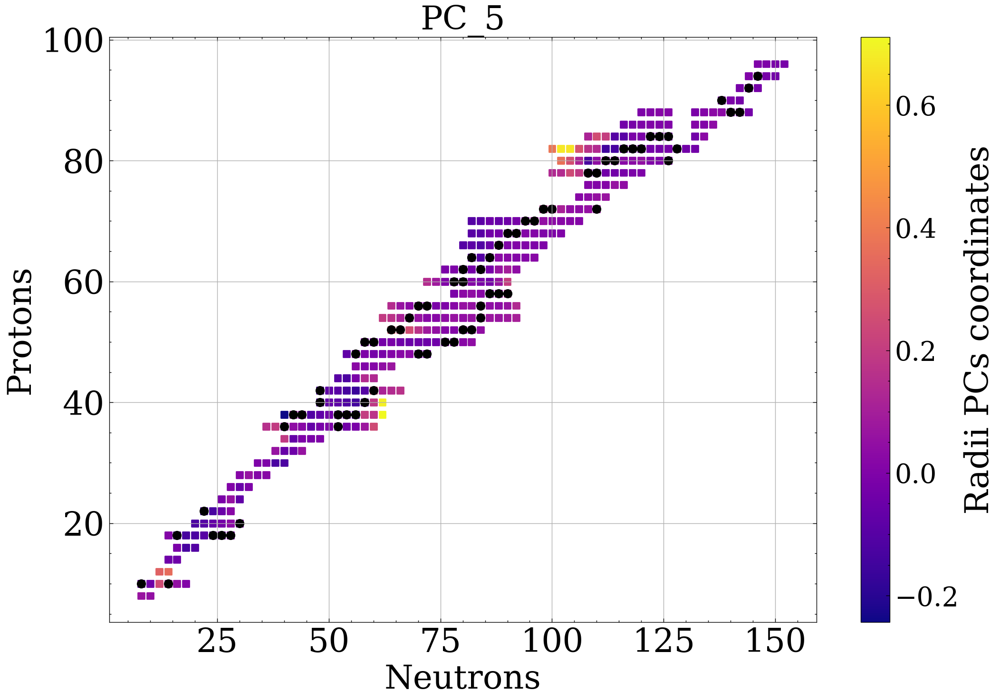

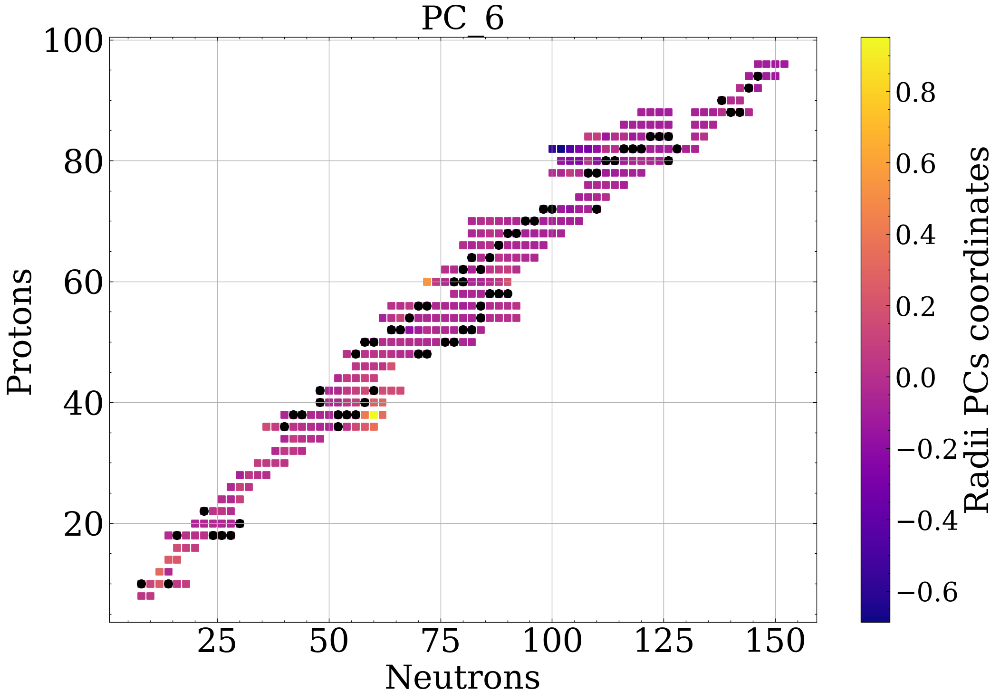

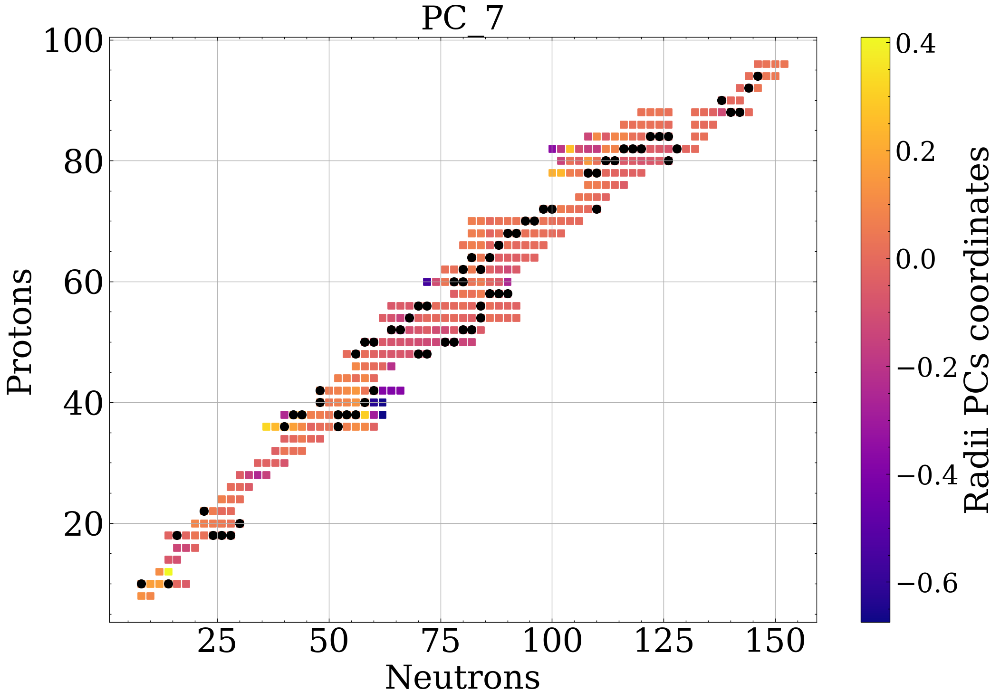

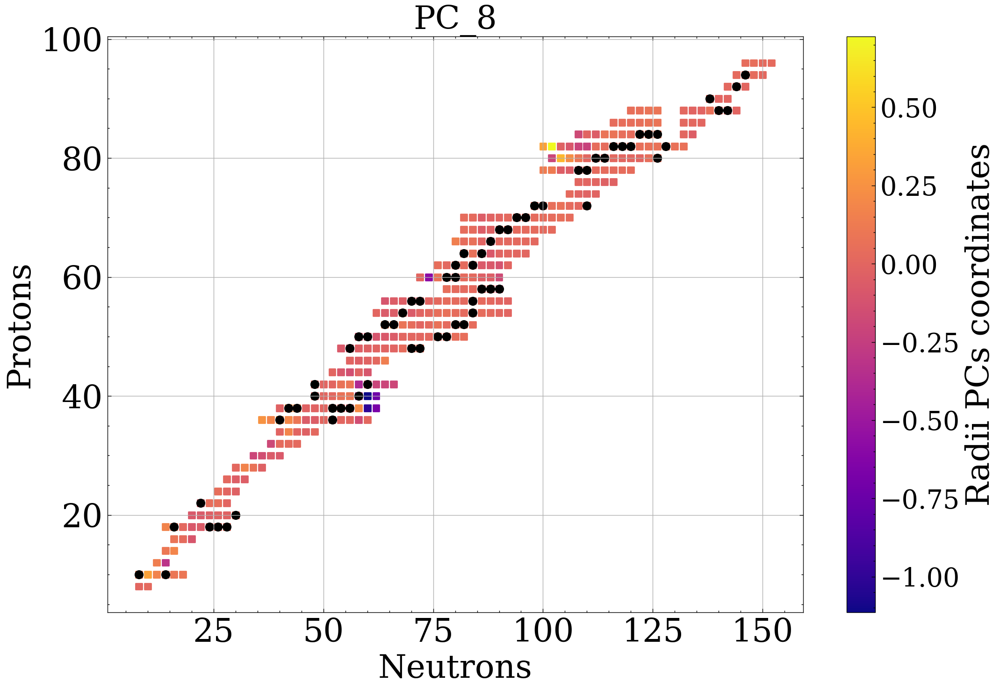

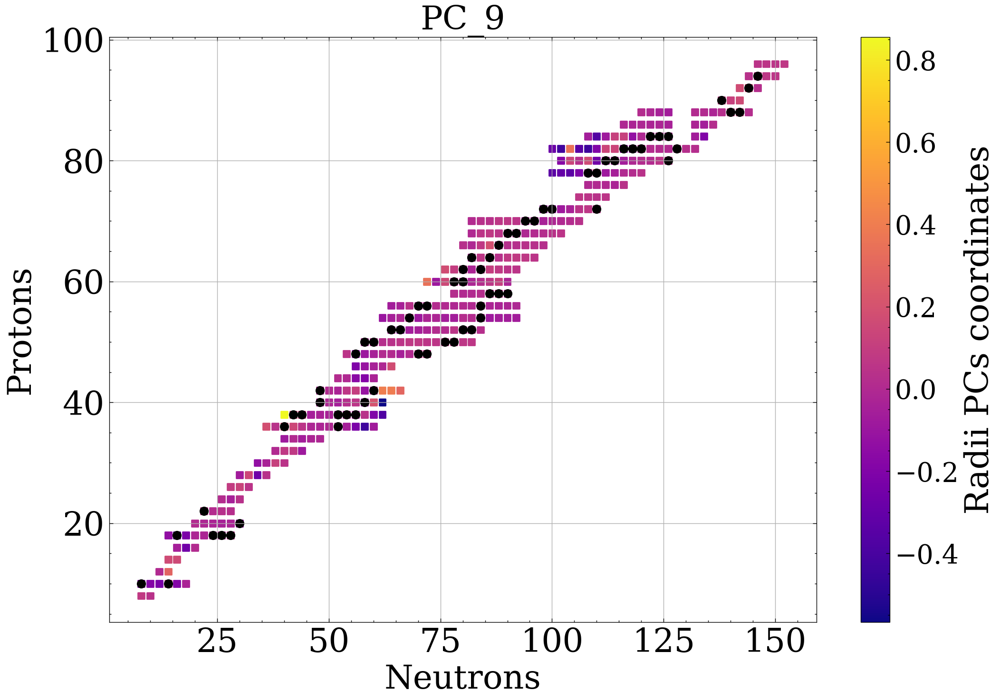

In [81]:
j = 0
for PC in list(models_PC_radius.keys())[3:]:
    Plotter2D_single(filtered_NZ_df_radius['N'], filtered_NZ_df_radius['Z'], models_PC_radius[PC], validation_set_radius, 'Radii PCs coordinates', PC )
    plt.savefig(f'Plots/Radii Data/PCs heat map - Radii/PC_{j} heat map.png')
    plt.show()
    plt.close(fig)
    j += 1

In [82]:
# x_values=models_PC["N"].tolist()
# y_values=models_PC["Z"].tolist()
# pc_data=[]

# if centering_data:
#     pc_data.append([x_values,y_values,models_PC["PC_0"].tolist()])

# for i in range(components_kept):
#     pc_data.append([x_values,y_values,models_PC[str("PC_")+str(i+1)].tolist()])

    
# pc_data=np.array(pc_data)

NameError: name 'models_PC' is not defined

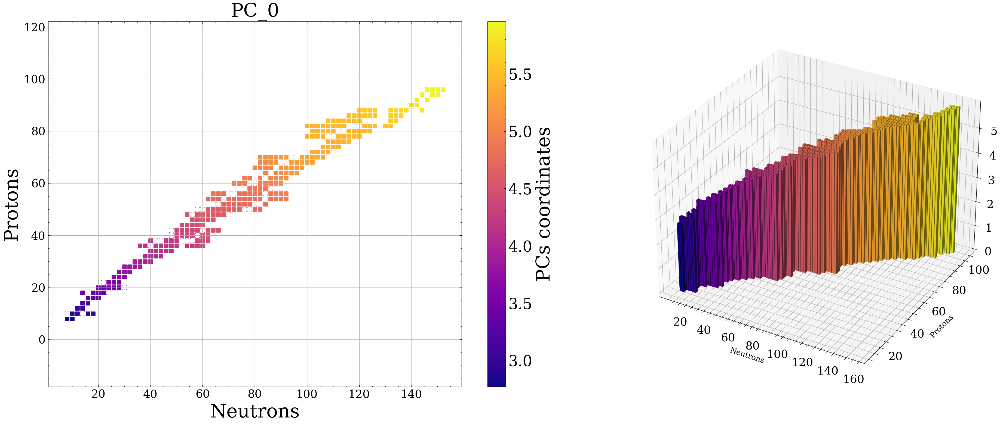

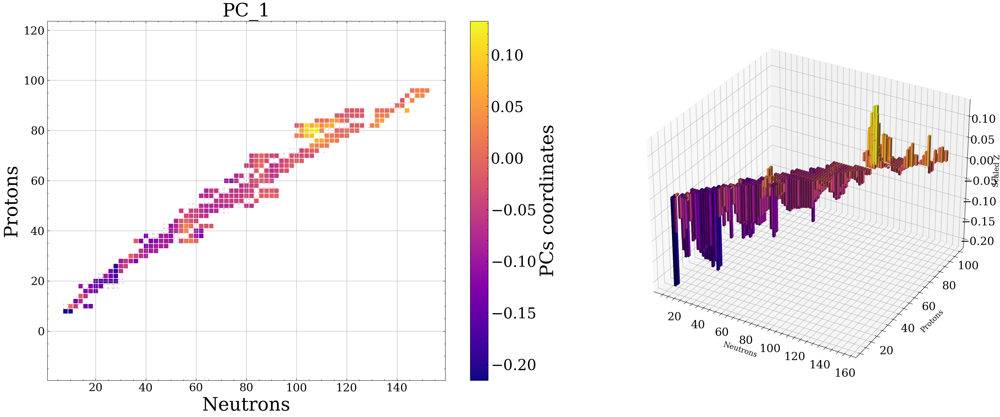

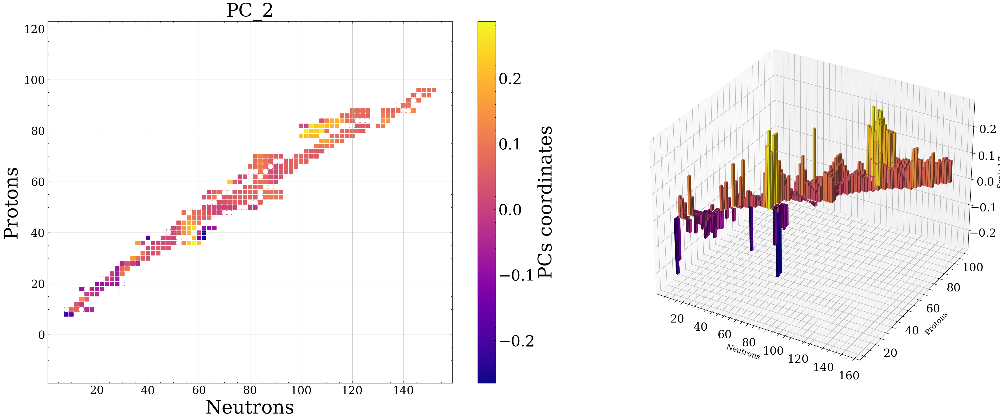

In [ ]:
for PC in list(models_PC_radius.keys())[3:]:
    PlotMultiple(filtered_NZ_df_radius['N'], filtered_NZ_df_radius['Z'], models_PC_radius[PC], validation_set_radius,'PCs coordinates',PC, [30, -60])
    # plt.savefig(f'Plots/Radii data/Combined heat map - Radii/{PC}.png')
    plt.show()

In [84]:
j = 0
for PC in list(models_PC.keys())[:-3]:
    Plotter2D_single_altered(filtered_NZ_df_radius['N'], filtered_NZ_df_radius['Z'], models_PC[PC], validation_set, 'Mass PCs coordinates', PC )
    # plt.savefig(f'Plots/Radii Data/PCs heat map - Mass/PC_{j} heat map.png')
    plt.show()
    plt.close(fig)
    j += 1

NameError: name 'models_PC' is not defined

In [ ]:
from PIL import Image
import os

def resize_image(image_path, output_size=(600, 600)):
    """
    Resize the image to a fixed size.
    
    Parameters:
        image_path (str): The file path of the image.
        output_size (tuple): The desired output size (width, height).
    
    Returns:
        resized_image: The resized image object.
    """
    image = Image.open(image_path)
    resized_image = image.resize(output_size, Image.Resampling.LANCZOS)  # Use LANCZOS for high-quality resizing
    resized_image.save(image_path)  # Overwrite the original image with resized image
    return resized_image

images = [f'Plots/Radii Data/PCs heat map/PC_{i} heat map.png' for i in range(len(S))]

# Resize all images to the same size (e.g., 600x600)
output_size = (600, 600)  # Example size
for filename in images:
    resize_image(filename, output_size)

In [85]:
# import imageio.v2 as imageio

# # List of image file names
# images = [f'Plots/Radii Data/PCs heat map/PC_{i} heat map.png' for i in range(len(S))]

# save_path_PCs = r'C:\Users\congn\OneDrive\Desktop\An Le Materials\ModelOrthogonalization\Plots\Radii data\PCs heat map\transition_video_1.mp4'
# # Create a video from images
# with imageio.get_writer(save_path_PCs, fps=1, codec='libx264', quality=10, bitrate="5000k") as writer_PCs:
#     for filename in images:
#         image = imageio.imread(filename)
#         writer_PCs.append_data(image)

In [86]:
# from IPython.display import Video

# # Display the video inside the Jupyter Notebook
# Video("transition_video_1.mp4", embed=True)

In [87]:
# for i in range(1,len(naive_supermodel_residuals)):
#     Plotter2D_single(filtered_NZ_df_radius['N'], filtered_NZ_df_radius['Z'], (np.abs(naive_supermodel_residuals[i])-np.abs(naive_supermodel_residuals[i-1])), 'CR residuals', list(models_PC_radius.keys())[i+3] )
#     # plt.savefig(f'Plots/Radii Data/BMM CR residuals heat map/Naive BMM residuals heat map for {i} PCs.png')
#     plt.show()

In [88]:
# import imageio.v2 as imageio

# # List of image file names
# images = [f'Plots/Radii Data/BMM CR residuals heat map/Naive BMM residuals heat map for {i} PCs.png' for i in range(len(S))]

# save_path = save_path = r'C:\Users\congn\OneDrive\Desktop\An Le Materials\ModelOrthogonalization\Plots\Radii data\BMM CR residuals heat map\transition_video.mp4'
# # Create a video from images
# with imageio.get_writer(save_path, fps=1, codec='libx264', quality=10, bitrate="5000k") as writer:
#     for filename in images:
#         image = imageio.imread(filename)
#         writer.append_data(image)

In [89]:
# writer

In [90]:
# from IPython.display import Video

# # Display the video inside the Jupyter Notebook
# Video("transition_video.mp4", embed=True)

+ We will now graph the model_predictions, predictions_mean of different isotopes

In [91]:
x = np.linspace(20,90,8)

In [92]:
filtered_predictions_mean_radius_dict= filtered_models_output_dict_extraction(x, 'filtered_predictions_mean_radius_list_' , predictions_mean_radius_df,\
                                    train_coordinates_radius, validation_coordinates_radius, test_coordinates_radius, stable_coordinates_radius)
filtered_predictions_mean_radius_dict.keys()

dict_keys(['filtered_predictions_mean_radius_list_20', 'filtered_predictions_mean_radius_list_30', 'filtered_predictions_mean_radius_list_40', 'filtered_predictions_mean_radius_list_50', 'filtered_predictions_mean_radius_list_60', 'filtered_predictions_mean_radius_list_70', 'filtered_predictions_mean_radius_list_80', 'filtered_predictions_mean_radius_list_90'])

In [93]:
filtered_models_output_radius_dict = filtered_models_output_dict_extraction(x, 'filtered_models_output_radius_list_' , models_output_radius,\
                                    train_coordinates_radius, validation_coordinates_radius, test_coordinates_radius, stable_coordinates_radius)
filtered_models_output_radius_dict.keys()

dict_keys(['filtered_models_output_radius_list_20', 'filtered_models_output_radius_list_30', 'filtered_models_output_radius_list_40', 'filtered_models_output_radius_list_50', 'filtered_models_output_radius_list_60', 'filtered_models_output_radius_list_70', 'filtered_models_output_radius_list_80', 'filtered_models_output_radius_list_90'])

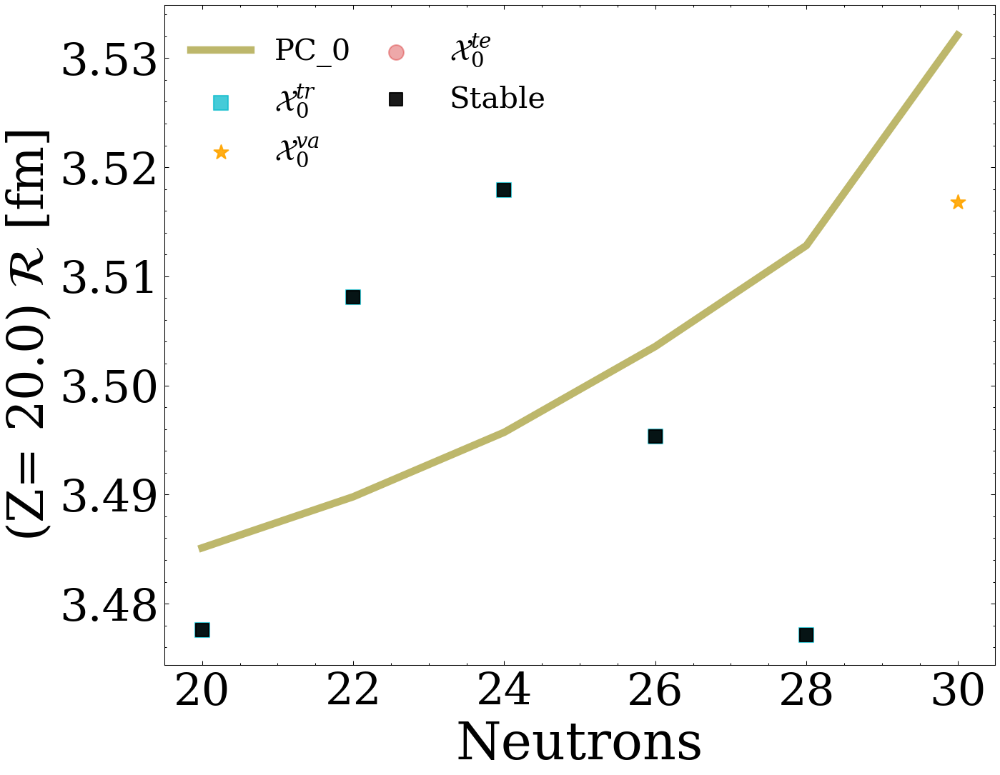

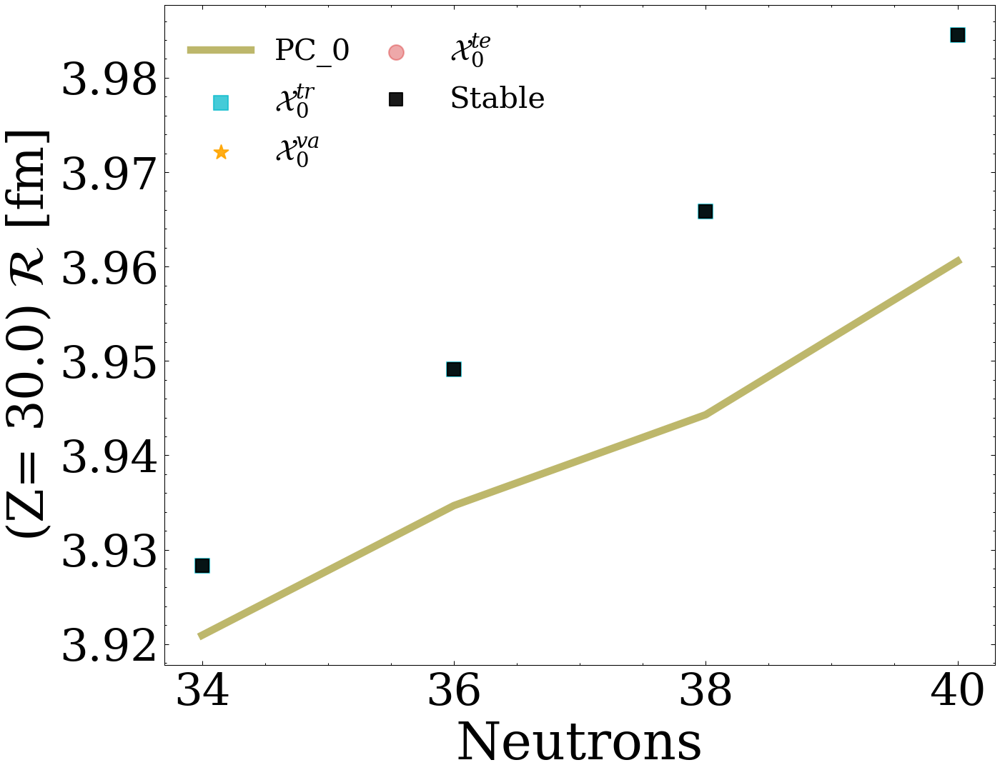

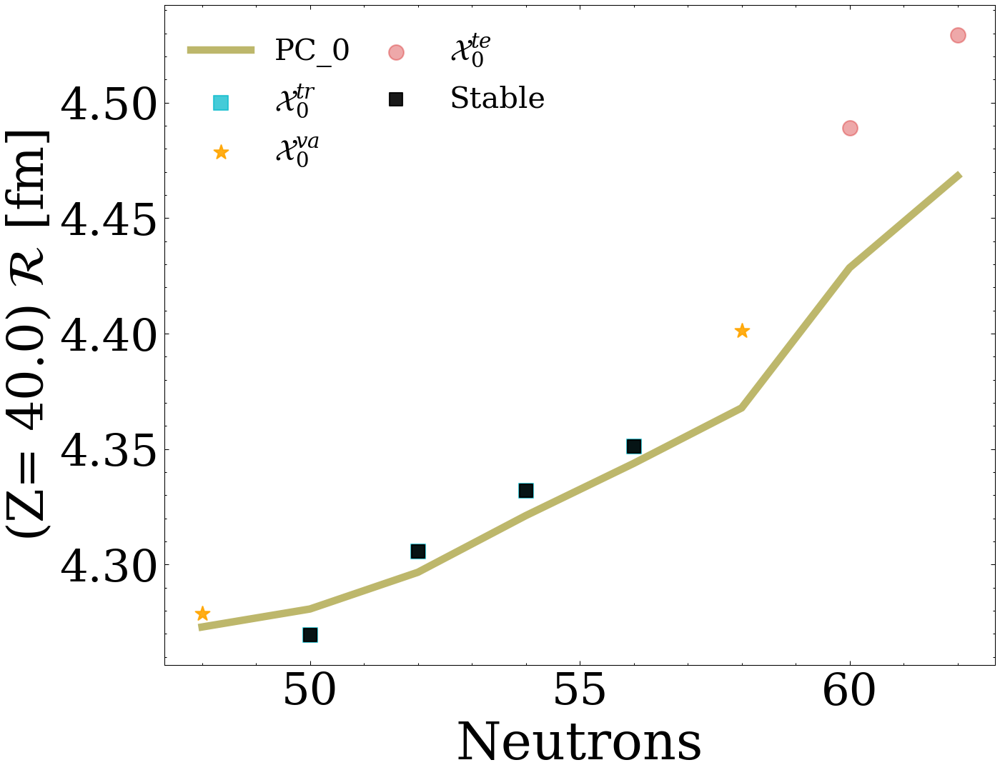

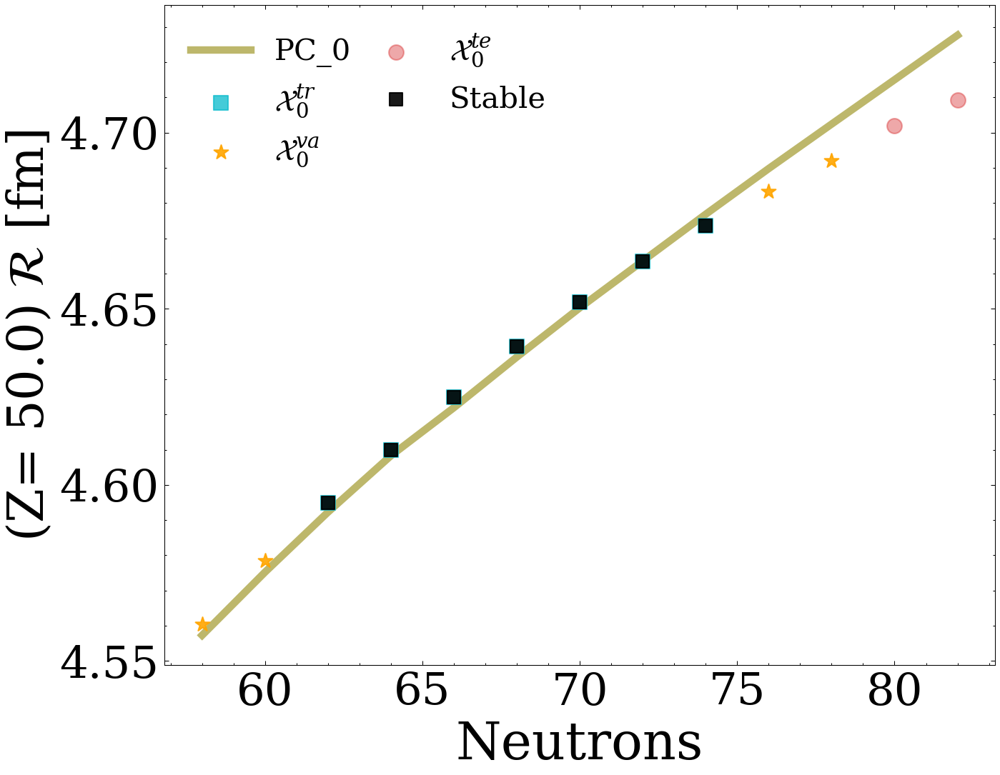

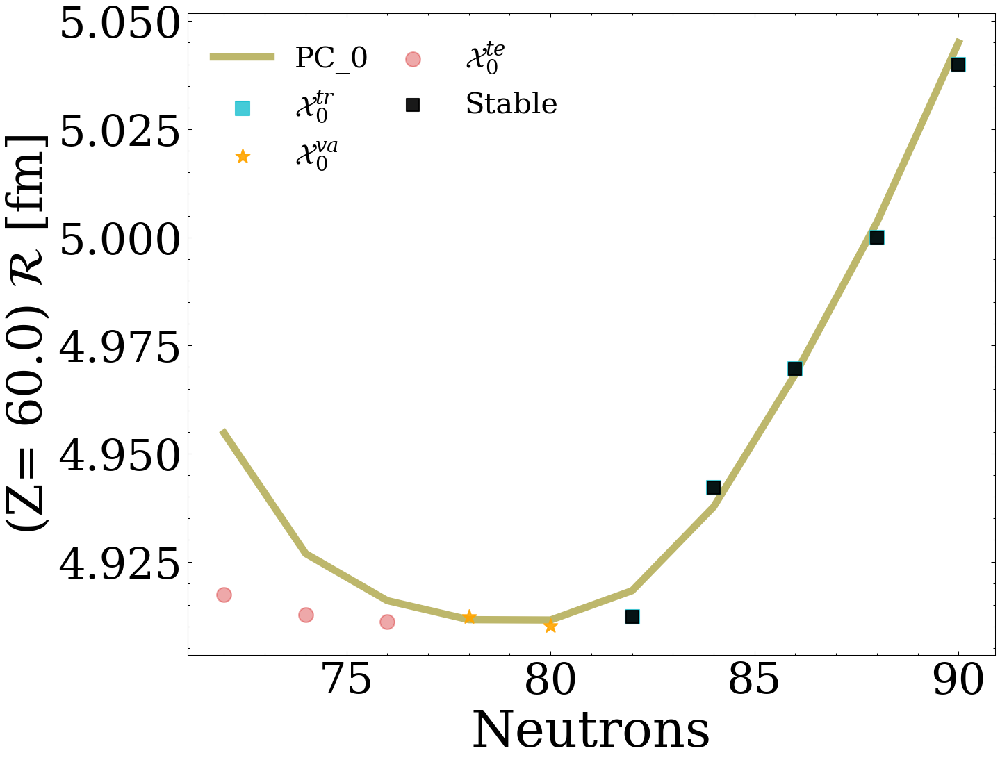

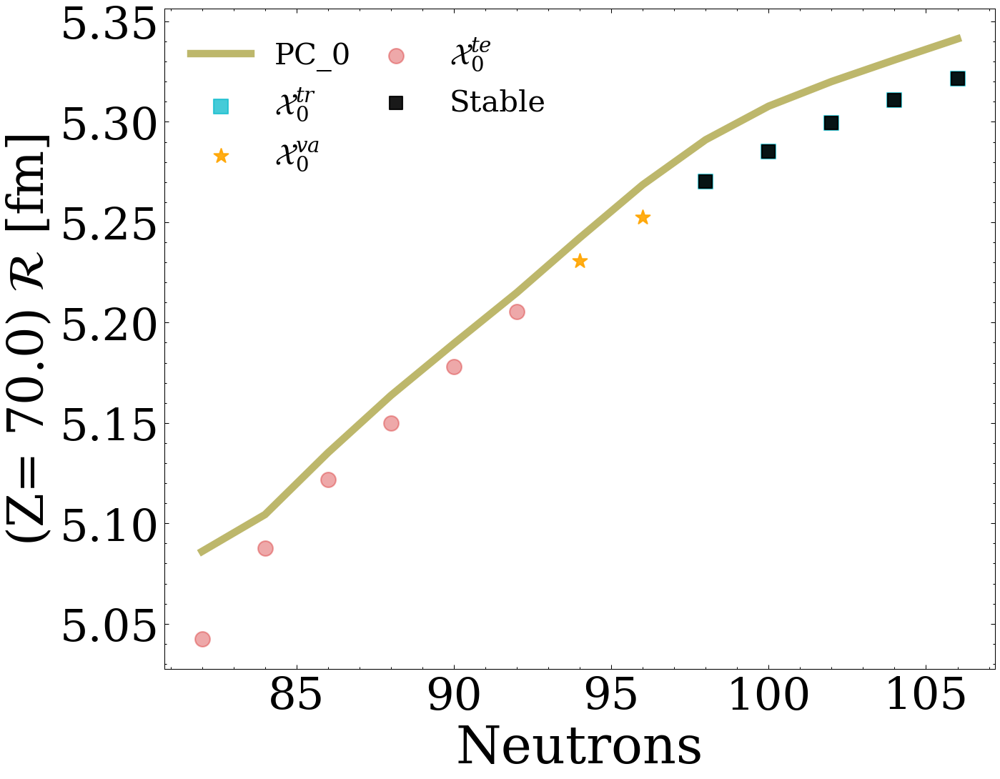

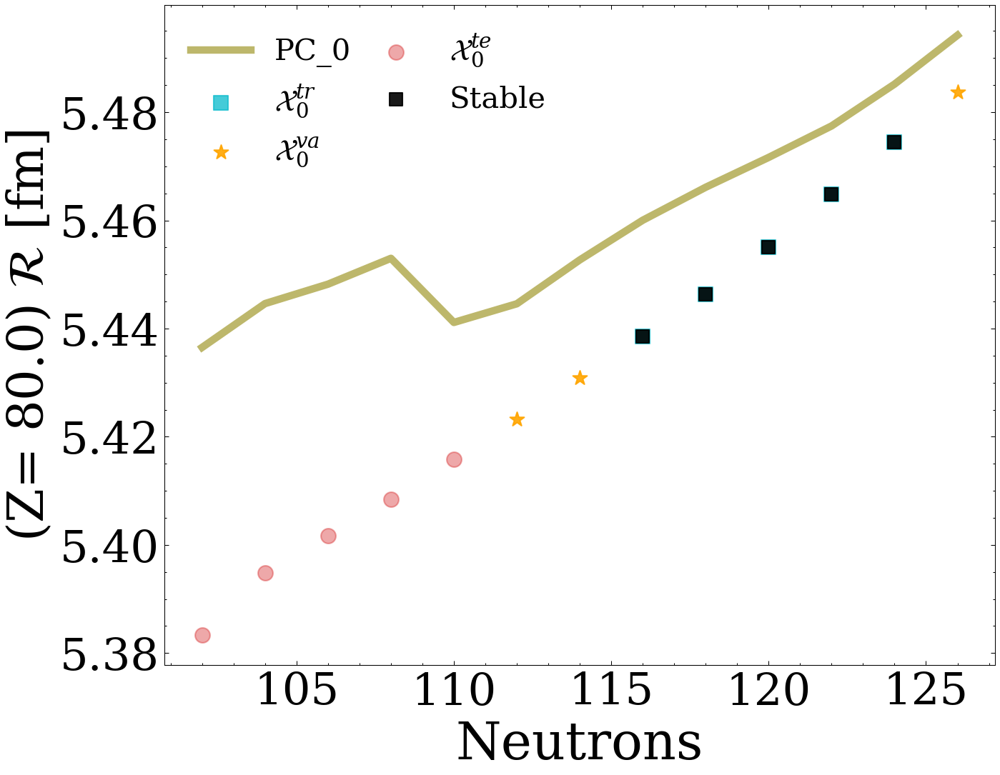

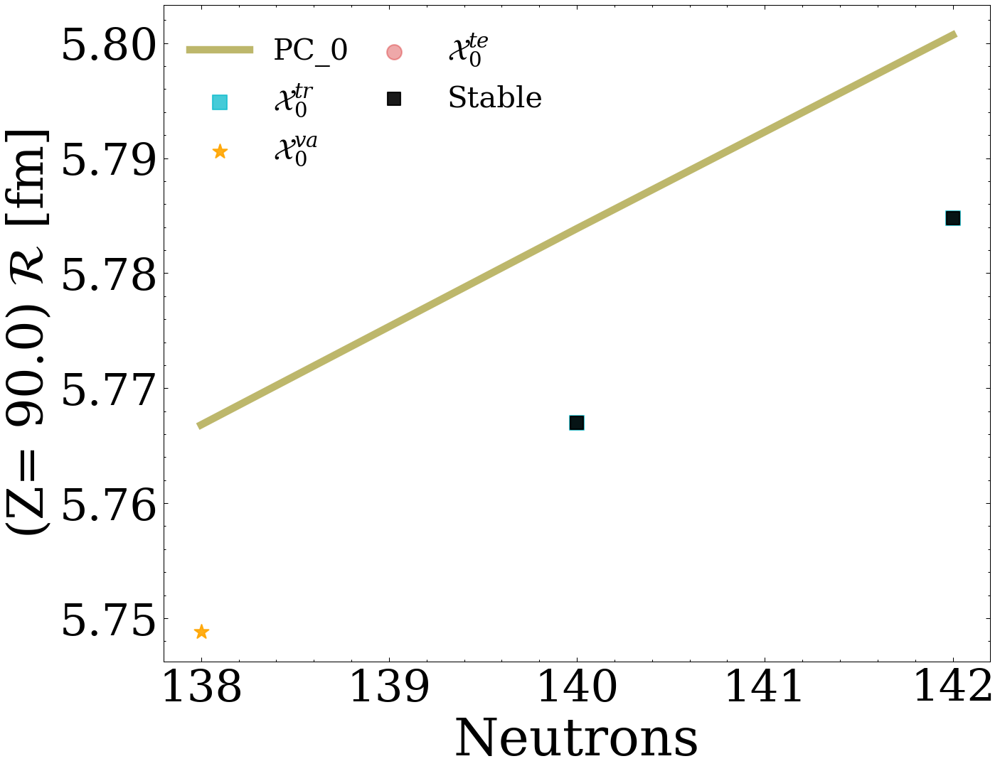

In [94]:
x = np.linspace(20,90,8)
Selected_elements_list = ['Ca', 'Zn', 'Zr', 'Sn', 'Nd', 'Yb', 'Hg', 'Th']
dict_keys_mean = list(filtered_predictions_mean_radius_dict.keys())
dict_keys = list(filtered_models_output_radius_dict.keys())

i = 0
for key in dict_keys_mean:
    plt.rc("xtick", labelsize=30)
    plt.rc("ytick", labelsize=30)
    
    plt.rcParams['text.usetex'] = False
    plt.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'
    
    fig, ax = plt.subplots(figsize=(10,8), dpi=150)
    # This gives you the mean predictions of the isotope that we choose
    plt.plot(filtered_predictions_mean_radius_dict[key][0]["N"], filtered_predictions_mean_radius_dict[key][0]['PC_0'] , color="darkkhaki", label='PC_0',linewidth=5)

    color_local= "khaki"

    # This gives you training predictions for these isotope
    ax.scatter(x = filtered_models_output_radius_dict[dict_keys[i]][1]["N"], y = filtered_models_output_radius_dict[dict_keys[i]][1]['truth'], label = "$\mathcal{X}_0^{tr}$",  alpha = alpha_train,color=color_train,s=100,marker=marker_train,zorder=2)
    # This gives you validation predictions for these isotope
    ax.scatter(x = filtered_models_output_radius_dict[dict_keys[i]][2]["N"], y = filtered_models_output_radius_dict[dict_keys[i]][2]['truth'], label = "$\mathcal{X}_0^{va}$", alpha=alpha_validation ,color=color_validation,s=100,marker=marker_validation,zorder=2)
    # This gives you testing predictions for these isotope
    ax.scatter(x = filtered_models_output_radius_dict[dict_keys[i]][3]["N"], y = filtered_models_output_radius_dict[dict_keys[i]][3]['truth'], label = "$\mathcal{X}_0^{te}$", alpha = alpha_test,color=color_test,s=100,marker=marker_test,zorder=2)
    # This gives you stable predictions for these isotope
    ax.scatter(x = filtered_models_output_radius_dict[dict_keys[i]][4]["N"], y = filtered_models_output_radius_dict[dict_keys[i]][4]['truth'], label = "Stable", alpha = 0.9,color='k',s=80,marker="s",zorder=2)
    
    plt.xlabel("Neutrons",fontsize=35)
    plt.ylabel(f"(Z= {x[i]}) $ {{\\cal R}}$ [fm]", fontsize=33)
    # plt.ylabel(Selected_element_name+ " BE/A MeV",fontsize=25)
         
    plt.legend(fontsize=20,markerscale=1,ncol=2,columnspacing=0.5)
    
    # plt.title(f'{title}', fontsize = 25)
    # plt.savefig(f'Plots/Radii data/Mean model predictions - Radii/{Selected_elements_list[i]}')
    plt.show()

    i = i+1

+ We are now having the graphs of the mean predicitons across all models' space. We want to visualize somehow the principal components contribution to these radii predictions

In [95]:
np.abs(models_PC_radius['PC_3']).max()

0.35500951007899817

In [96]:
# First let's scale the principal components up so that it is comparable to the mean value
scaled_models_PC_radius = models_PC_radius.copy()
models_PC_radius_columns = list(models_PC_radius.columns)
for column in models_PC_radius_columns[4:]:
    scaled_models_PC_radius[column] = 0.2*scaled_models_PC_radius[column]
scaled_models_PC_radius

,N,Z,A,PC_0,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9
0,8,8,16,2.771775,-0.043104,-0.042110,-0.007192,0.045310,0.012951,0.007090,0.024865,0.000935,0.016058
1,10,8,18,2.770609,-0.041984,-0.030743,0.001022,0.027103,0.010003,0.011639,0.018926,0.003401,0.008566
2,8,10,18,2.960734,-0.017738,-0.018976,-0.010181,0.053956,-0.013823,0.008475,0.020218,0.025315,-0.037082
3,10,10,20,2.962131,0.000830,0.015952,-0.007598,0.054255,-0.008541,0.024917,0.034461,0.064615,-0.037361
4,12,10,22,2.961603,-0.010426,0.014283,0.008648,0.018773,0.049819,0.048464,0.034401,0.033751,-0.045265
...,...,...,...,...,...,...,...,...,...,...,...,...,...
340,150,94,244,5.920356,0.007219,0.017338,-0.010700,0.017164,-0.006668,-0.024248,0.009713,0.002231,0.011968
341,146,96,242,5.924588,0.002353,0.016805,-0.008215,0.012539,-0.000739,-0.018576,0.002869,0.008208,0.009694
342,148,96,244,5.937185,0.004584,0.017924,-0.006403,0.011650,-0.001741,-0.020559,0.005879,0.008616,0.011218
343,150,96,246,5.947359,0.004482,0.016685,-0.008922,0.016079,-0.003491,-0.023508,0.007714,0.005476,0.010330


In [97]:
scaled_filtered_models_PC_radius_dict= filtered_models_output_dict_extraction(x, 'scaled_filtered_models_PC_radius_list_' , scaled_models_PC_radius,\
                                    train_coordinates_radius, validation_coordinates_radius, test_coordinates_radius, stable_coordinates_radius)

In [98]:
scaled_filtered_models_PC_radius_dict['scaled_filtered_models_PC_radius_list_20']
for key in list(scaled_filtered_models_PC_radius_dict.keys()):
    for dataframe in scaled_filtered_models_PC_radius_dict[key]:
        dataframe.iloc[:,4:] = dataframe.iloc[:,4:] + np.mean(dataframe['PC_0'])

In [99]:
scaled_filtered_models_PC_radius_dict['scaled_filtered_models_PC_radius_list_20'][0]

,N,Z,A,PC_0,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9
23,20,20,40,3.485110,3.470778,3.482599,3.483924,3.518967,3.477780,3.492056,3.521047,3.486177,3.504433
24,22,20,42,3.489794,3.469882,3.485200,3.490376,3.512593,3.482337,3.495215,3.516497,3.489918,3.500633
25,24,20,44,3.495704,3.470118,3.488476,3.497520,3.509872,3.489766,3.496405,3.514913,3.495242,3.497504
26,26,20,46,3.503571,3.469738,3.488742,3.504327,3.509398,3.497368,3.494307,3.512482,3.499278,3.494276
27,28,20,48,3.512824,3.467021,3.485176,3.510363,3.509829,3.508965,3.491292,3.508739,3.498105,3.496556
28,30,20,50,3.532097,3.472480,3.493005,3.509740,3.507985,3.502329,3.494800,3.502737,3.507620,3.477463


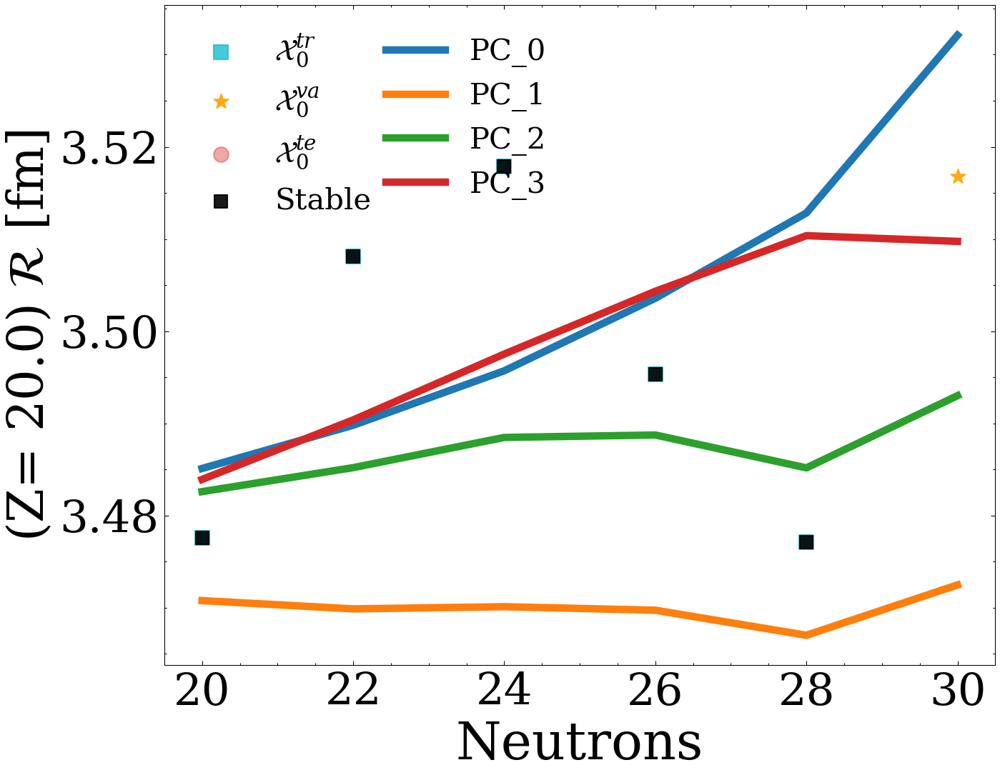

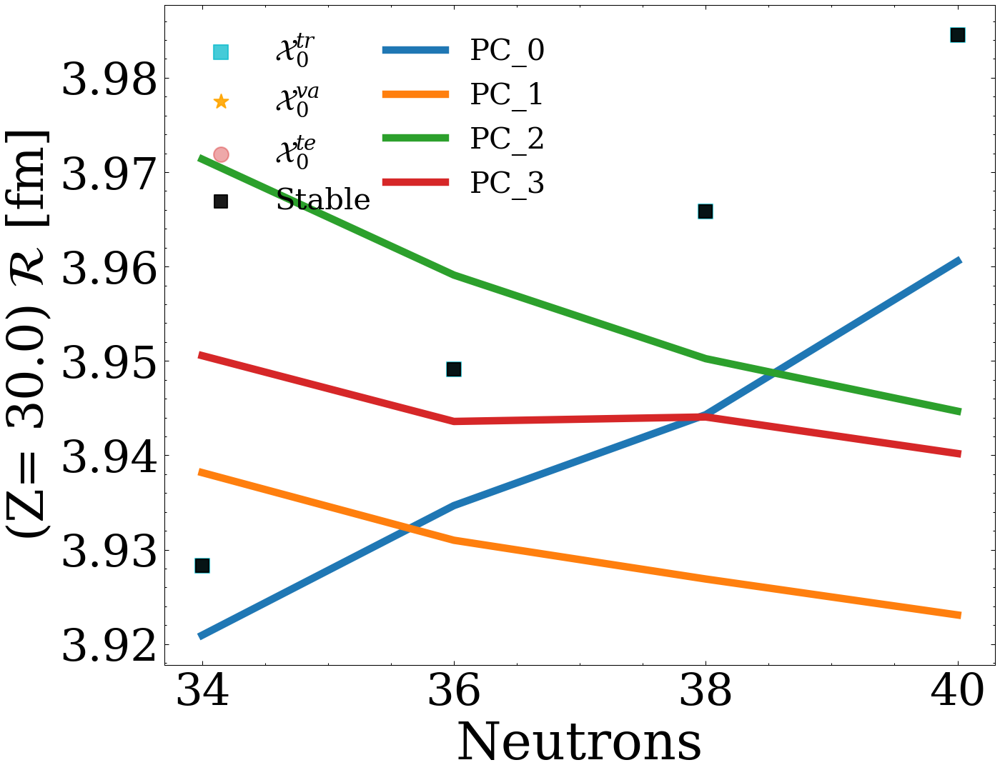

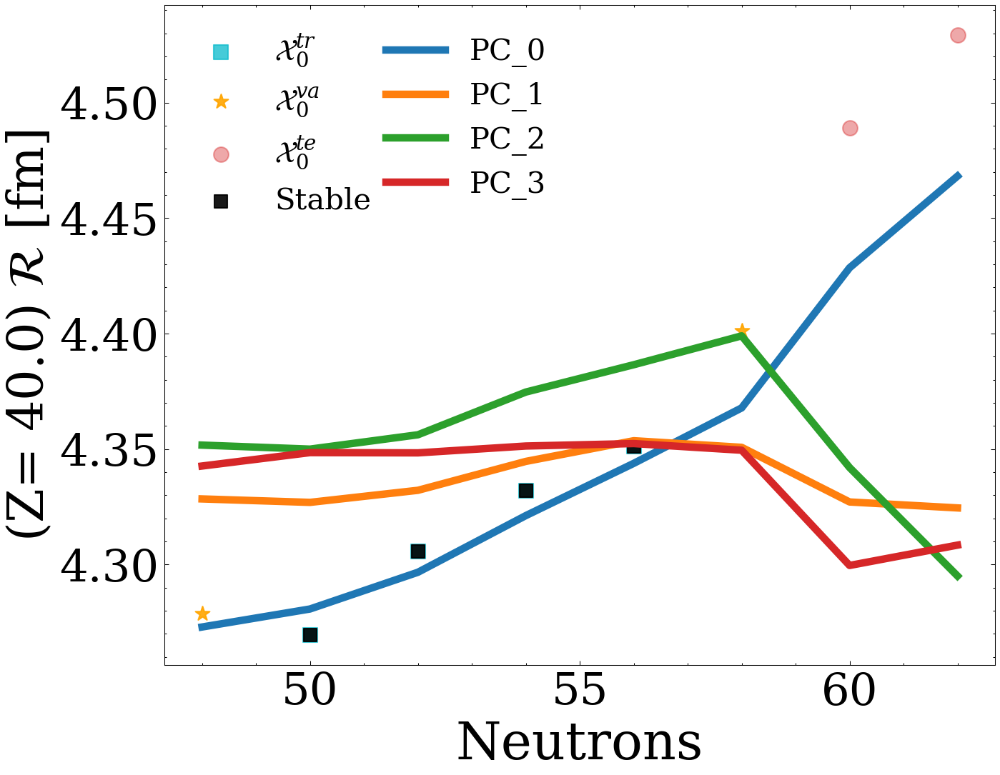

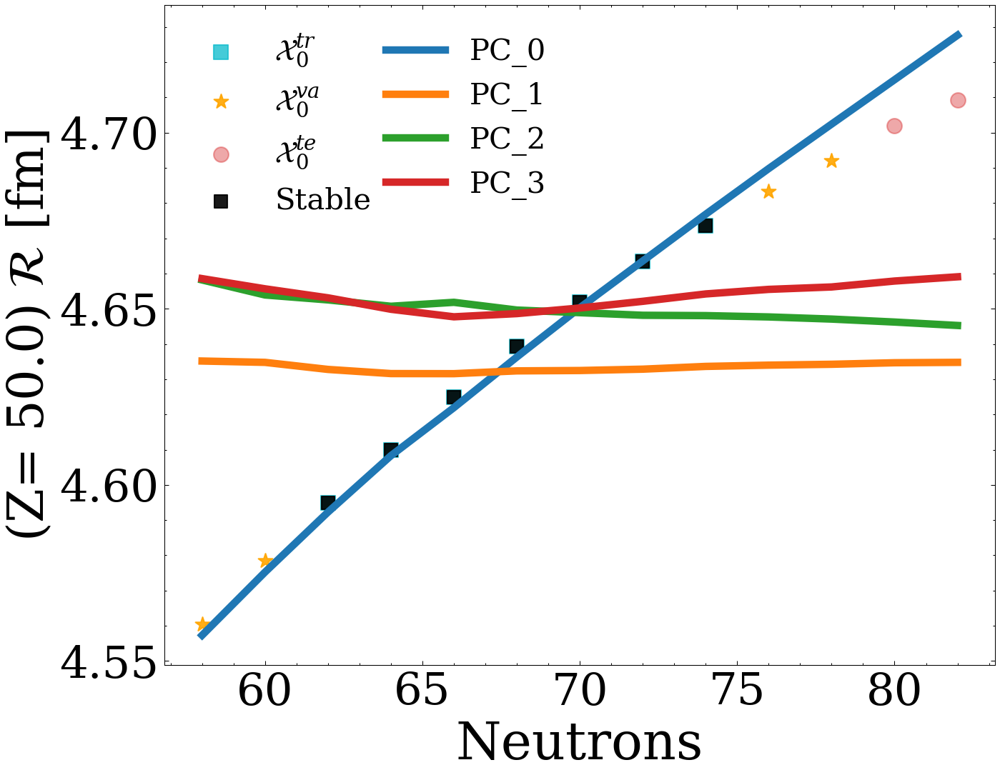

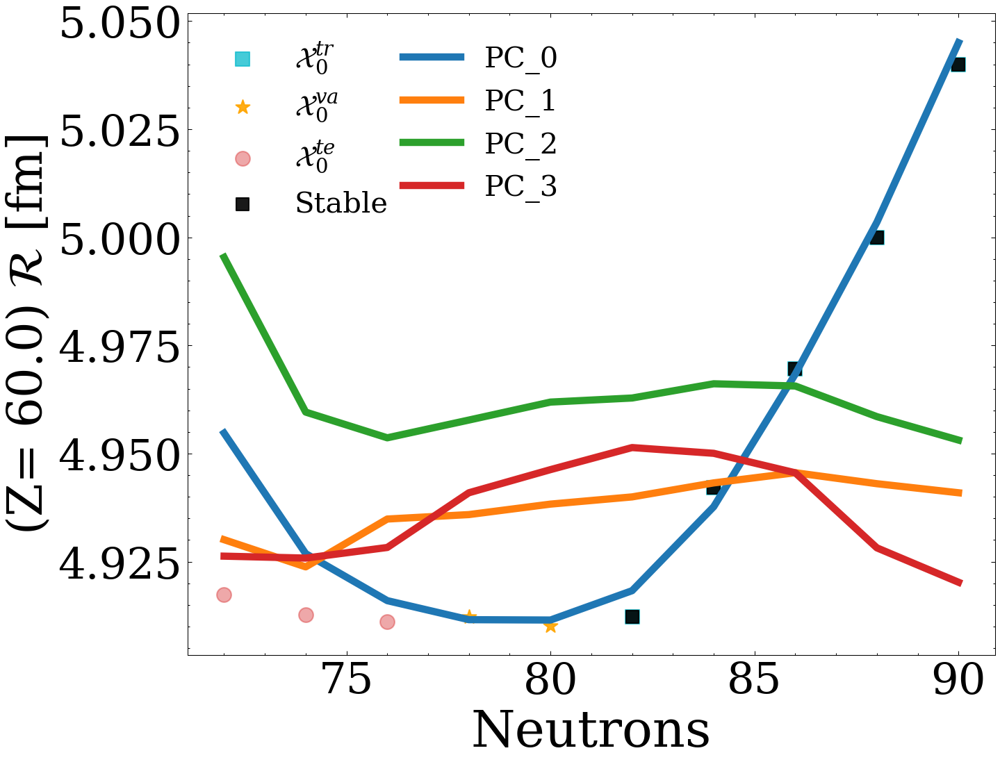

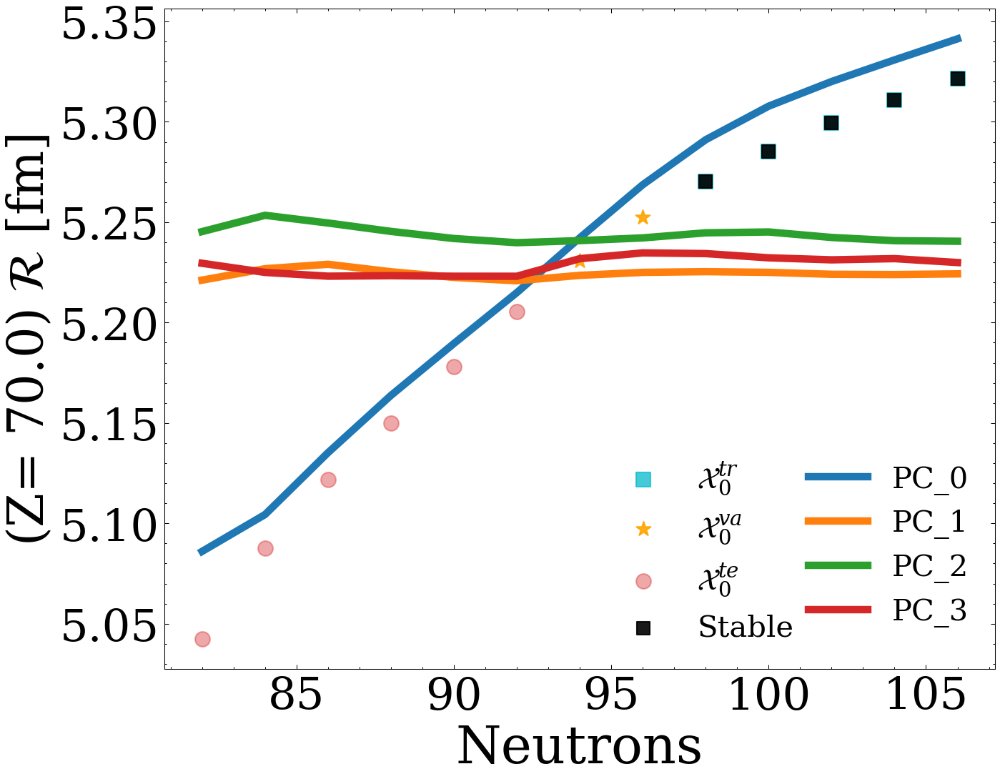

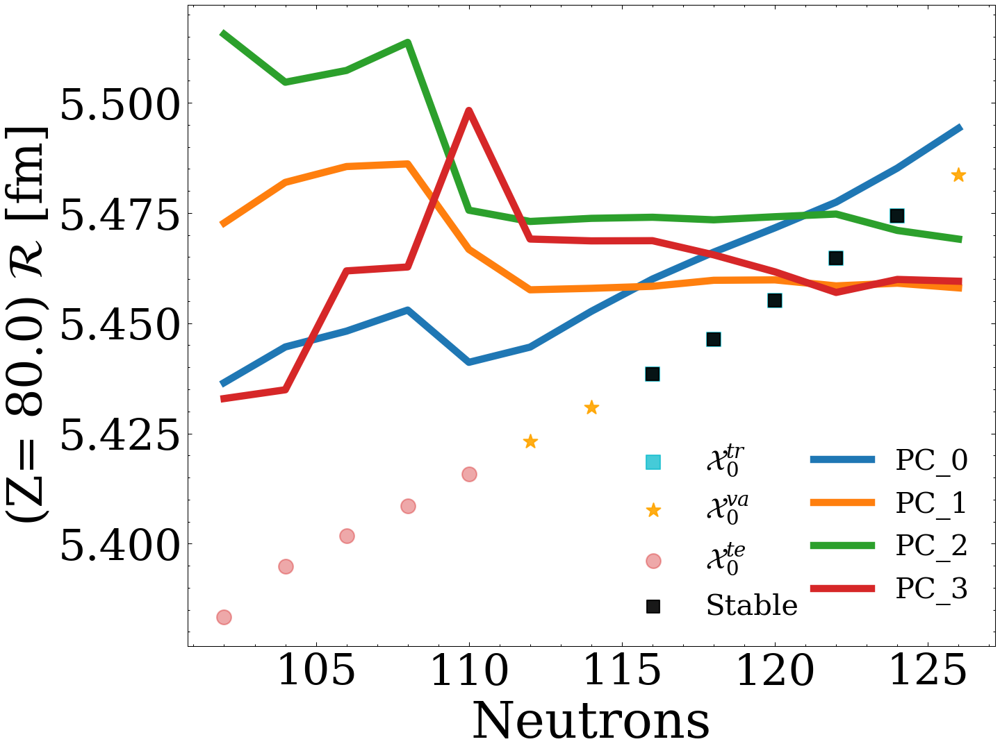

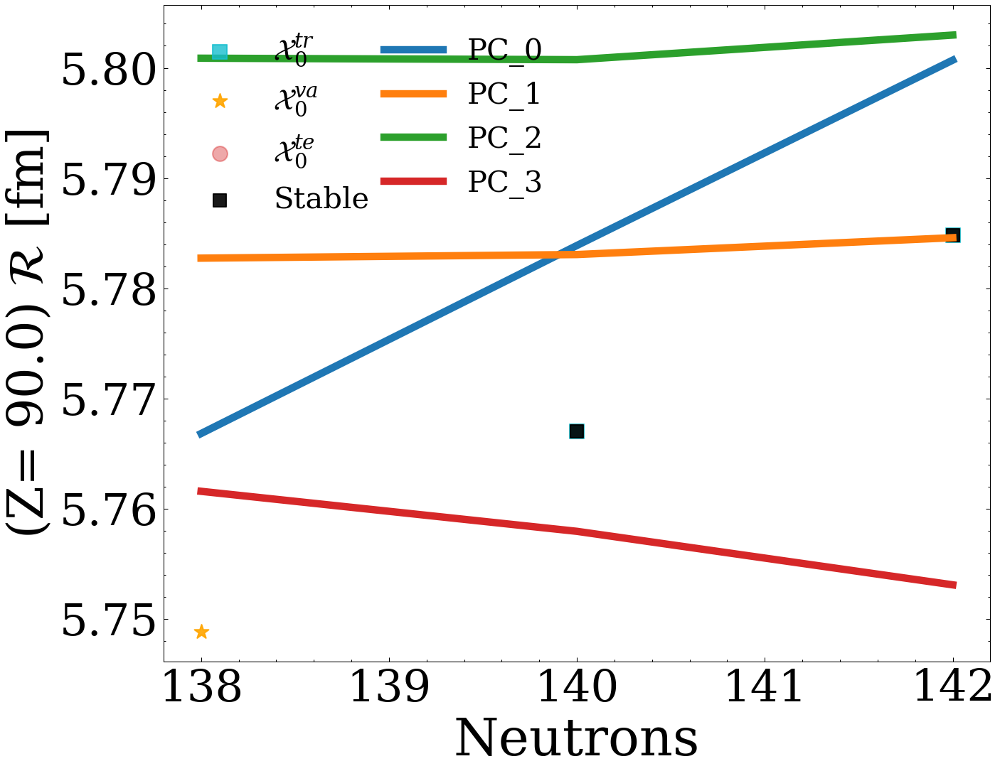

In [100]:
for i in range(len(Selected_elements_list)):
    plot_filtered_something_else_dict(Selected_elements_list, Selected_elements_list[i], x[i], filtered_models_output_radius_dict,\
                                      scaled_filtered_models_PC_radius_dict, ['PC_0', 'PC_1', 'PC_2', 'PC_3'])
    # plt.savefig(f'Plots/Radii data/PCs Visualizations - Radii/{Selected_elements_list[i]}')
    plt.show()

## Now we considered the gibbs sampling method

In [101]:
components_kept = 6
U_hat = np.array([U.T[i] for i in range(components_kept)]).T
S_hat = S[:components_kept]
Vt_hat = np.array([Vt[i]/S[i] for i in range(components_kept)])
Vt_hat_normalized=np.array([Vt[i] for i in range(components_kept)])

In [102]:
y_radius = models_output_radius_train['truth'] - predictions_mean_radius_train

models_PC_radius = models_PC_output(Vt_hat, model_predictions_radius, predictions_mean_radius, models_output_radius)
models_PC_radius_train = models_PC_output(Vt_hat, model_predictions_radius_train, predictions_mean_radius_train, models_output_radius_train)
models_PC_radius_validation = models_PC_output(Vt_hat, model_predictions_radius_validation, predictions_mean_radius_validation, models_output_radius_validation)
models_PC_radius_test = models_PC_output(Vt_hat, model_predictions_radius_test, predictions_mean_radius_test, models_output_radius_test)

In [103]:
models_PC_radius_train

,N,Z,A,PC_0,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6
0,8,8,16,2.771775,-0.215520,-0.210552,-0.035961,0.226548,0.064755,0.035450
1,10,8,18,2.770609,-0.209919,-0.153716,0.005112,0.135515,0.050017,0.058193
3,10,10,20,2.962131,0.004150,0.079762,-0.037991,0.271277,-0.042705,0.124583
4,12,10,22,2.961603,-0.052131,0.071417,0.043241,0.093865,0.249097,0.242320
8,12,12,24,3.088527,-0.133057,0.048328,0.000416,0.257247,0.319584,0.322290
...,...,...,...,...,...,...,...,...,...,...
295,126,82,208,5.513833,-0.021803,0.039150,0.011292,0.037343,-0.023181,-0.096712
332,140,90,230,5.783878,-0.003696,0.084733,-0.129305,0.179665,-0.010083,-0.027298
333,142,90,232,5.800701,0.003943,0.095899,-0.153589,0.227157,-0.024866,-0.009613
334,142,92,234,5.835275,-0.027200,0.077282,-0.161745,0.218351,-0.020061,-0.015473


In [104]:
super_PC_weights_radius = super_params(models_PC_radius_train.iloc[:,4:].values, y_radius)
print(np.dot(super_PC_weights_radius, Vt_hat))
model_weights_radius = np.dot(super_PC_weights_radius, Vt_hat) + np.full(len(Vt_hat[0]) , 1/len(Vt_hat[0]))
model_weights_radius = np.array(model_weights_radius)
naive_supermodel_radius = model_predictions_radius.dot(model_weights_radius)
naive_supermodel_radius_dict = {'N' : models_output_radius['N'], 'Z': models_output_radius['Z'], 'naive supermodel' : naive_supermodel_radius}
naive_supermodel_radius_df = pd.DataFrame(naive_supermodel_radius_dict)
naive_supermodel_radius_df

[ 0.50652589 -0.10434052 -0.0838096  -0.01894824  0.35066402 -0.14263367
 -0.01609223  0.20320189  0.21383967 -0.90840722]


,N,Z,naive supermodel
0,8,8,2.757963
1,10,8,2.761920
2,8,10,2.955295
3,10,10,2.958970
4,12,10,2.950198
...,...,...,...
340,150,94,5.913416
341,146,96,5.917908
342,148,96,5.929757
343,150,96,5.939168


In [105]:
filtered_naive_supermodel_output_radius_list_80 = filtered_models_output_extraction(80, naive_supermodel_radius_df, train_coordinates_radius, validation_coordinates_radius, test_coordinates_radius)
filtered_naive_supermodel_output_radius_list_20 = filtered_models_output_extraction(20, naive_supermodel_radius_df, train_coordinates_radius, validation_coordinates_radius, test_coordinates_radius)

filtered_naive_supermodel_output_radius_stable_20 = filtered_models_output_stable_extraction(20, naive_supermodel_radius_df, stable_coordinates_radius)
filtered_naive_supermodel_output_radius_stable_80 = filtered_models_output_stable_extraction(80, naive_supermodel_radius_df, stable_coordinates_radius)

filtered_naive_supermodel_output_radius_20 = filtered_naive_supermodel_output_radius_list_20[0]
filtered_naive_supermodel_output_radius_train_20 = filtered_naive_supermodel_output_radius_list_20[1]
filtered_naive_supermodel_output_radius_validation_20 = filtered_naive_supermodel_output_radius_list_20[2]
filtered_naive_supermodel_output_radius_test_20 = filtered_naive_supermodel_output_radius_list_20[3]

filtered_naive_supermodel_output_radius_80 = filtered_naive_supermodel_output_radius_list_80[0]
filtered_naive_supermodel_output_radius_train_80 = filtered_naive_supermodel_output_radius_list_80[1]
filtered_naive_supermodel_output_radius_validation_80 = filtered_naive_supermodel_output_radius_list_80[2]
filtered_naive_supermodel_output_radius_test_80 = filtered_naive_supermodel_output_radius_list_80[3]

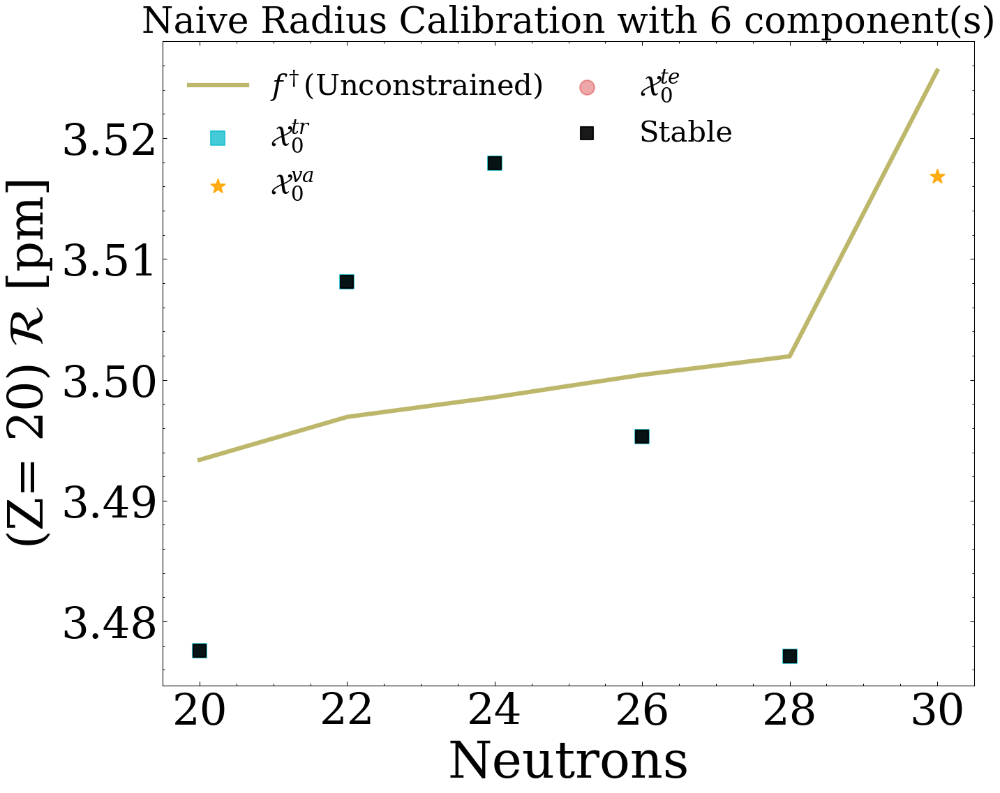

In [106]:
plot_filtered_naive_supermodel(filtered_naive_supermodel_output_radius_list_20, filtered_models_output_radius_list_20, filtered_models_output_radius_stable_20, 20, 'pm', 'R', 'Unconstrained', components_kept )
# plt.savefig(f'Plots/Radii Data/BMM - Radii/Ca Radii Naive BMM with {components_kept} components')
plt.show()

In [107]:
plot_filtered_naive_supermodel(filtered_naive_supermodel_output_radius_list_80, filtered_models_output_radius_list_80, filtered_models_output_radius_stable_80, 80, 'pm', 'R', 'Unconstrained', components_kept )
# plt.savefig(f'Plots/Radii Data/BMM - Radii/Mg Radii Naive BMM with {components_kept} components')
plt.show()

NameError: name 'filtered_models_output_radius_list_80' is not defined

In [39]:
components_kept = 6
U_hat, S_hat, Vt_hat, Vt_hat_normalized = USVt_hat_extraction(U,S,Vt, components_kept)

y_radius = models_output_radius_train['truth'] - predictions_mean_radius_train

models_PC_radius = models_PC_output(Vt_hat, model_predictions_radius, predictions_mean_radius, models_output_radius)
models_PC_radius_train = models_PC_output(Vt_hat, model_predictions_radius_train, predictions_mean_radius_train, models_output_radius_train)
models_PC_radius_validation = models_PC_output(Vt_hat, model_predictions_radius_validation, predictions_mean_radius_validation, models_output_radius_validation)
models_PC_radius_test = models_PC_output(Vt_hat, model_predictions_radius_test, predictions_mean_radius_test, models_output_radius_test)

In [40]:
models_PC_radius

,N,Z,A,PC_0,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6
0,8,8,16,2.771775,-0.215520,-0.210552,-0.035961,0.226548,0.064755,0.035450
1,10,8,18,2.770609,-0.209919,-0.153716,0.005112,0.135515,0.050017,0.058193
2,8,10,18,2.960734,-0.088692,-0.094882,-0.050906,0.269781,-0.069113,0.042373
3,10,10,20,2.962131,0.004150,0.079762,-0.037991,0.271277,-0.042705,0.124583
4,12,10,22,2.961603,-0.052131,0.071417,0.043241,0.093865,0.249097,0.242320
...,...,...,...,...,...,...,...,...,...,...
340,150,94,244,5.920356,0.036097,0.086690,-0.053498,0.085818,-0.033338,-0.121242
341,146,96,242,5.924588,0.011766,0.084023,-0.041073,0.062693,-0.003693,-0.092881
342,148,96,244,5.937185,0.022922,0.089622,-0.032016,0.058250,-0.008706,-0.102797
343,150,96,246,5.947359,0.022408,0.083425,-0.044608,0.080397,-0.017455,-0.117538


In [41]:
X_train = models_PC_radius_train.copy().values[:, 3:]
X_validation = models_PC_radius_validation.copy().values[:,3:]
X_test = models_PC_radius_test.copy().values[:,3:]
X_full = models_PC_radius.copy().values[:,3:]

In [42]:
nu0_chosen=1
sigma20_chosen=0.001

In [43]:
def gibbs_sampler(y, X, iterations,prior_info):
    #Make sure that "y" has the correct structure. If data is being centered, it should have the mean already substracted
    b_mean_prior, b_mean_cov, nu0, sigma20  =  prior_info
    #From A_First_Course_in_Bayesian_Statistical_Methods (page ~ 159), 
    #nu0 represent the effective prior samples and sigma2_0 represents the expected prior variance
    
    b_mean_cov_inv=np.linalg.inv(b_mean_cov)
    n = len(y) # We are still taking mass and radius to be the same size
    
    X_T_X=X.T.dot(X)
    X_T_X_inv = np.linalg.inv(X_T_X)

    b_data = X_T_X_inv.dot(X.T).dot(y)

    
    
    supermodel=X.dot(b_data)
    

    residuals = y - supermodel 

    
    
    sigma2 = np.sum(residuals**2) / len(residuals) 
    cov_matrix = sigma2 * X_T_X_inv
    
    samples = []
    
    for i in range(iterations):
        # Sample from the conditional posterior of bs given sigma2 and data

        
        cov_matrix = np.linalg.inv(X_T_X/sigma2
                                   + b_mean_cov_inv)
        
        mean_vector = cov_matrix.dot(        b_mean_cov_inv.dot(b_mean_prior)+ X.T.dot(y)/sigma2  )
        
        
        b_current = np.random.multivariate_normal(mean_vector, cov_matrix)

        
        
        
        # Sample from the conditional posterior of sigma2 given bs and data
        supermodel=X.dot(b_current)
        
        residuals = y - supermodel 
        
        
        shape_post = (nu0 + n)/2.
        scale_post = (nu0*sigma20 + np.sum(residuals**2))/2.0
        # sigma2 = 1 / np.random.gamma(shape_post, 1/scale_post)
        sigma2 = 1 / np.random.default_rng().gamma(shape_post, 1/scale_post)
        
        
        samples.append(np.append(b_current,np.sqrt(sigma2)))
    


    return np.array(samples)

In [44]:
samples = gibbs_sampler(y_radius,X_train[:, 1:], 100000,[np.full(components_kept,0),np.abs(np.diag(S[:components_kept]**2)), nu0_chosen, sigma20_chosen])

<>:2: SyntaxWarning: invalid escape sequence '\s'
<>:2: SyntaxWarning: invalid escape sequence '\s'
C:\Users\congn\AppData\Local\Temp\ipykernel_9288\4282783189.py:2: SyntaxWarning: invalid escape sequence '\s'
  label_global.append(f'$\sigma$')


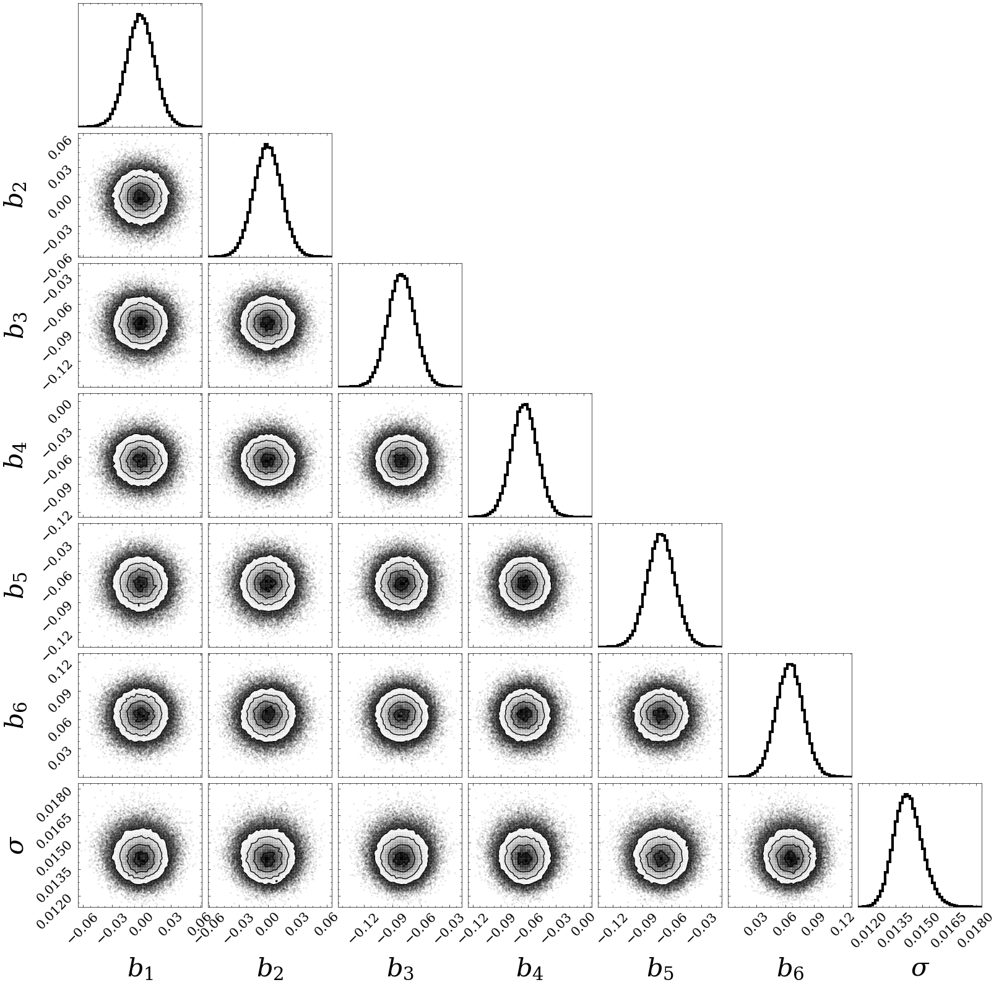

In [45]:
label_global = [f'$b_{i}$' for i in range(1, components_kept+1)]
label_global.append(f'$\sigma$')

plt.rcParams['text.usetex'] = False
plt.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'

plt.rc("xtick", labelsize=15)
plt.rc("ytick", labelsize=15)

figure = corner.corner(samples,bins=50, dpi=300, hist_kwargs={"linewidth": 3},
                       labels=label_global, 
                    #    truths=np.append(beta,np.sqrt(sigma_squared)),
                    #    truth_color="r",
                       label_kwargs={"fontsize": 30},labelpad=0.1)
plt.show()

In [46]:
# This code will help us to calculate the weight of the individual models from the weight of the principal components
model_weights = []
for beta in samples:
    model_weights.append(np.dot(beta[:-1], Vt_hat) + np.full(len(Vt_hat[0]) , 1/len(Vt_hat[0])))
model_weights= np.array(model_weights)

In [47]:
model_weights.shape

(100000, 10)

In [48]:
filtered_models_output_radius_list_20 = filtered_models_output_extraction(20, models_output_radius, train_coordinates_radius, validation_coordinates_radius, test_coordinates_radius)
filtered_models_output_radius_list_28 = filtered_models_output_extraction(28, models_output_radius, train_coordinates_radius, validation_coordinates_radius, test_coordinates_radius)
filtered_models_output_radius_list_50 = filtered_models_output_extraction(50, models_output_radius, train_coordinates_radius, validation_coordinates_radius, test_coordinates_radius)
filtered_models_output_radius_list_82 = filtered_models_output_extraction(82, models_output_radius, train_coordinates_radius, validation_coordinates_radius, test_coordinates_radius)


filtered_models_output_radius_stable_20 = filtered_models_output_stable_extraction(20, models_output_radius, stable_coordinates_radius)
filtered_models_output_radius_stable_28 = filtered_models_output_stable_extraction(28, models_output_radius, stable_coordinates_radius)
filtered_models_output_radius_stable_50 = filtered_models_output_stable_extraction(50, models_output_radius, stable_coordinates_radius)
filtered_models_output_radius_stable_82 = filtered_models_output_stable_extraction(82, models_output_radius, stable_coordinates_radius)

In [49]:
filtered_models_output_radius_20 = filtered_models_output_radius_list_20[0]
filtered_models_output_radius_train_20 = filtered_models_output_radius_list_20[1]
filtered_models_output_radius_validation_20 = filtered_models_output_radius_list_20[2]
filtered_models_output_radius_test_20 = filtered_models_output_radius_list_20[3]

filtered_models_output_radius_28 = filtered_models_output_radius_list_28[0]
filtered_models_output_radius_train_28 = filtered_models_output_radius_list_28[1]
filtered_models_output_radius_validation_28 = filtered_models_output_radius_list_28[2]
filtered_models_output_radius_test_28 = filtered_models_output_radius_list_28[3]

filtered_models_output_radius_50 = filtered_models_output_radius_list_50[0]
filtered_models_output_radius_train_50 = filtered_models_output_radius_list_50[1]
filtered_models_output_radius_validation_50 = filtered_models_output_radius_list_50[2]
filtered_models_output_radius_test_50 = filtered_models_output_radius_list_50[3]


filtered_models_output_radius_82 = filtered_models_output_radius_list_82[0]
filtered_models_output_radius_train_82 = filtered_models_output_radius_list_82[1]
filtered_models_output_radius_validation_82 = filtered_models_output_radius_list_82[2]
filtered_models_output_radius_test_82 = filtered_models_output_radius_list_82[3]

In [50]:
filtered_models_output_radius_20

,N,Z,A,ME2,MEdelta,PC1,NL3S,SKMS,SKP,SLY4,SV,UNEDF0,UNEDF1,truth
23,20,20,40,3.465,3.425,3.457,3.470,3.508447,3.530085,3.508657,3.501743,3.501457,3.483709,3.4776
24,22,20,42,3.469,3.435,3.463,3.468,3.513530,3.536751,3.515920,3.505667,3.503420,3.487649,3.5081
25,24,20,44,3.474,3.447,3.472,3.469,3.517619,3.543701,3.522998,3.510855,3.505047,3.494824,3.5179
26,26,20,46,3.479,3.459,3.481,3.472,3.523560,3.552996,3.531629,3.519449,3.511087,3.505986,3.4953
27,28,20,48,3.481,3.468,3.490,3.474,3.533390,3.564701,3.543605,3.531471,3.521495,3.520582,3.4771
28,30,20,50,3.512,3.496,3.511,3.498,3.547856,3.578512,3.559659,3.546039,3.534937,3.536964,3.5168


In [51]:
filtered_model_predictions_radius_20 = filtered_models_output_radius_20.iloc[:,3:-1].values
filtered_model_predictions_radius_28 = filtered_models_output_radius_28.iloc[:,3:-1].values
filtered_model_predictions_radius_50 = filtered_models_output_radius_50.iloc[:,3:-1].values
filtered_model_predictions_radius_82 = filtered_models_output_radius_82.iloc[:,3:-1].values

In [52]:
lower_radius_20, median_radius_20, upper_radius_20 = rndm_m_radius_calculator(model_weights, filtered_model_predictions_radius_20, samples)
lower_radius_28, median_radius_28, upper_radius_28 = rndm_m_radius_calculator(model_weights, filtered_model_predictions_radius_28, samples)
lower_radius_50, median_radius_50, upper_radius_50 = rndm_m_radius_calculator(model_weights, filtered_model_predictions_radius_50, samples)
lower_radius_82, median_radius_82, upper_radius_82 = rndm_m_radius_calculator(model_weights, filtered_model_predictions_radius_82, samples)

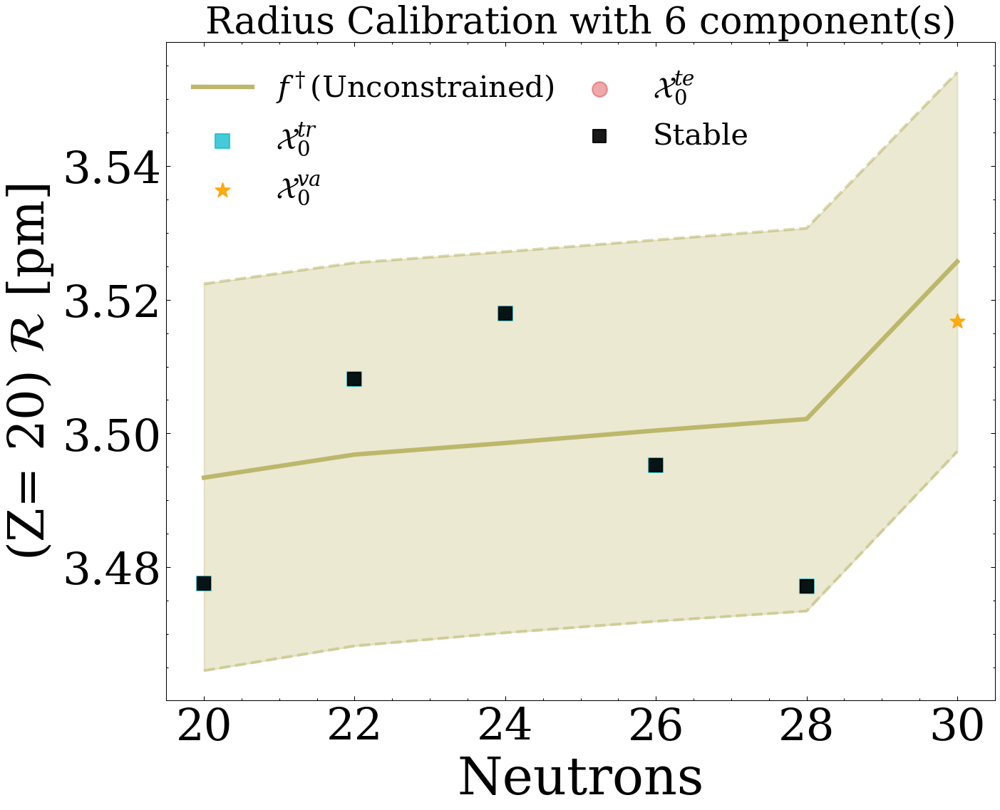

In [53]:
supermodel_predictions_radius_range_20 = [lower_radius_20, median_radius_20, upper_radius_20]
# title = 'Radius Calibration'
# savefig_20_radius = 'Plots/Heterogeneous Real Scaled Analysis/Radius predictions/Unconstrained CR forecasts for Z = 20 - Radius Analysis - 2PCs.png'
plot_filtered_supermodel(supermodel_predictions_radius_range_20, filtered_models_output_radius_list_20, filtered_models_output_radius_stable_20, 20, 'pm', 'R', 'Unconstrained', components_kept )
# plt.savefig(f'Plots/Radii Data/BMM - Radii/Ca Radii BMM with {components_kept} components')
plt.show()

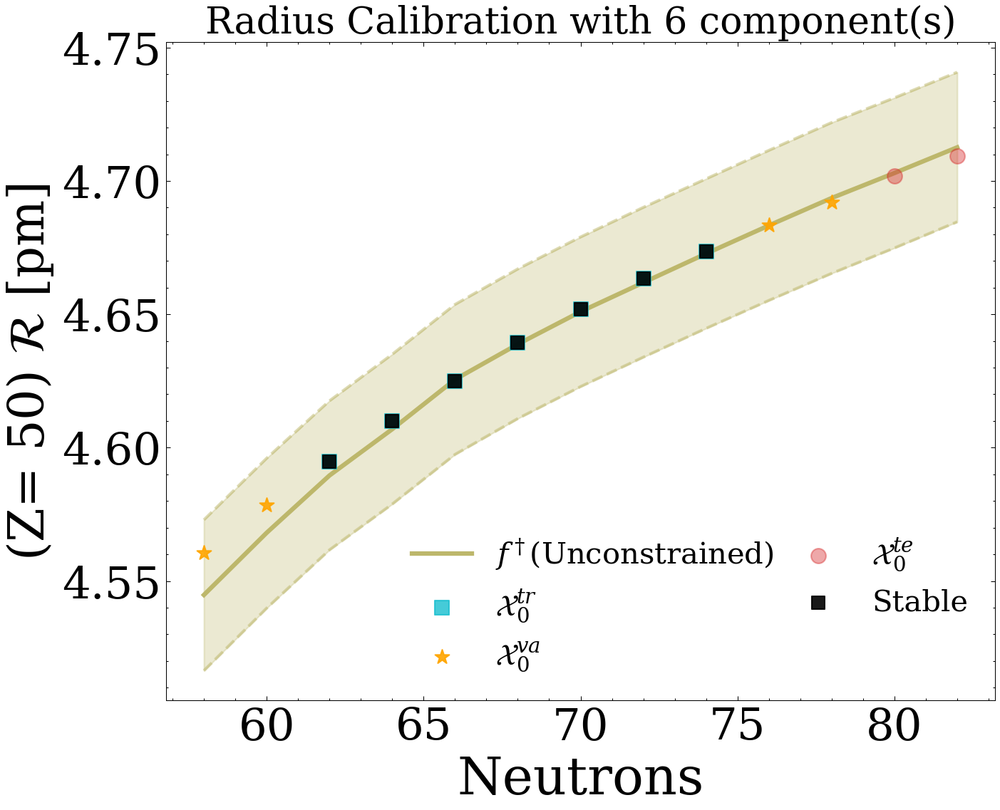

In [54]:
supermodel_predictions_radius_range_50 = [lower_radius_50, median_radius_50, upper_radius_50]
# title = 'Radius Calibration'
# savefig_20_radius = 'Plots/Heterogeneous Real Scaled Analysis/Radius predictions/Unconstrained CR forecasts for Z = 20 - Radius Analysis - 2PCs.png'
plot_filtered_supermodel(supermodel_predictions_radius_range_50, filtered_models_output_radius_list_50, filtered_models_output_radius_stable_50, 50, 'pm', 'R', 'Unconstrained', components_kept )
# plt.savefig(f'Plots/Radii Data/BMM - Radii/Sn Radii BMM with {components_kept} components')
plt.show()

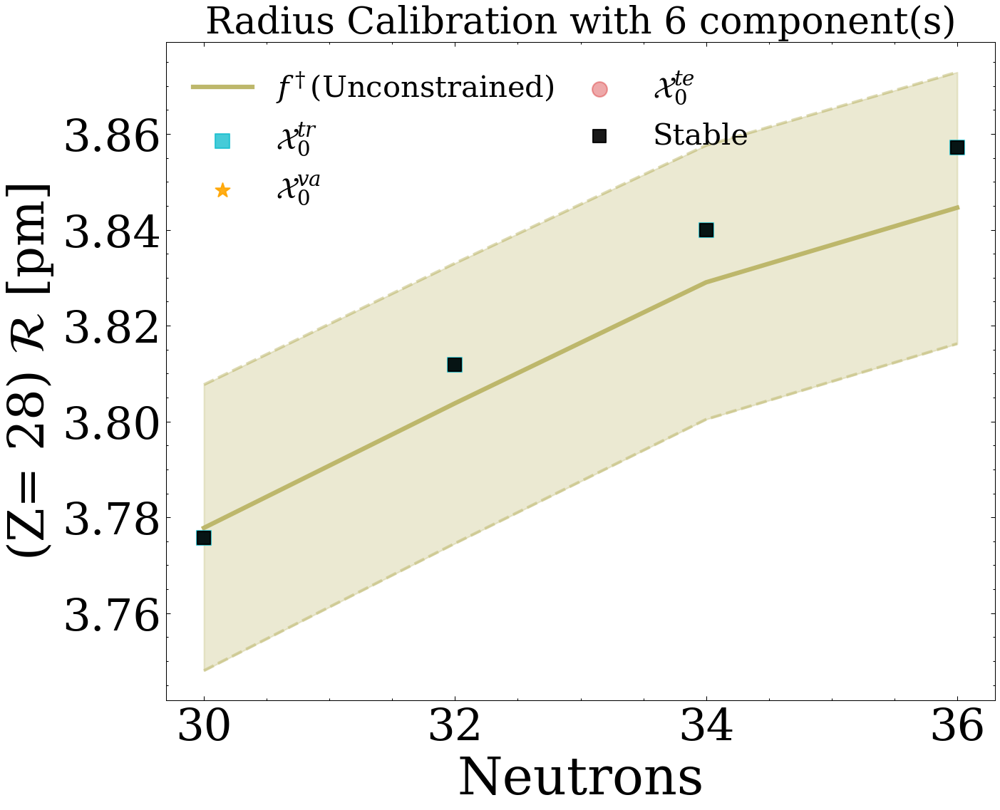

In [55]:
supermodel_predictions_radius_range_28 = [lower_radius_28, median_radius_28, upper_radius_28]
# title = 'Radius Calibration'
# savefig_20_radius = 'Plots/Heterogeneous Real Scaled Analysis/Radius predictions/Unconstrained CR forecasts for Z = 20 - Radius Analysis - 2PCs.png'
plot_filtered_supermodel(supermodel_predictions_radius_range_28, filtered_models_output_radius_list_28, filtered_models_output_radius_stable_28, 28, 'pm', 'R', 'Unconstrained', components_kept )
# plt.savefig(f'Plots/Radii Data/BMM - Radii/Ni Radii BMM with {components_kept} components')
plt.show()

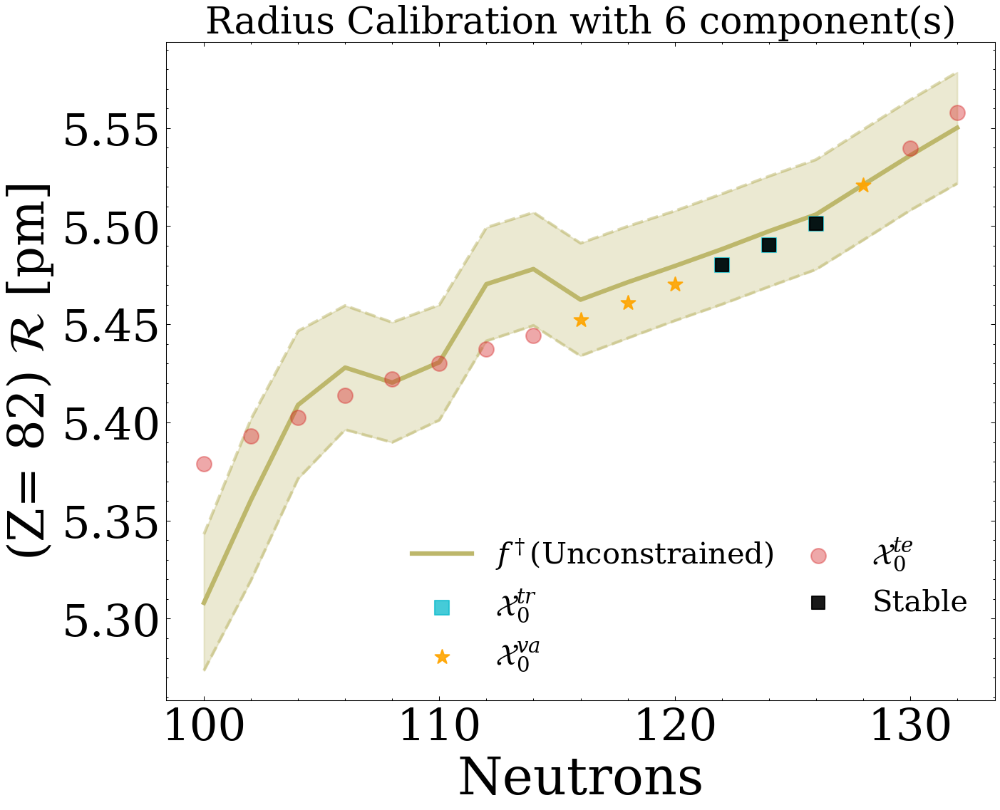

In [56]:
supermodel_predictions_radius_range_82 = [lower_radius_82, median_radius_82, upper_radius_82]
# title = 'Radius Calibration'
# savefig_20_radius = 'Plots/Heterogeneous Real Scaled Analysis/Radius predictions/Unconstrained CR forecasts for Z = 20 - Radius Analysis - 2PCs.png'
plot_filtered_supermodel(supermodel_predictions_radius_range_82, filtered_models_output_radius_list_82, filtered_models_output_radius_stable_82, 82, 'pm', 'R', 'Unconstrained', components_kept )
# plt.savefig(f'Plots/Radii Data/BMM - Radii/Pb Radii BMM with {components_kept} components')
plt.show()

In [57]:
model_weights.shape # This is the models' weights corresponding to gibbs-sampling function

(100000, 10)

In [58]:
model_weights_and_uncertainties = np.vstack((model_weights.T, samples.T[-1])).T # This is the models' weights and the uncertainties of model's predictions

<>:21: SyntaxWarning: invalid escape sequence '\o'
<>:21: SyntaxWarning: invalid escape sequence '\o'
C:\Users\congn\AppData\Local\Temp\ipykernel_9288\583111971.py:21: SyntaxWarning: invalid escape sequence '\o'
  plt.ylabel('$\omega_k$',fontsize=35)


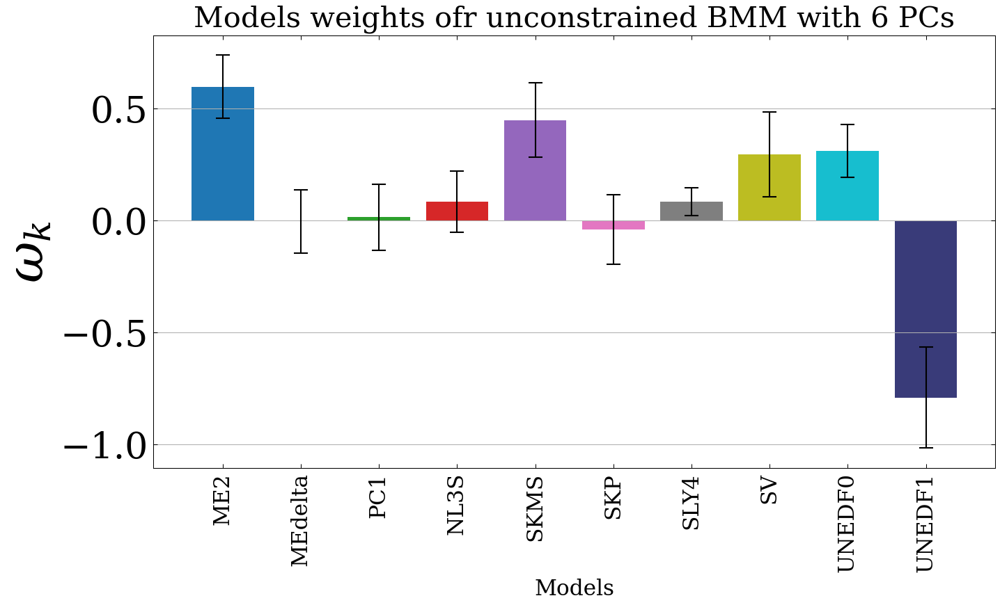

In [59]:
plt.rc("xtick", labelsize=20)
plt.rc("ytick", labelsize=20)
# labels=list(models_output.keys())
plt.figure(figsize=(10, 6),dpi=150)
# y_max=0.6


i=0
for model in key_list:
        
        # ax.plot(filtered_models_output["N"], filtered_models_output[key_list[model_index]], 
        #         label = n_Labels[class_index], color=colors[class_index],alpha = alpha_models,linewidth=5)
        # plt.bar(model , np.mean(samples_naive_space_sigma.T[i]), color=colors[i])
        plt.bar(model , np.mean(model_weights.T[i]),yerr=2*np.std(model_weights.T[i]), color=colors[i],capsize=5)
        i=i+1

plt.minorticks_off()


plt.xlabel('Models',fontsize=15)
plt.ylabel('$\omega_k$',fontsize=35)
# plt.ylim(-0.2,0.5)
# plt.yticks([0, 0.2, 0.4])
plt.xticks(fontsize=15,rotation='vertical')
plt.yticks(fontsize=25)
plt.grid(axis='y')
plt.title(f'Models weights ofr unconstrained BMM with {components_kept} PCs', fontsize= 20)
plt.tight_layout()
# plt.savefig(f'Plots/Radii Data/Models weights/Uncontrained BMM models weights with {components_kept} PCs')
plt.show()

In [60]:
np.sum(np.mean(model_weights.T[i]) for i in range(10))

C:\Users\congn\AppData\Local\Temp\ipykernel_9288\816496500.py:1: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  np.sum(np.mean(model_weights.T[i]) for i in range(10))


1.0

In [61]:
%%time
rndm_m_train_unconstrained = rndm_m_radius_samples(X_train, samples, total_samples = 10000) 
rndm_m_validation_unconstrained = rndm_m_radius_samples(X_validation, samples, total_samples = 10000) 
rndm_m_test_unconstrained = rndm_m_radius_samples(X_test, samples, total_samples = 10000) 

CPU times: total: 4min 51s
Wall time: 1min 5s


In [62]:
rndm_m_train_unconstrained.shape

(10000, 167)

In [63]:
percentiles = np.arange(0, 101, 5)
coverage_train_unconstrained = coverage(percentiles, rndm_m_train_unconstrained, models_output_radius_train)
coverage_validation_unconstrained = coverage(percentiles, rndm_m_validation_unconstrained, models_output_radius_validation)
coverage_test_unconstrained = coverage(percentiles, rndm_m_test_unconstrained, models_output_radius_test)

In [64]:
coverage_train_unconstrained

[0.0,
 4.790419161676647,
 8.383233532934131,
 13.17365269461078,
 21.55688622754491,
 25.149700598802394,
 30.538922155688624,
 38.32335329341318,
 43.11377245508982,
 50.898203592814376,
 56.287425149700596,
 62.27544910179641,
 71.25748502994011,
 76.04790419161677,
 82.03592814371258,
 85.62874251497006,
 88.62275449101796,
 92.21556886227546,
 94.01197604790418,
 96.40718562874252,
 99.40119760479041]

<>:20: SyntaxWarning: invalid escape sequence '\%'
<>:21: SyntaxWarning: invalid escape sequence '\%'
<>:20: SyntaxWarning: invalid escape sequence '\%'
<>:21: SyntaxWarning: invalid escape sequence '\%'
C:\Users\congn\AppData\Local\Temp\ipykernel_9288\1230968707.py:20: SyntaxWarning: invalid escape sequence '\%'
  plt.xlabel('Credible Interval (\%)',fontsize=22)
C:\Users\congn\AppData\Local\Temp\ipykernel_9288\1230968707.py:21: SyntaxWarning: invalid escape sequence '\%'
  plt.ylabel('Coverage (\%)',fontsize=22)


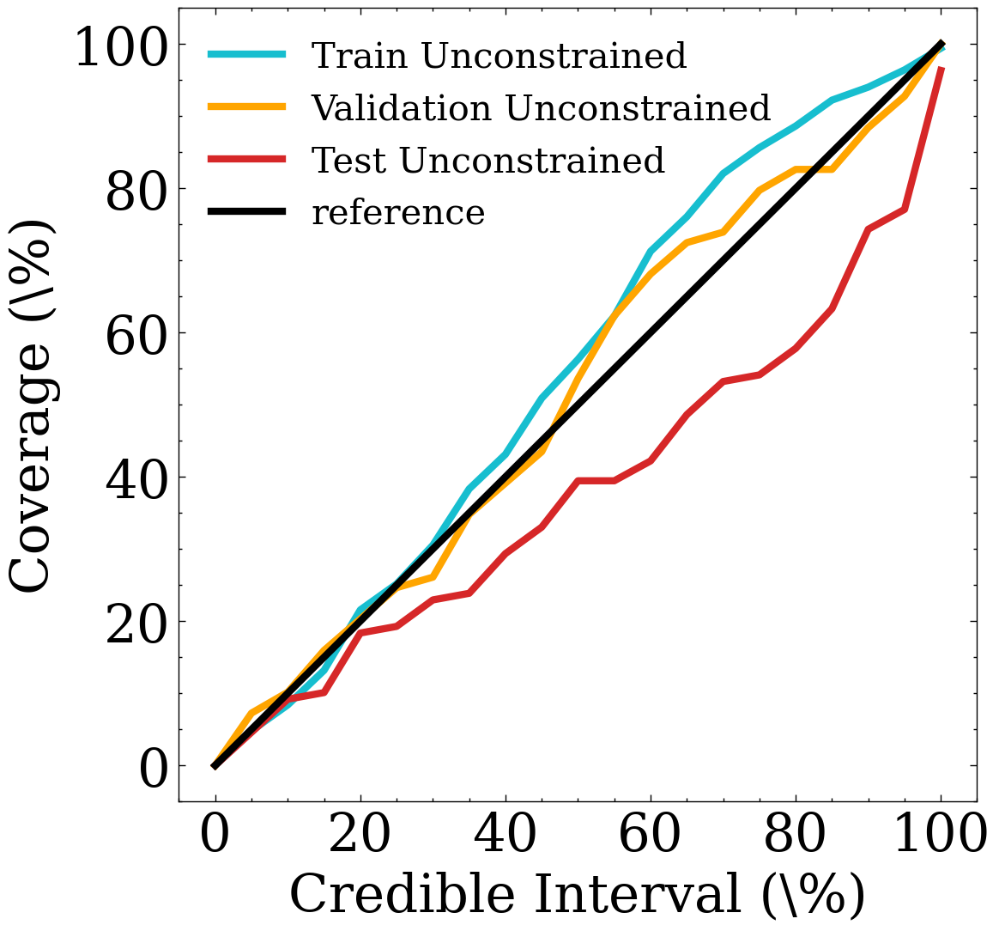

In [66]:
plt.rc("xtick", labelsize=22)
plt.rc("ytick", labelsize=22)
# Plotting the results
plt.figure(figsize=(6, 6),dpi=200)

width_line=2

plt.plot(percentiles, coverage_train_unconstrained, label='Train Unconstrained',color=color_train,linewidth= 3)
plt.plot(percentiles, coverage_validation_unconstrained, label='Validation Unconstrained',color=color_validation,linewidth=3)
plt.plot(percentiles, coverage_test_unconstrained, label='Test Unconstrained',color=color_test,linewidth=3)


# plt.plot(percentiles, coverage_train_simplex,linestyle='dashed', label='Training Simplex',color=color_trainig,linewidth=width_line)
# plt.plot(percentiles, coverage_validation_simplex, linestyle='dashed',label='Validation Simplex',color=color_validation,linewidth=width_line)
# plt.plot(percentiles, coverage_test_simplex,linestyle='dashed', label='Test Simplex',color=color_testing,linewidth=width_line)



plt.plot(percentiles, percentiles,label='reference',color='k',linewidth=3)
plt.xlabel('Credible Interval (\%)',fontsize=22)
plt.ylabel('Coverage (\%)',fontsize=22)

plt.xticks(ticks=[0, 20,40,60,80,100])

# plt.title('Coverage of Observed Data Points by Credible Intervals')
# plt.grid(True)
plt.legend(fontsize=15)

# plt.savefig('Plots/Radii Data/Coverage graph/Coverag graph of global radii unconstrained case.png')
plt.show()

In [68]:
bias0=np.full(len(model_predictions_radius_train.T),1/len(model_predictions_radius_train.T))
#This term will be added to the \omegas when obtaining them from the \betas to account for centering the data

In [69]:
def gibbs_sampler_simplex(y, X, iterations,prior_info,burn=10000,stepsize=0.001):
    if centering_data == False:
        print("Only available for centering data")
        return 
    #Make sure that "y" has the correct structure. If data is being centered, it should have the mean already substracted
#     b_mean_prior, b_mean_cov, nu0, sigma20  =  prior_info
    
    nu0, sigma20  =  prior_info   #Since our prior is only in \sigma, we are letting the \betas be free beyond the simplex
    
    #From A_First_Course_in_Bayesian_Statistical_Methods (page ~ 159), nu0 represent the effective prior samples and sigma2_0 represents the expected prior variance
    
    cov_matrix_step=np.diag(S_hat**2*stepsize**2)
    
    n = len(y)
    
    #Initializing the starting point at the average of all the models
    b_current = np.full(len(X),0)

    
    
    supermodel_current=X.T.dot(b_current)
    

    residuals_current = y - supermodel_current 

    
  
    log_likelihood_current= -np.sum(residuals_current**2)
    
    
    sigma2 = -log_likelihood_current/ len(residuals_current) 

    
    
    samples = []
    acceptance=0
    
    for i in range(burn):
        # Sample from the conditional posterior of bs given sigma2 and data       
        b_proposed =  np.random.multivariate_normal(b_current, cov_matrix_step)
        
        omegas_proposed=np.dot(b_proposed,Vt_hat) + bias0

        
            #Comment this line and uncomment the next if you want to check MCMC without the simplex  
        if  np.any(omegas_proposed < 0):
            pass
        
#         if 1>2:
#             pass
        
        else:
            
            supermodel_proposed=X.T.dot(b_proposed)
    
            residuals_proposed = y - supermodel_proposed 

            log_likelihood_proposed= -np.sum(residuals_proposed**2)
            
#           Calculate the acceptance probability
            acceptance_prob = min(1, np.exp(   (+log_likelihood_proposed - log_likelihood_current)/sigma2   ))

            # Accept or reject the proposal
            if np.random.uniform() < acceptance_prob:
                b_current = np.copy(b_proposed)
                log_likelihood_current=log_likelihood_proposed

        shape_post = (nu0 + n)/2.
        
        
#         scale_post = (nu0*sigma20 - log_likelihood_current/len(residuals_current))/2.0
        
        scale_post = (nu0*sigma20 - log_likelihood_current)/2.0

        sigma2 = 1 / np.random.default_rng().gamma(shape_post, 1/scale_post)
        
        
#         samples.append(np.append(b_current,np.sqrt(sigma2)))
        
        
  

    for i in range(iterations):
        # Sample from the conditional posterior of bs given sigma2 and data       
        b_proposed =  np.random.multivariate_normal(b_current, cov_matrix_step)
        
        omegas_proposed=np.dot(b_proposed,Vt_hat) + bias0

    #Comment this line and uncomment the next if you want to check MCMC without the simplex    
        if  np.any(omegas_proposed < 0):
            pass
        
#         if 1>2:
#             pass
        else:
            supermodel_proposed=X.T.dot(b_proposed)
    
            residuals_proposed = y - supermodel_proposed 

            log_likelihood_proposed= -np.sum(residuals_proposed**2)
            
#           Calculate the acceptance probability
            acceptance_prob = min(1, np.exp(   (+log_likelihood_proposed - log_likelihood_current)/sigma2   ))

            # Accept or reject the proposal
            if np.random.uniform() < acceptance_prob:
                b_current = np.copy(b_proposed)
                log_likelihood_current=log_likelihood_proposed
                acceptance=acceptance+1

        shape_post = (nu0 + n)/2.
        
        scale_post = (nu0*sigma20 - log_likelihood_current)/2.0

        sigma2 = 1 / np.random.default_rng().gamma(shape_post, 1/scale_post)
        
        
        samples.append(np.append(b_current,np.sqrt(sigma2)))        
        
        
        
        
        
        
    

    print("percentage accepted:", round(acceptance/iterations*100))
    return np.array(samples)

In [74]:
%%time
samples_simplex=gibbs_sampler_simplex(y_radius, X_train[:,1:].T, 100000,[nu0_chosen, sigma20_chosen],burn=100000,stepsize=0.01)

percentage accepted: 31
CPU times: total: 28.2 s
Wall time: 1min 17s


<>:2: SyntaxWarning: invalid escape sequence '\s'
<>:2: SyntaxWarning: invalid escape sequence '\s'
C:\Users\congn\AppData\Local\Temp\ipykernel_9288\3983971584.py:2: SyntaxWarning: invalid escape sequence '\s'
  label_global.append(f'$\sigma$')


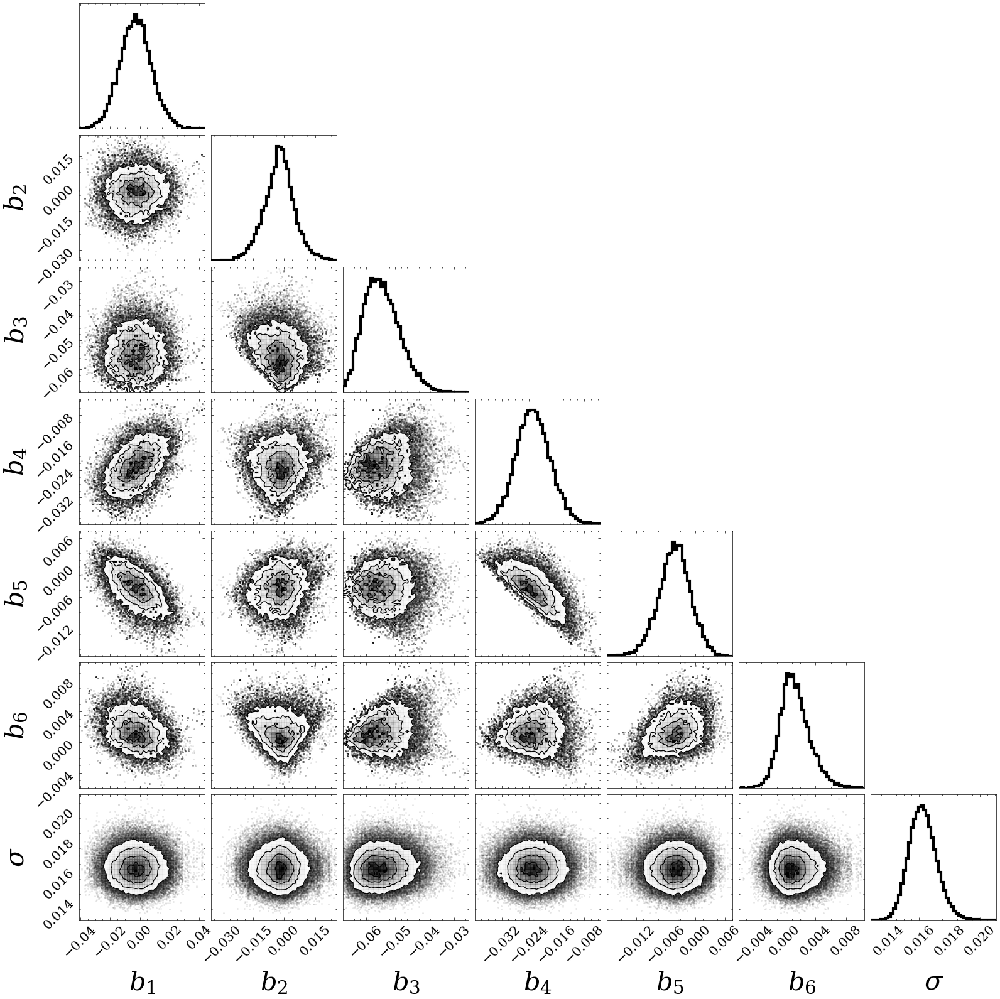

In [75]:
label_global = [f'$b_{i}$' for i in range(1, components_kept+1)]
label_global.append(f'$\sigma$')

plt.rcParams['text.usetex'] = False
plt.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'

plt.rc("xtick", labelsize=15)
plt.rc("ytick", labelsize=15)

figure = corner.corner(samples_simplex,bins=50, dpi=300, hist_kwargs={"linewidth": 3},
                       labels=label_global, 
                    #    truths=np.append(beta,np.sqrt(sigma_squared)),
                    #    truth_color="r",
                       label_kwargs={"fontsize": 30},labelpad=0.1)
plt.show()

In [76]:
model_weights_simplex = []
for beta in samples_simplex:
    model_weights_simplex.append(np.dot(beta[:-1], Vt_hat) + np.full(len(Vt_hat[0]) , 1/len(Vt_hat[0])))
model_weights_simplex= np.array(model_weights_simplex)

In [77]:
lower_radius_simplex_20, median_radius_simplex_20, upper_radius_simplex_20 = rndm_m_radius_calculator(model_weights_simplex, filtered_model_predictions_radius_20, samples_simplex)
lower_radius_simplex_28, median_radius_simplex_28, upper_radius_simplex_28 = rndm_m_radius_calculator(model_weights_simplex, filtered_model_predictions_radius_28, samples_simplex)
lower_radius_simplex_50, median_radius_simplex_50, upper_radius_simplex_50 = rndm_m_radius_calculator(model_weights_simplex, filtered_model_predictions_radius_50, samples_simplex)
lower_radius_simplex_82, median_radius_simplex_82, upper_radius_simplex_82 = rndm_m_radius_calculator(model_weights_simplex, filtered_model_predictions_radius_82, samples_simplex)

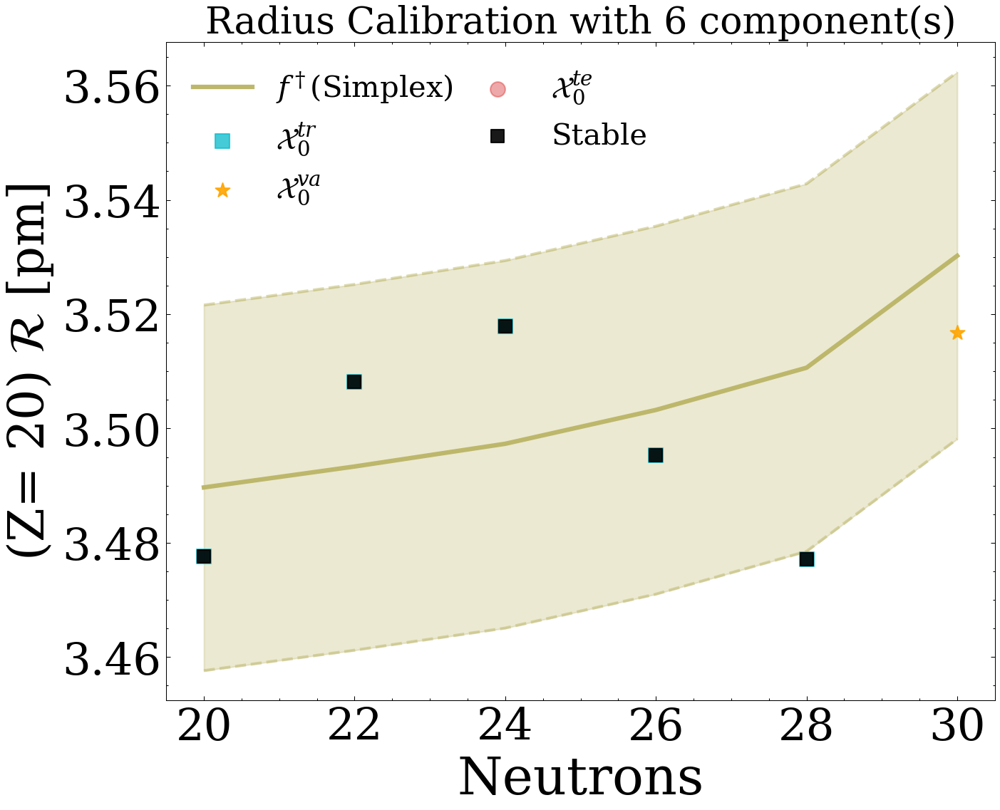

In [78]:
supermodel_predictions_radius_range_simplex_20 = [lower_radius_simplex_20, median_radius_simplex_20, upper_radius_simplex_20]
# title = 'Radius Calibration'
# savefig_20_radius = 'Plots/Heterogeneous Real Scaled Analysis/Radius predictions/Unconstrained CR forecasts for Z = 20 - Radius Analysis - 2PCs.png'
plot_filtered_supermodel(supermodel_predictions_radius_range_simplex_20, filtered_models_output_radius_list_20, filtered_models_output_radius_stable_20, 20, 'pm', 'R', 'Simplex', components_kept )
# plt.savefig(f'Plots/Radii Data/BMM - Radii/Ca Radii BMM with {components_kept} components')
plt.show()

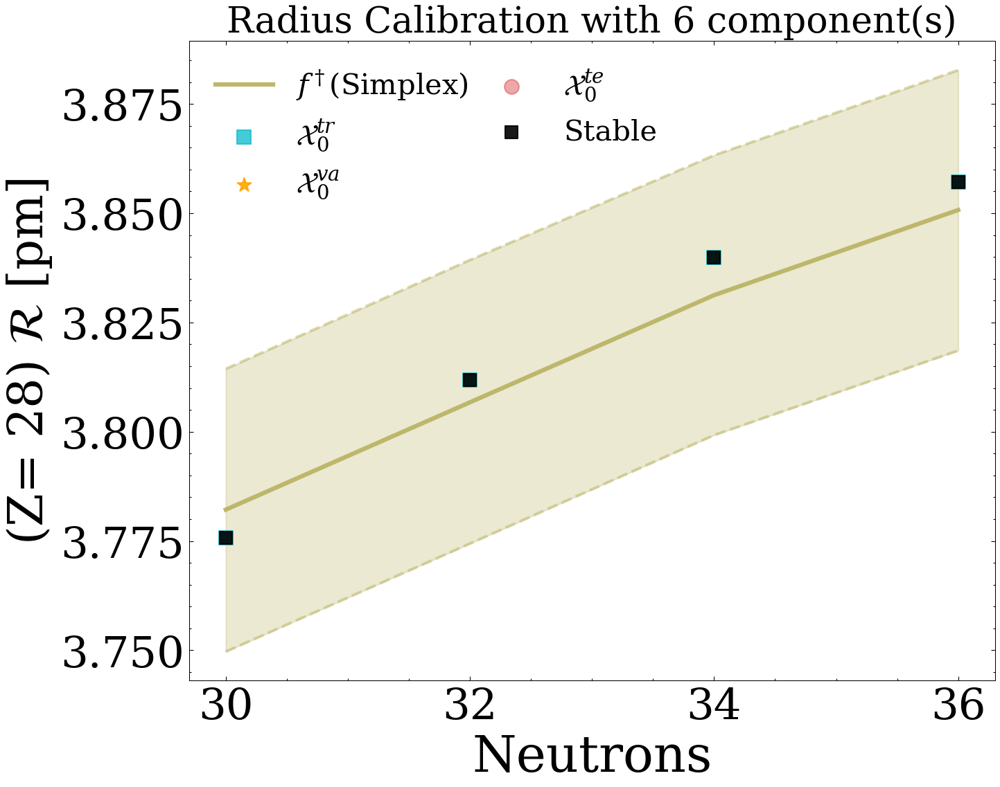

In [79]:
supermodel_predictions_radius_range_simplex_28 = [lower_radius_simplex_28, median_radius_simplex_28, upper_radius_simplex_28]
# title = 'Radius Calibration'
# savefig_20_radius = 'Plots/Heterogeneous Real Scaled Analysis/Radius predictions/Unconstrained CR forecasts for Z = 20 - Radius Analysis - 2PCs.png'
plot_filtered_supermodel(supermodel_predictions_radius_range_simplex_28, filtered_models_output_radius_list_28, filtered_models_output_radius_stable_28, 28, 'pm', 'R', 'Simplex', components_kept )
# plt.savefig(f'Plots/Radii Data/BMM - Radii/Ca Radii BMM with {components_kept} components')
plt.show()

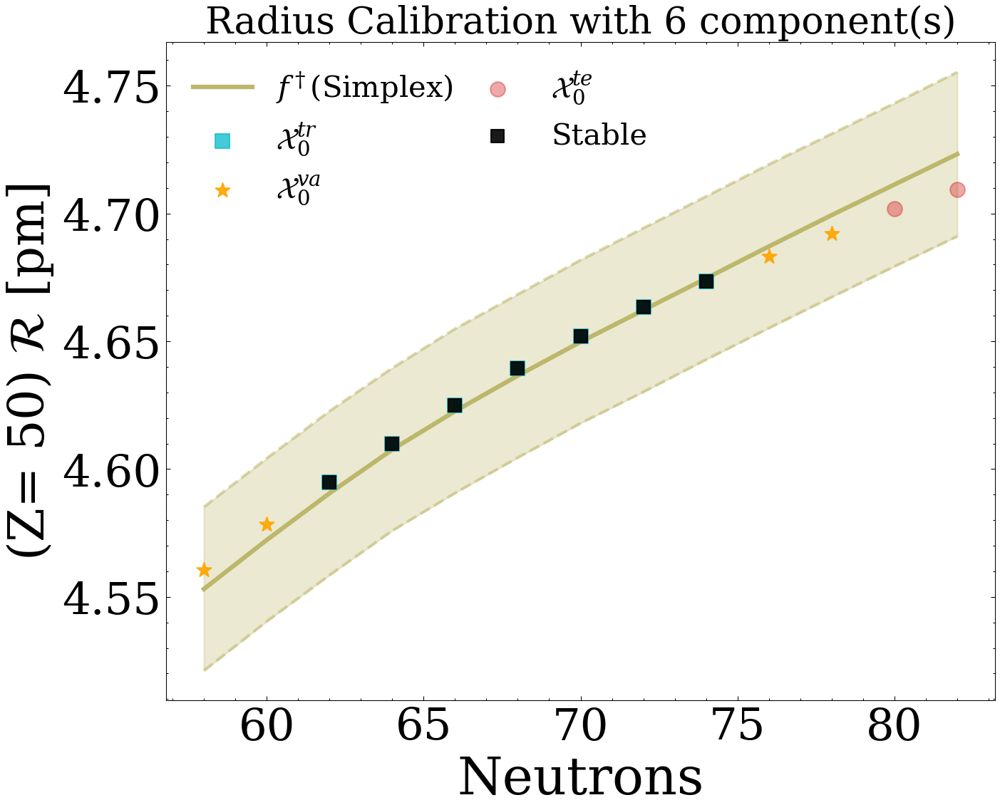

In [80]:
supermodel_predictions_radius_range_simplex_50 = [lower_radius_simplex_50, median_radius_simplex_50, upper_radius_simplex_50]
# title = 'Radius Calibration'
# savefig_20_radius = 'Plots/Heterogeneous Real Scaled Analysis/Radius predictions/Unconstrained CR forecasts for Z = 20 - Radius Analysis - 2PCs.png'
plot_filtered_supermodel(supermodel_predictions_radius_range_simplex_50, filtered_models_output_radius_list_50, filtered_models_output_radius_stable_50, 50, 'pm', 'R', 'Simplex', components_kept )
# plt.savefig(f'Plots/Radii Data/BMM - Radii/Ca Radii BMM with {components_kept} components')
plt.show()

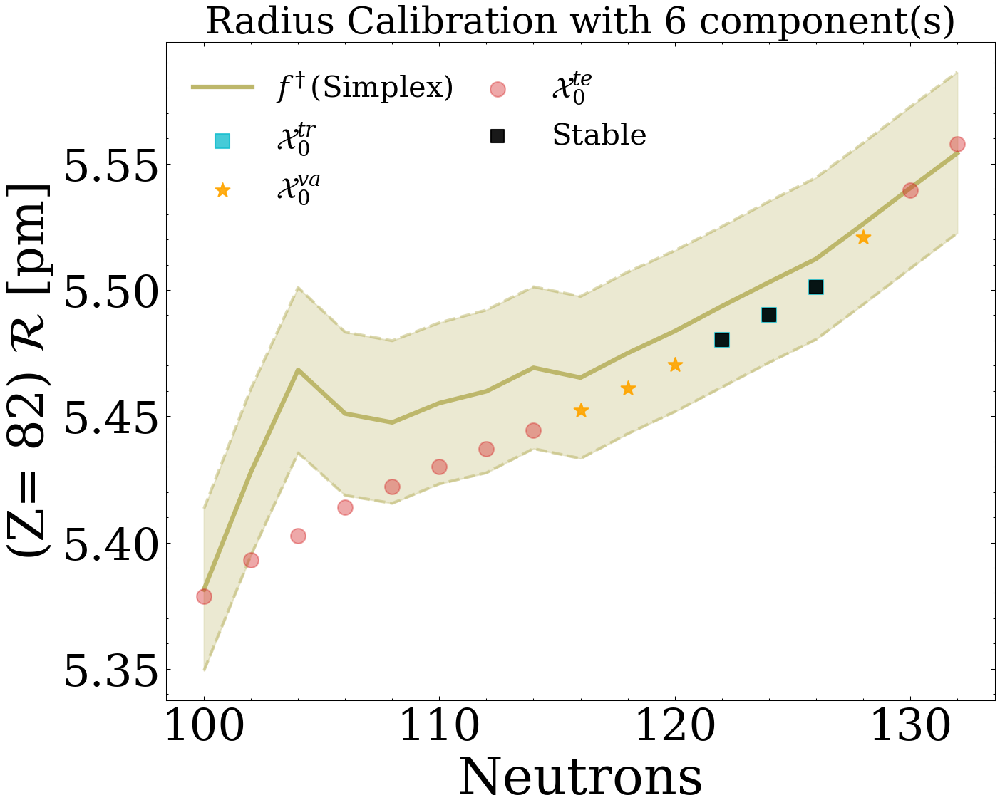

In [81]:
supermodel_predictions_radius_range_simplex_82 = [lower_radius_simplex_82, median_radius_simplex_82, upper_radius_simplex_82]
# title = 'Radius Calibration'
# savefig_20_radius = 'Plots/Heterogeneous Real Scaled Analysis/Radius predictions/Unconstrained CR forecasts for Z = 20 - Radius Analysis - 2PCs.png'
plot_filtered_supermodel(supermodel_predictions_radius_range_simplex_82, filtered_models_output_radius_list_82, filtered_models_output_radius_stable_82, 82, 'pm', 'R', 'Simplex', components_kept )
# plt.savefig(f'Plots/Radii Data/BMM - Radii/Ca Radii BMM with {components_kept} components')
plt.show()

<>:21: SyntaxWarning: invalid escape sequence '\o'
<>:21: SyntaxWarning: invalid escape sequence '\o'
C:\Users\congn\AppData\Local\Temp\ipykernel_9288\4061650718.py:21: SyntaxWarning: invalid escape sequence '\o'
  plt.ylabel('$\omega_k$',fontsize=35)


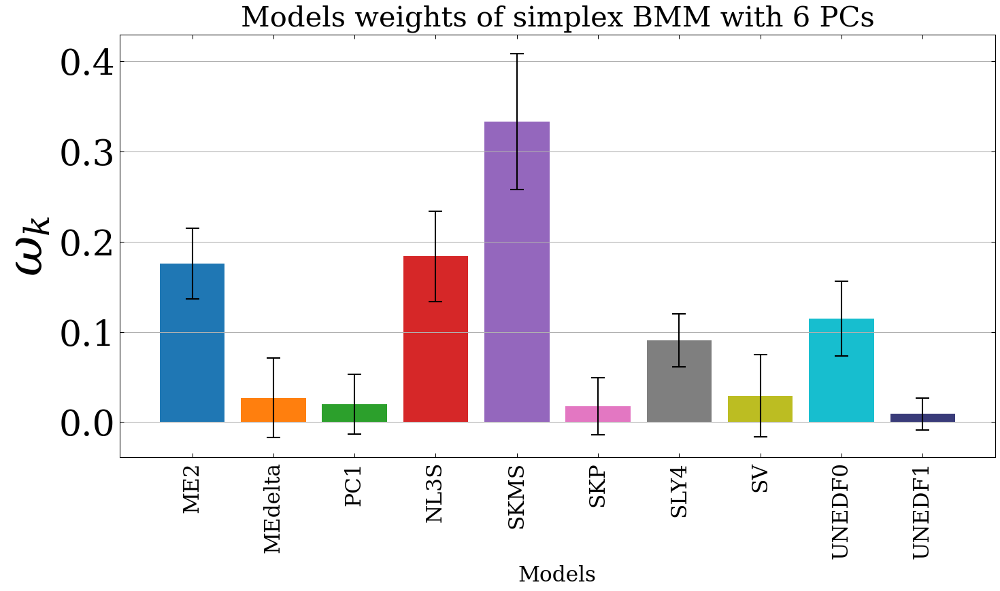

In [82]:
plt.rc("xtick", labelsize=20)
plt.rc("ytick", labelsize=20)
# labels=list(models_output.keys())
plt.figure(figsize=(10, 6),dpi=150)
# y_max=0.6


i=0
for model in key_list:
        
        # ax.plot(filtered_models_output["N"], filtered_models_output[key_list[model_index]], 
        #         label = n_Labels[class_index], color=colors[class_index],alpha = alpha_models,linewidth=5)
        # plt.bar(model , np.mean(samples_naive_space_sigma.T[i]), color=colors[i])
        plt.bar(model , np.mean(model_weights_simplex.T[i]),yerr=2*np.std(model_weights_simplex.T[i]), color=colors[i],capsize=5)
        i=i+1

plt.minorticks_off()


plt.xlabel('Models',fontsize=15)
plt.ylabel('$\omega_k$',fontsize=35)
# plt.ylim(-0.2,0.5)
# plt.yticks([0, 0.2, 0.4])
plt.xticks(fontsize=15,rotation='vertical')
plt.yticks(fontsize=25)
plt.grid(axis='y')
plt.title(f'Models weights of simplex BMM with {components_kept} PCs', fontsize= 20)
plt.tight_layout()
# plt.savefig(f'Plots/Radii Data/Models weights/Uncontrained BMM models weights with {components_kept} PCs')
plt.show()